## <ins>Import dependencies

In [47]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import scipy.stats as stats
import io
import base64

import warnings
warnings.filterwarnings("ignore")

## <ins>Read in the data from the preprocessed csv files

### df_cleaned

In [48]:
# Get the current directory of the notebook
current_dir = os.path.dirname(os.path.abspath(""))

# Navigate up two levels to reach the Project4 directory
project_dir = os.path.dirname(current_dir)

# Construct the absolute path to the CSV file
file_path = os.path.join(project_dir, "data/df_output/df_cleaned.csv")

# Load the CSV file
df_data = pd.read_csv(file_path)

# Show the df
df_data.head(2)

,IDUSGS,PLAYTYPE,WELLTYPE,FORMSIMPLE,TDS,LATITUDE,LONGITUDE,STATE,COUNTY,PROVINCE,...,FeTot,K,Li,Mg,Na,SO4,Sr,Zn,CHARGEBAL,BASIN_CATEGORY
0,63,Shale,Shale Gas,Marcellus,54800.0,40.441658,-79.986932,Pennsylvania,Allegheny,Appalachian Basin,...,27.40,0.0,21.5,295.0,12000.0,105.0,736.5,0.0839,-10.5,Appalachian
1,64,Shale,Shale Gas,Marcellus,26100.0,40.441658,-79.986932,Pennsylvania,Allegheny,Appalachian Basin,...,6.47,0.0,12.5,188.0,6920.0,116.0,215.0,0.0321,-3.0,Appalachian


In [49]:
df_data.columns

Index(['IDUSGS', 'PLAYTYPE', 'WELLTYPE', 'FORMSIMPLE', 'TDS', 'LATITUDE',
       'LONGITUDE', 'STATE', 'COUNTY', 'PROVINCE', 'REGION', 'WELLNAME', 'API',
       'DEPTHUPPER', 'DEPTHLOWER', 'PERIOD', 'DATESAMPLE', 'PH', 'B', 'Ba',
       'Br', 'HCO3', 'Ca', 'Cl', 'FeTot', 'K', 'Li', 'Mg', 'Na', 'SO4', 'Sr',
       'Zn', 'CHARGEBAL', 'BASIN_CATEGORY'],
      dtype='object')

In [50]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60658 entries, 0 to 60657
Data columns (total 34 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   IDUSGS          60658 non-null  int64  
 1   PLAYTYPE        60658 non-null  object 
 2   WELLTYPE        60658 non-null  object 
 3   FORMSIMPLE      60658 non-null  object 
 4   TDS             60658 non-null  float64
 5   LATITUDE        60658 non-null  float64
 6   LONGITUDE       60658 non-null  float64
 7   STATE           60658 non-null  object 
 8   COUNTY          60026 non-null  object 
 9   PROVINCE        60658 non-null  object 
 10  REGION          60658 non-null  object 
 11  WELLNAME        54693 non-null  object 
 12  API             34447 non-null  float64
 13  DEPTHUPPER      47354 non-null  float64
 14  DEPTHLOWER      40757 non-null  float64
 15  PERIOD          48402 non-null  object 
 16  DATESAMPLE      46382 non-null  object 
 17  PH              45174 non-null 

### df_{basin}_pca_with_target

In [51]:
# Get the current directory of the notebook
current_dir = os.path.dirname(os.path.abspath(""))

# Navigate up two levels to reach the Project4 directory
project_dir = os.path.dirname(current_dir)

dfs = []  # Create an empty list to store dataframes
basins = df_data['BASIN_CATEGORY'].unique()

for basin in basins:
    # Construct the absolute path to the CSV file
    file_path = os.path.join(project_dir, f"data/pca_data/{basin}_pca_with_target.csv")

    # Load the CSV file
    df = pd.read_csv(file_path)

    # Add a new column for the basin name
    df['Basin'] = basin

    # Append the dataframe to the list
    dfs.append(df)

# Concatenate all the dataframes into one
df_pca_all_basins = pd.concat(dfs, ignore_index=True)

# Show the combined dataframe
print('Combined Dataframe:')
print('===============================')
print(df_pca_all_basins.head(2))
print('-------------------------------')
print(df_pca_all_basins.info())


Combined Dataframe:
        PC1       PC2       PC3    Li        Basin
0 -3.541446  1.330795 -0.897703  21.5  Appalachian
1 -3.684085  0.751634 -1.124375  12.5  Appalachian
-------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60658 entries, 0 to 60657
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PC1     60658 non-null  float64
 1   PC2     60658 non-null  float64
 2   PC3     60658 non-null  float64
 3   Li      4131 non-null   float64
 4   Basin   60658 non-null  object 
dtypes: float64(4), object(1)
memory usage: 2.3+ MB
None


## <ins>Generate SVR regression models for each basin for consideration

### Establishing function for running models for each Basin given certain variable inputs

#### df_pca_all_basins as input

In [52]:
def generate_svr_models_by_basin_from_pca(df, round, basins, test_size, random_state, kernel_values, c_values, epsilon_values):
    
    df_starting = df.copy()

    # Create an empty list to store results for each basin
    results_list = []

    for basin in basins:
        
        print('===============================')
        print(f'{basin}')
        print('===============================')

        '''--------------------------------------------------------------------------------------------------------------'''
        '''Finalize data preprocessing per input variables / requirements of SVR regression model'''

        # Drop rows from anything that isn't the 'basin' at hand
        df_basin = df_starting[df_starting['Basin'] == basin]

        # Drop the 'Basin' column as it is no longer needed
        df_basin.drop('Basin', axis=1, inplace=True)

        # Drop null values in the 'Li' (target) column
        df_basin.dropna(subset=['Li'], inplace=True)

        # Drop any remaining null values
        df_basin.dropna(inplace=True)

        # Get the remaining number of rows
        num_rows = df_basin.shape[0]
        print("Number of data points: ", num_rows)

        if num_rows > 0:

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Split testing/training sets'''

            # Splitting the data into features (X) and the target variable (y)
            y = df_basin['Li'].copy()                   # Target variable
            X = df_basin.drop(columns=['Li']).copy()    # Features

            # Splitting the data into training and testing sets
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Train & test model'''

            # Create a parameter grid
            param_grid = {'kernel': kernel_values, 'C': c_values, 'epsilon': epsilon_values}

            # Determine the number of splits for cross-validation
            n_samples = X_train.shape[0]
            # Print the number of samples in the training dataset
            print("Number of samples in the training dataset:", n_samples)
            n_splits = min(5, n_samples)  # Use 5 splits or the number of samples, whichever is smaller
            n_splits = max(2, n_splits)  # Ensure there are at least 2 splits

            # Perform grid search with cross-validation
            grid_search = GridSearchCV(SVR(), param_grid, cv=n_splits, scoring='neg_mean_squared_error')
            grid_search.fit(X_train, y_train)

            # Get the best parameters
            best_params = grid_search.best_params_
            print("Best parameters:", best_params)

            # Get the actual values used in the model
            best_kernel = best_params['kernel']
            best_C = best_params['C']
            best_epsilon = best_params['epsilon']

            # Get the best model
            best_model = grid_search.best_estimator_

            # Evaluate the best model
            y_pred = best_model.predict(X_test)

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Get all the performance metrics...'''

            # Calculate the mean squared error and the root mean squared error
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Calculate the variance of the target variable
            target_variance = np.var(y_test)

            # Calculate the mean absolute error
            mae = mean_absolute_error(y_test, y_pred)
            
            # Calculate R-squared
            r2 = r2_score(y_test, y_pred)

            # Calculate the percentage of predictions within certain percentage ranges
            percentage_ranges = [5, 15, 25, 50]  # Percentage ranges
            within_ranges = {}
            for percentage in percentage_ranges:
                threshold = (percentage / 100) * np.mean(y_test)
                within_ranges[f'within_{percentage}_percent'] = np.mean(np.abs(y_test - y_pred) <= threshold) * 100

            # Print the metrics
            print('-------------------------------')
            print("MODEL PERFORMANCE METRICS")
            print('-------------------------------')
            print("Variance of the target variable:", target_variance)
            print("MSE of the model:", mse)
            # Compare the MSE to the variance
            if mse < target_variance:
                print("The model's MSE is smaller than the variance of the target variable.")
                print("The model is capturing a significant portion of the variability in the target variable.")
            else:
                print("The model's MSE is close to or larger than the variance of the target variable.")
                print("The model's performance may be limited compared to the variability of the target variable.")
            print("RMSE of the model:", rmse)
            print("MAE of the best SVR model:", mae)
            print("R-squared (Coefficient of Determination):", r2)
            for percentage in percentage_ranges:
                print(f"Percentage of predictions within {percentage}% of the correct values:", within_ranges[f'within_{percentage}_percent'])
            print('-------------------------------')

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Generate descriptive plots'''

            # Plot actual vs predicted values
            plt.scatter(y_test, y_pred, alpha=0.5)
            plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Diagonal line
            colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon']
            for i, percentage in enumerate(percentage_ranges):
                threshold = (percentage / 100) * np.mean(y_test)
                plt.plot([min(y_test), max(y_test)], [min(y_test) + threshold, max(y_test) + threshold],
                        linestyle='--', color=colors[i], label=f'Within {percentage}%')
                plt.plot([min(y_test), max(y_test)], [min(y_test) - threshold, max(y_test) - threshold],
                        linestyle='--', color=colors[i])
            plt.xlabel('Actual')
            plt.ylabel('Predicted')
            plt.title(f'Actual vs Predicted Li Concentrations for {basin}')
            plt.legend()
            plt.show()

            # Plot histogram of predicted Li concentration values
            plt.hist(y_pred, bins=20)
            plt.xlabel('Predicted Li Concentration')
            plt.ylabel('Frequency')
            plt.title(f'Histogram of Predicted Li Concentrations for {basin}')
            plt.show()

            # Plot histogram of residuals
            residuals = y_test - y_pred
            plt.hist(residuals, bins=20)
            plt.xlabel('Residuals')
            plt.ylabel('Frequency')
            plt.title(f'Histogram of Residuals for {basin}')
            plt.show()

            # Create a Q-Q plot of residuals
            stats.probplot(residuals, dist="norm", plot=plt)
            plt.title(f'Q-Q Plot of Residuals for {basin}')
            plt.show()

            '''--------------------------------------------------------------------------------------------------------------'''
            '''Add results to a list to feed to the results dataframe'''

            # Append results to the list
            results_list.append([round, basin, num_rows, len(X.columns), list(X.columns), kernel_values, best_kernel, c_values, best_C, epsilon_values, best_epsilon, target_variance, mse, rmse, mae, r2] + list(within_ranges.values()))

        else: 
            print(f'No round{round} model generated for {basin}.')

    # Create a DataFrame from the results list
    columns = ['round', 'basin', 'data_row_count','feature_quantity', 'feature_list', 'kernel_options', 'best_kernel', 'c_options', 'best_c', 'epsilon_options', 'best_epsilon', 'target_variable_variance', 'mse', 'rmse', 'mae', 'r2'] + [f'within_{percentage}_percent' for percentage in percentage_ranges]
    
    df_results = pd.DataFrame(results_list, columns=columns)

    # Round all values in the DataFrame to two decimal places
    df_results = df_results.round(2)

    # Sort the DataFrame
    df_results.sort_values(by=['within_15_percent'], ascending=False, inplace=True)

    return df_results


### ROUND 1 (PCA)

Appalachian
Number of data points:  652
Number of samples in the training dataset: 456
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3846.8820694580386
MSE of the model: 1531.8462699923195
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 39.13880772318339
MAE of the best SVR model: 23.657398556368662
R-squared (Coefficient of Determination): 0.6017953650946906
Percentage of predictions within 5% of the correct values: 15.816326530612246
Percentage of predictions within 15% of the correct values: 35.714285714285715
Percentage of predictions within 25% of the correct values: 57.6530612244898
Percentage of predictions within 50% of the correct values: 75.51020408163265
-------------------------------


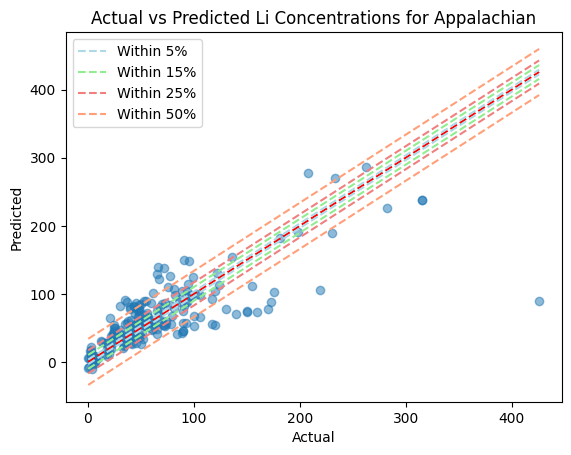

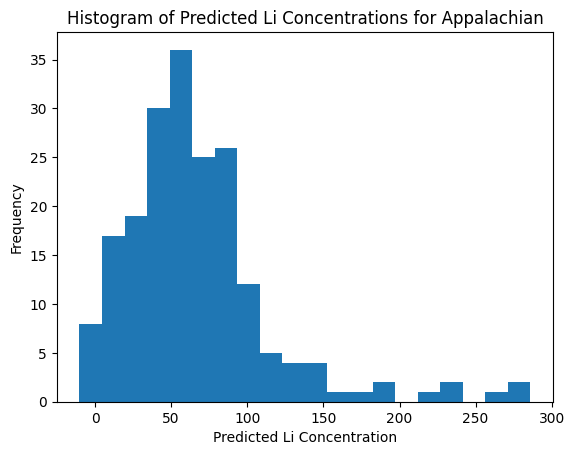

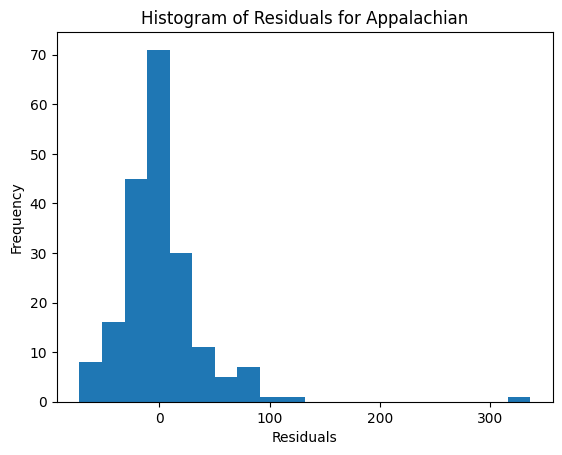

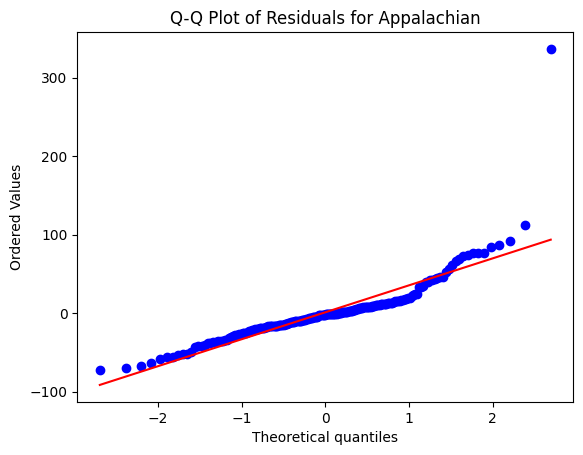

Permian
Number of data points:  481
Number of samples in the training dataset: 336
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 5745.300019005945
MSE of the model: 5883.584660963674
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 76.70452829503401
MAE of the best SVR model: 16.764153338571887
R-squared (Coefficient of Determination): -0.024069176805436188
Percentage of predictions within 5% of the correct values: 17.93103448275862
Percentage of predictions within 15% of the correct values: 44.13793103448276
Percentage of predictions within 25% of the correct values: 66.89655172413794
Percentage of predictions within 50% of the correct values: 89.65517241379311
-------------------------------


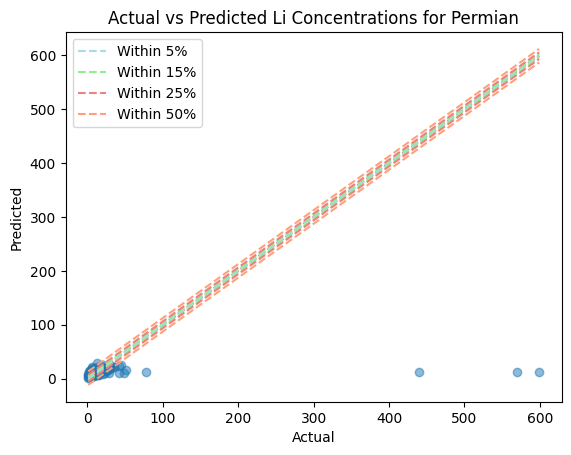

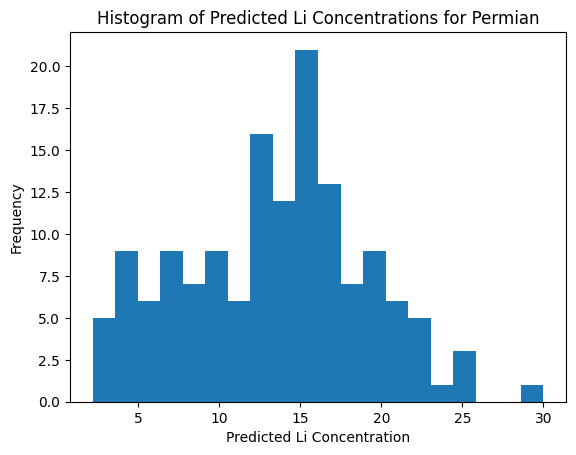

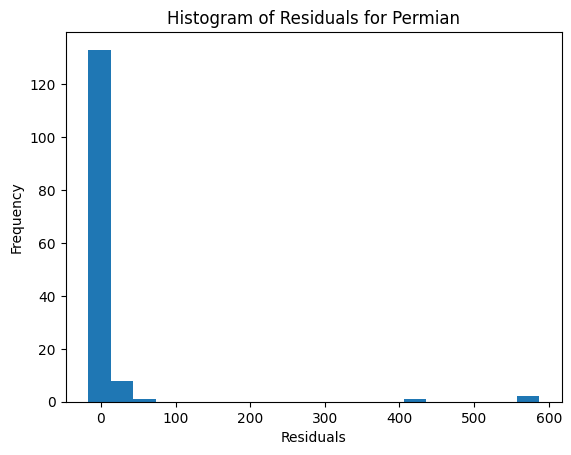

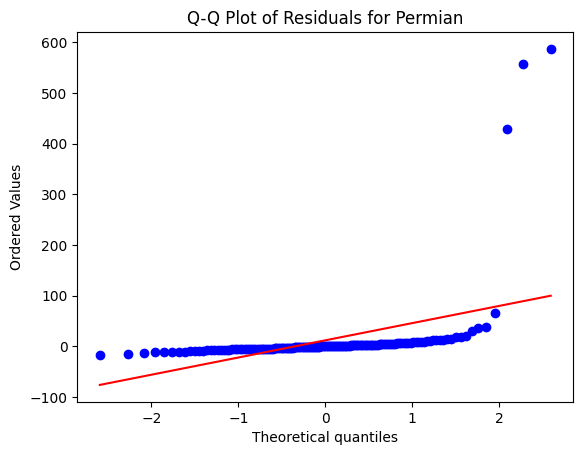

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 177
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 283.78324827120935
MSE of the model: 79.04964135482447
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.890986523149412
MAE of the best SVR model: 6.968698741567593
R-squared (Coefficient of Determination): 0.7214435952918639
Percentage of predictions within 5% of the correct values: 3.896103896103896
Percentage of predictions within 15% of the correct values: 28.57142857142857
Percentage of predictions within 25% of the correct values: 46.75324675324675
Percentage of predictions within 50% of the correct values: 79.22077922077922
-------------------------------


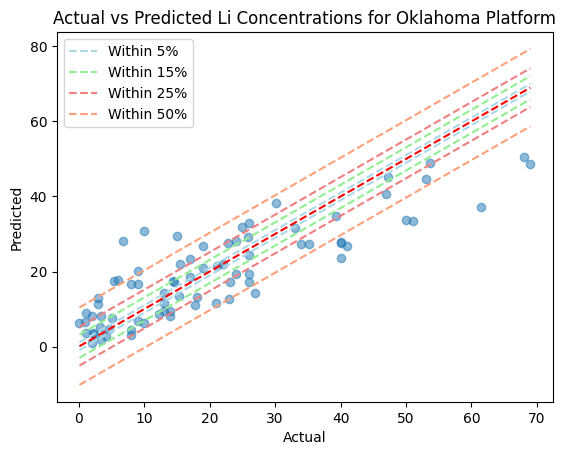

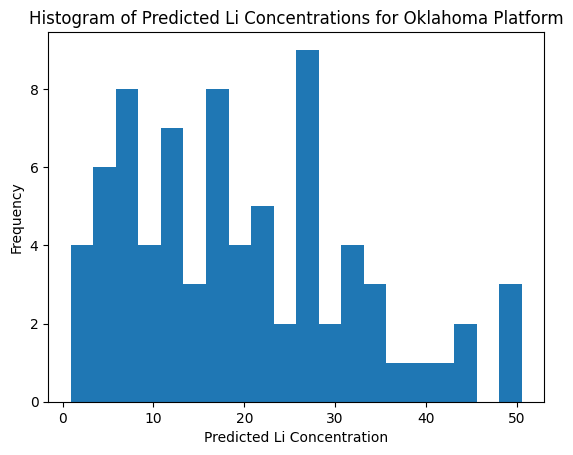

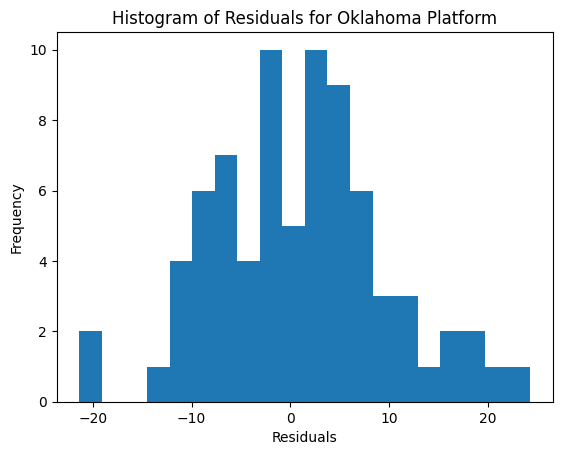

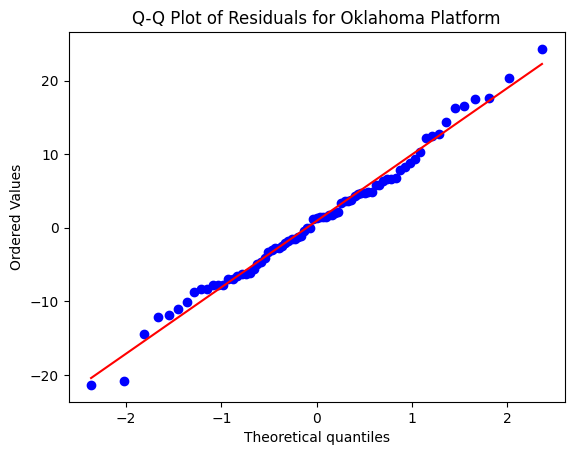

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 621
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 16797.03549157903
MSE of the model: 1341.8413140420178
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 36.63115223470343
MAE of the best SVR model: 17.493140846155043
R-squared (Coefficient of Determination): 0.920114396691325
Percentage of predictions within 5% of the correct values: 31.46067415730337
Percentage of predictions within 15% of the correct values: 62.92134831460674
Percentage of predictions within 25% of the correct values: 69.28838951310861
Percentage of predictions within 50% of the correct values: 81.64794007490637
-------------------------------


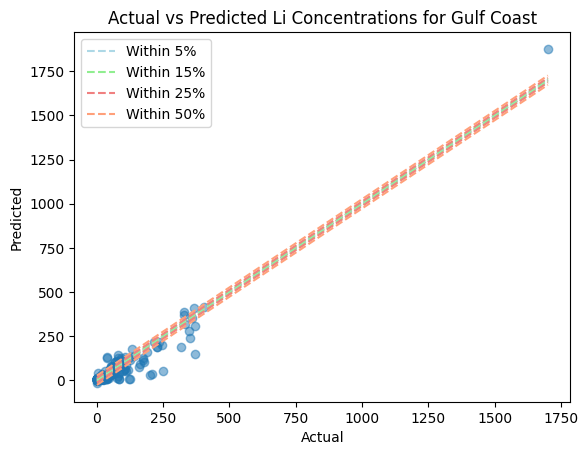

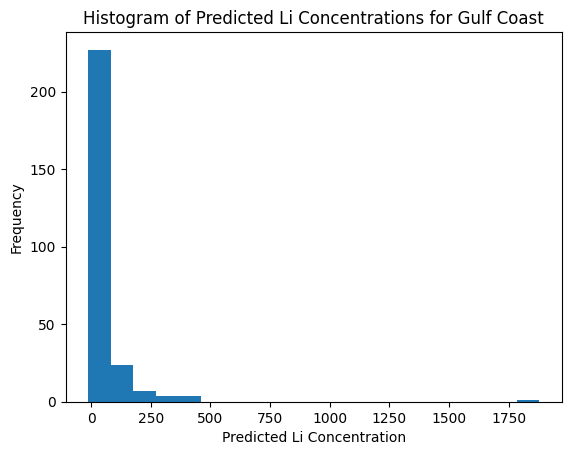

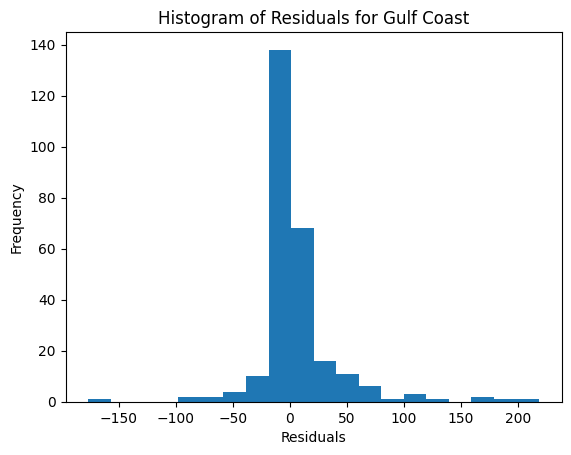

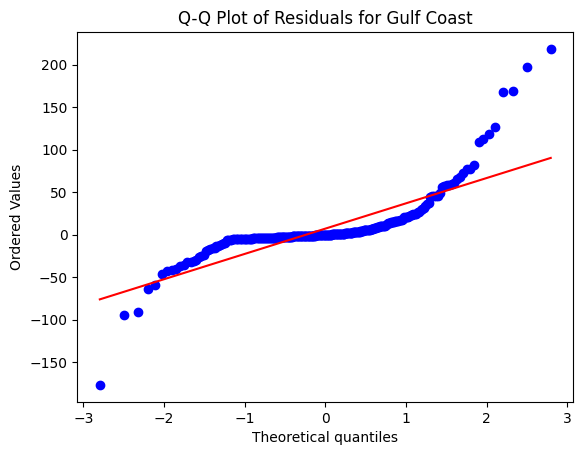

Williston
Number of data points:  502
Number of samples in the training dataset: 351
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2074.040156853596
MSE of the model: 995.4436018616391
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 31.55065136984717
MAE of the best SVR model: 16.60780239800835
R-squared (Coefficient of Determination): 0.5200461290143157
Percentage of predictions within 5% of the correct values: 13.245033112582782
Percentage of predictions within 15% of the correct values: 37.086092715231786
Percentage of predictions within 25% of the correct values: 50.331125827814574
Percentage of predictions within 50% of the correct values: 64.90066225165563
-------------------------------


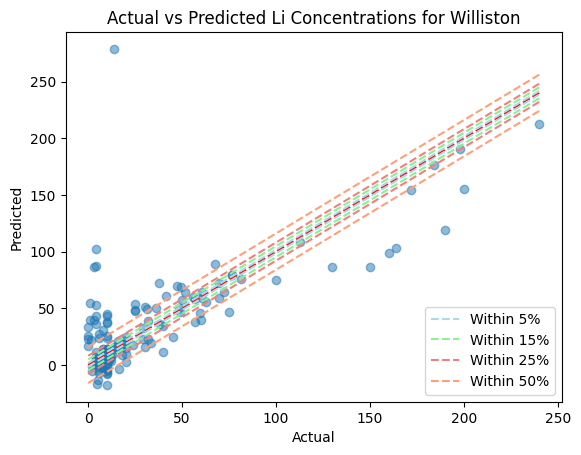

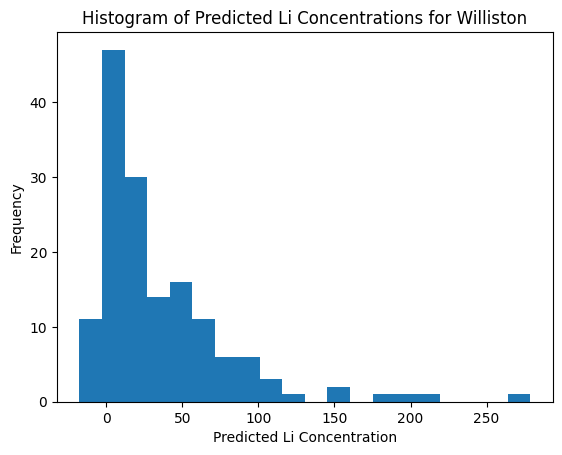

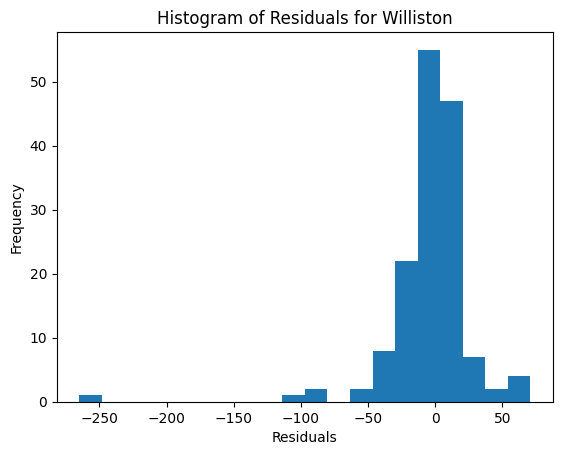

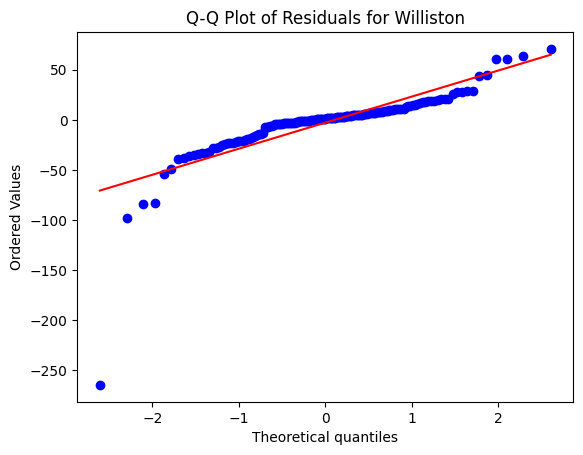

Michigan
Number of data points:  150
Number of samples in the training dataset: 105
Best parameters: {'C': 0.1, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 309.10417758024687
MSE of the model: 111.19499381652665
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 10.544903689295918
MAE of the best SVR model: 7.676316739914463
R-squared (Coefficient of Determination): 0.6402669330224138
Percentage of predictions within 5% of the correct values: 8.88888888888889
Percentage of predictions within 15% of the correct values: 40.0
Percentage of predictions within 25% of the correct values: 55.55555555555556
Percentage of predictions within 50% of the correct values: 77.77777777777779
-------------------------------


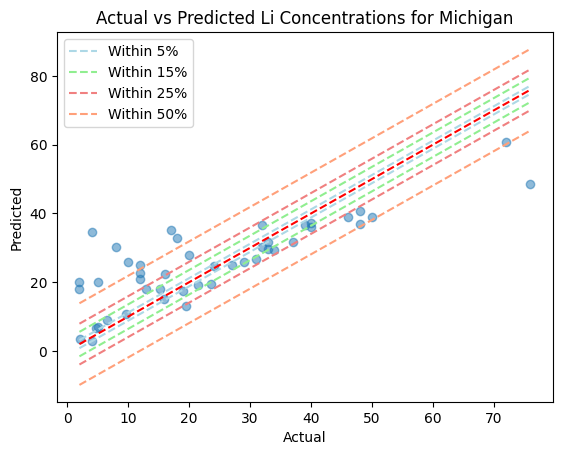

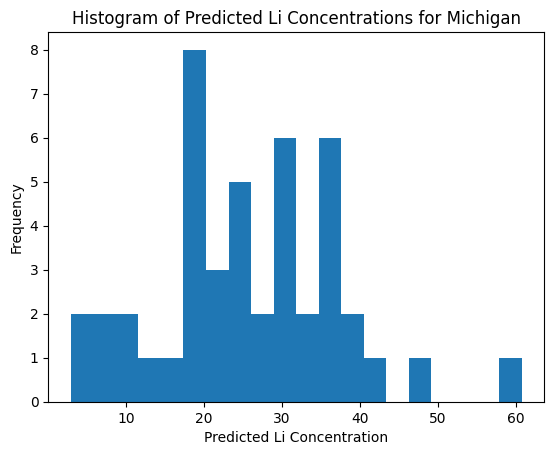

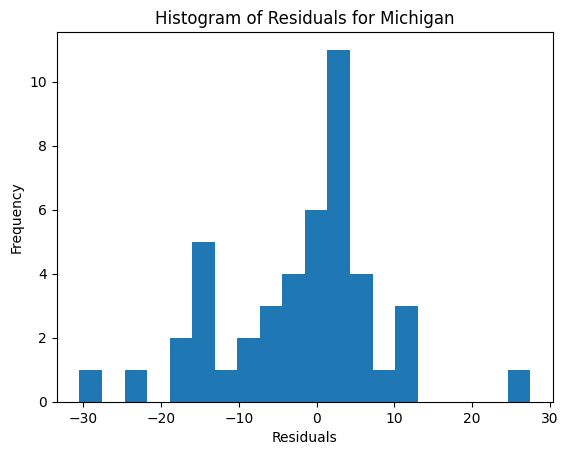

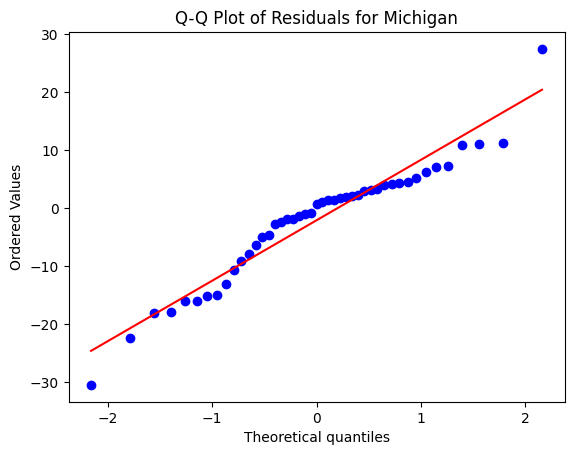

Pacific
Number of data points:  145
Number of samples in the training dataset: 101
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 7.590610782541325
MSE of the model: 1.4117241493156678
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.1881599847308728
MAE of the best SVR model: 0.7583274501390903
R-squared (Coefficient of Determination): 0.8140170547852772
Percentage of predictions within 5% of the correct values: 15.909090909090908
Percentage of predictions within 15% of the correct values: 40.909090909090914
Percentage of predictions within 25% of the correct values: 63.63636363636363
Percentage of predictions within 50% of the correct values: 77.27272727272727
-------------------------------


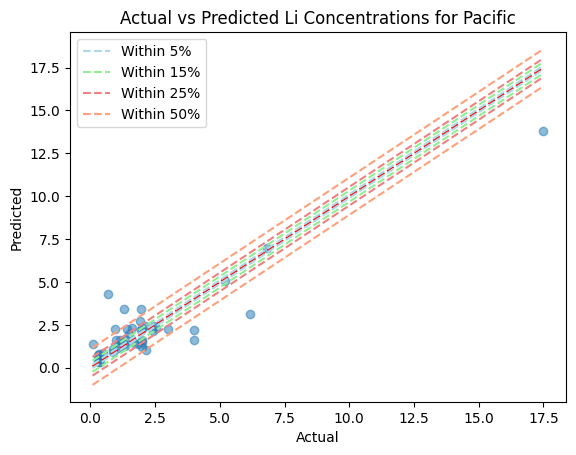

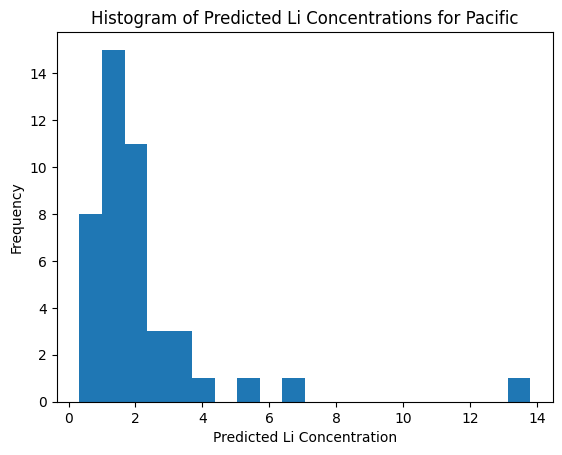

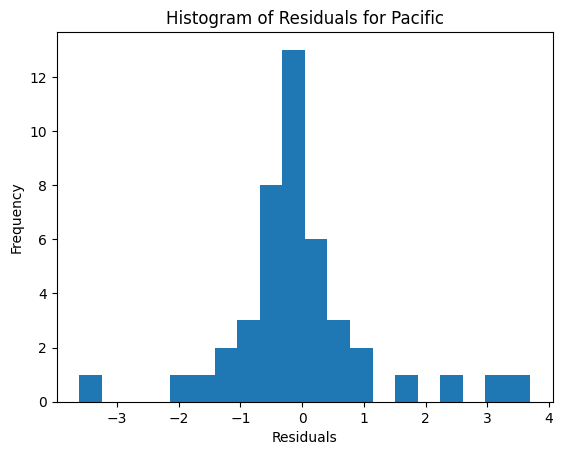

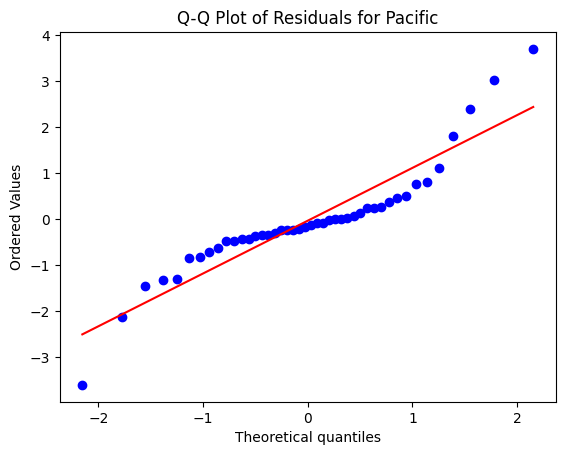

Illinois
Number of data points:  25
Number of samples in the training dataset: 17
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 140.9118484375
MSE of the model: 22.032081100531933
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 4.693834370803036
MAE of the best SVR model: 3.244146458530224
R-squared (Coefficient of Determination): 0.8436463551870584
Percentage of predictions within 5% of the correct values: 25.0
Percentage of predictions within 15% of the correct values: 62.5
Percentage of predictions within 25% of the correct values: 75.0
Percentage of predictions within 50% of the correct values: 87.5
-------------------------------


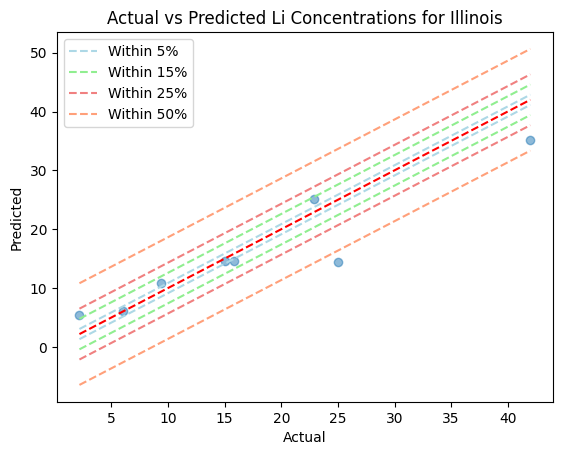

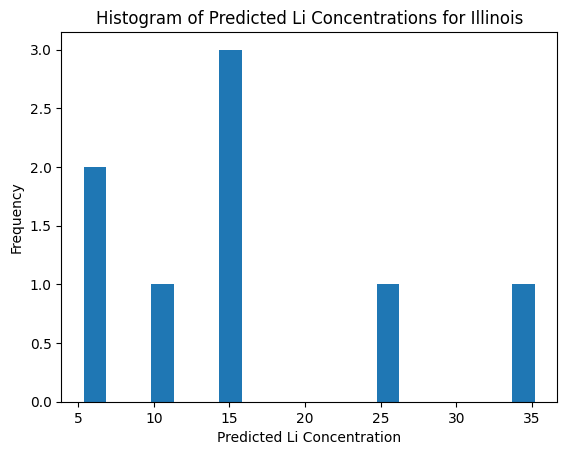

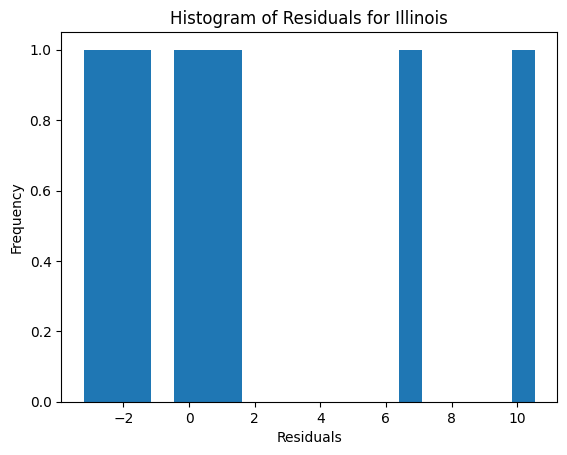

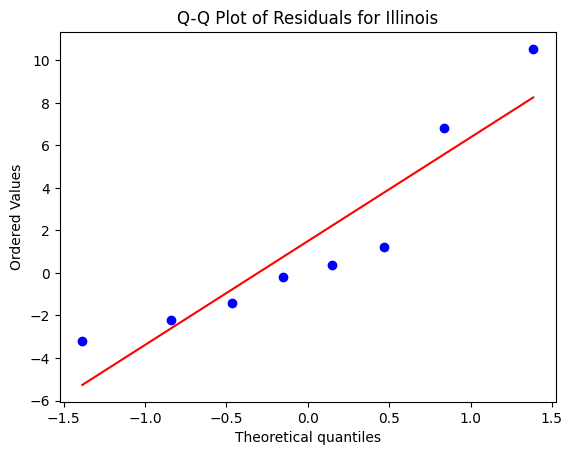

Great Plains
Number of data points:  62
Number of samples in the training dataset: 43
Best parameters: {'C': 1, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 26213.59710083102
MSE of the model: 27737.60798370011
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 166.54611368536976
MAE of the best SVR model: 39.99107388430106
R-squared (Coefficient of Determination): -0.05813818214291455
Percentage of predictions within 5% of the correct values: 68.42105263157895
Percentage of predictions within 15% of the correct values: 89.47368421052632
Percentage of predictions within 25% of the correct values: 94.73684210526315
Percentage of predictions within 50% of the correct values: 94.73684210526315
-------------------------------


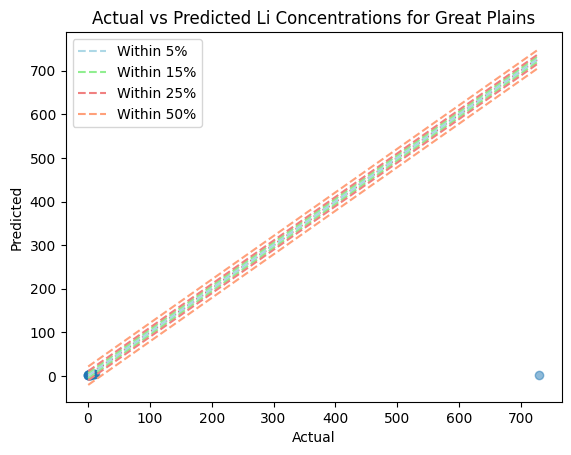

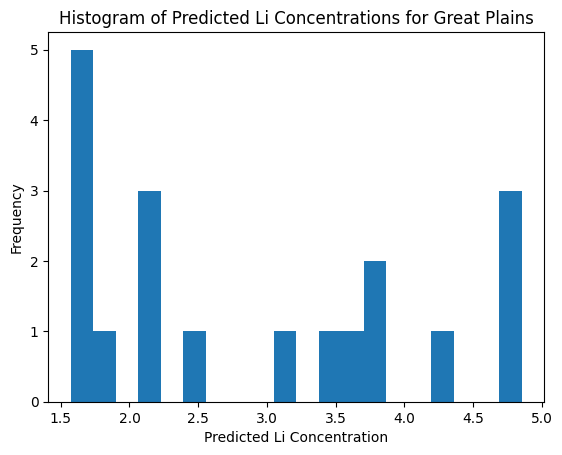

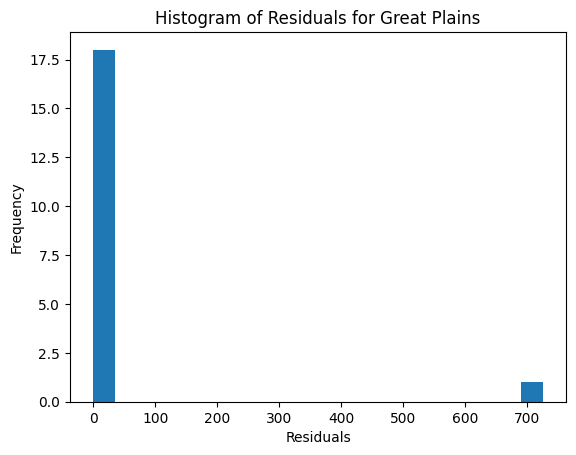

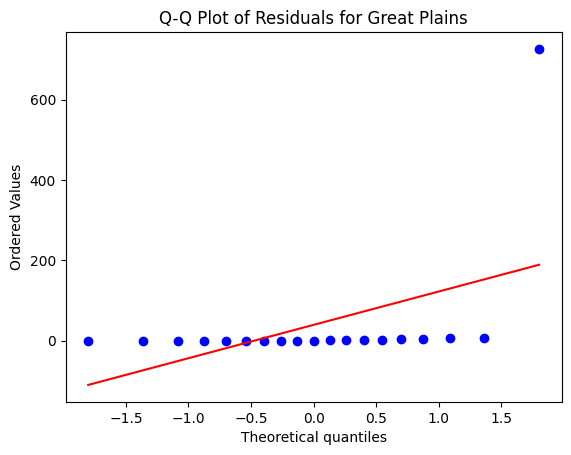

Anadarko
Number of data points:  262
Number of samples in the training dataset: 183
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 18808.841227111043
MSE of the model: 9070.122013450073
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 95.2371881853411
MAE of the best SVR model: 29.10972936358352
R-squared (Coefficient of Determination): 0.5177734819529227
Percentage of predictions within 5% of the correct values: 10.126582278481013
Percentage of predictions within 15% of the correct values: 26.582278481012654
Percentage of predictions within 25% of the correct values: 48.10126582278481
Percentage of predictions within 50% of the correct values: 73.41772151898735
-------------------------------


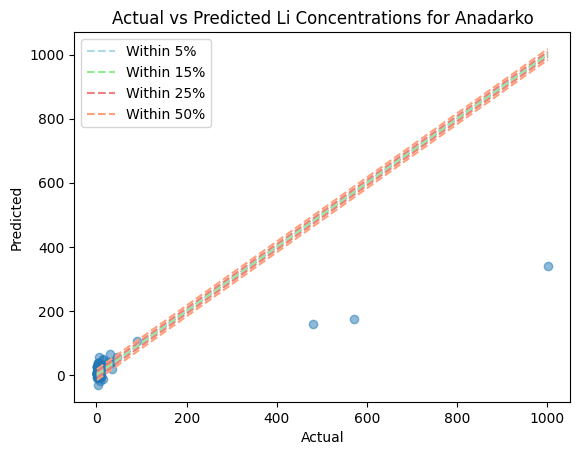

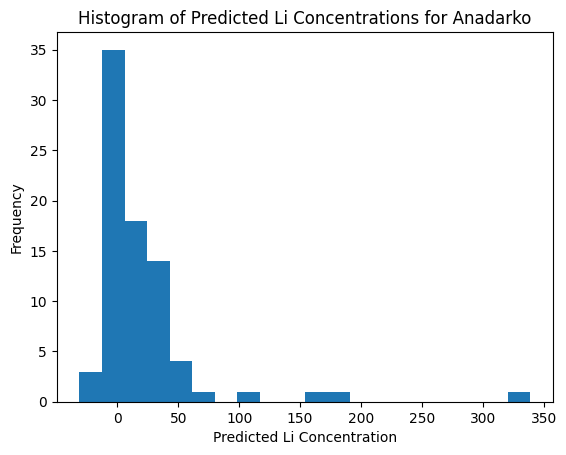

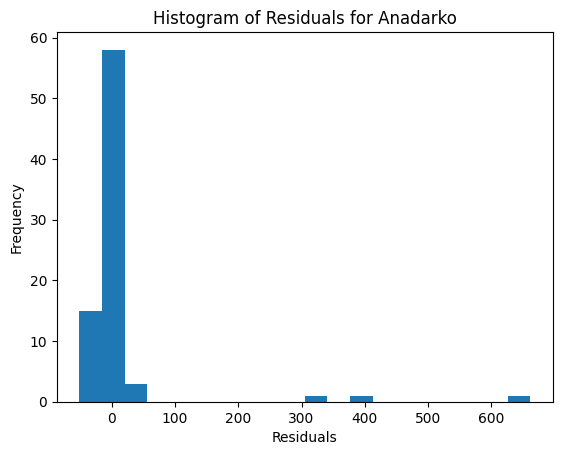

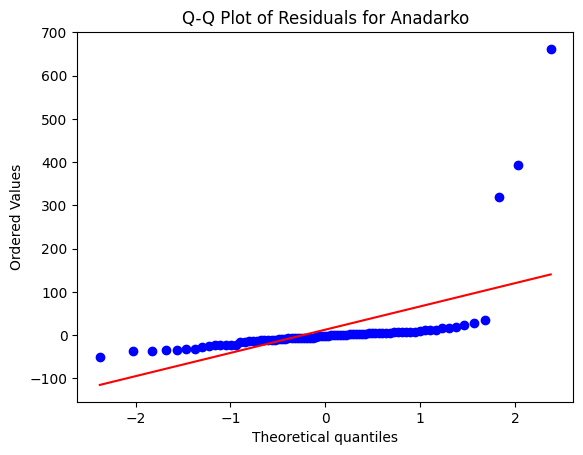

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 485
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 188.66855393629808
MSE of the model: 85.83920273526921
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.264944831744504
MAE of the best SVR model: 3.678907290698069
R-squared (Coefficient of Determination): 0.5450264448189288
Percentage of predictions within 5% of the correct values: 20.192307692307693
Percentage of predictions within 15% of the correct values: 44.230769230769226
Percentage of predictions within 25% of the correct values: 60.57692307692307
Percentage of predictions within 50% of the correct values: 80.28846153846155
-------------------------------


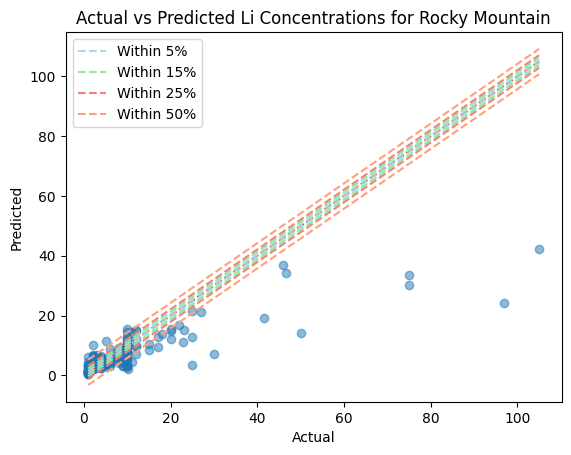

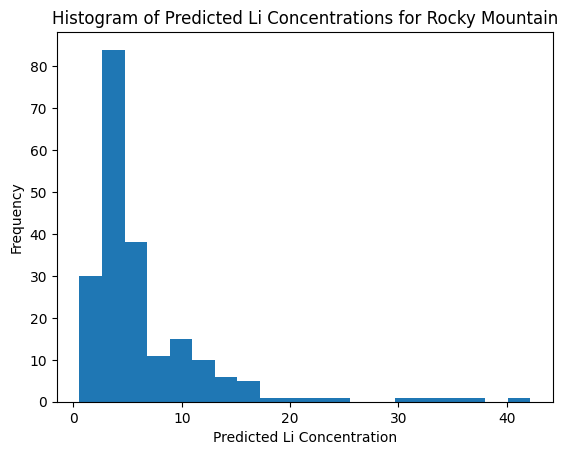

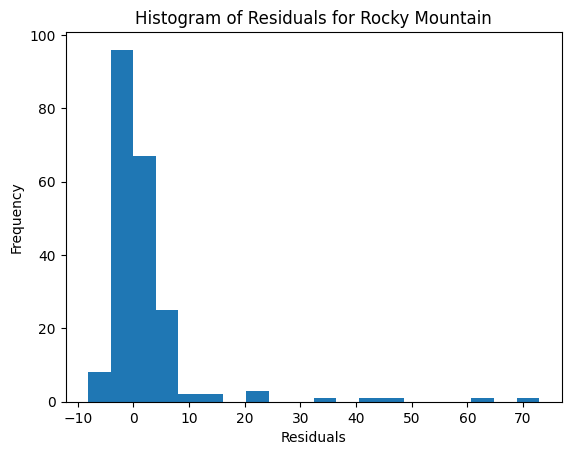

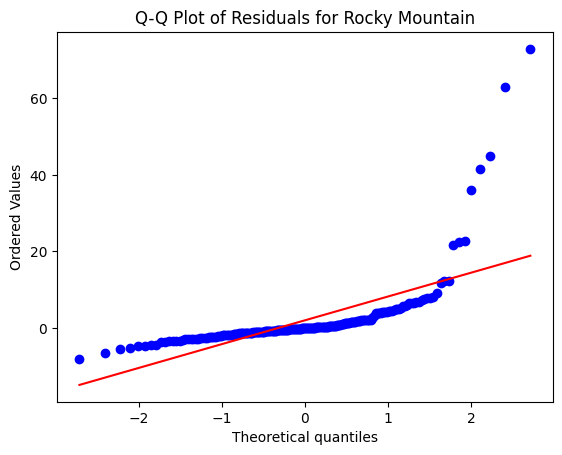

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 11
Best parameters: {'C': 1, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 893.8299805555554
MSE of the model: 363.50038062565596
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 19.065685946895695
MAE of the best SVR model: 14.151979339214577
R-squared (Coefficient of Determination): 0.5933226804501185
Percentage of predictions within 5% of the correct values: 0.0
Percentage of predictions within 15% of the correct values: 33.33333333333333
Percentage of predictions within 25% of the correct values: 33.33333333333333
Percentage of predictions within 50% of the correct values: 33.33333333333333
-------------------------------


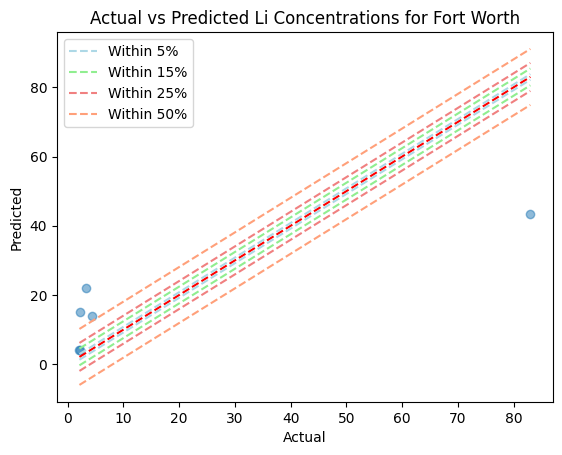

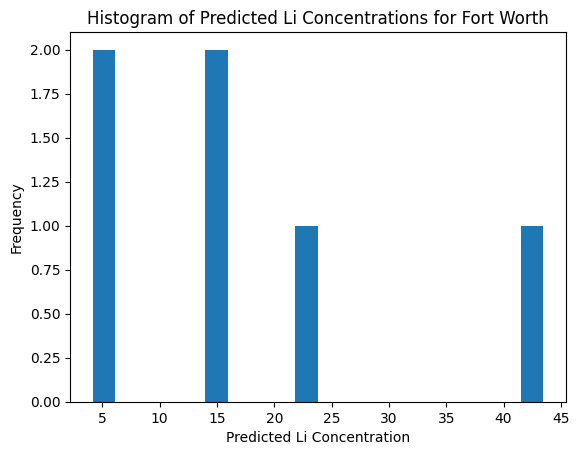

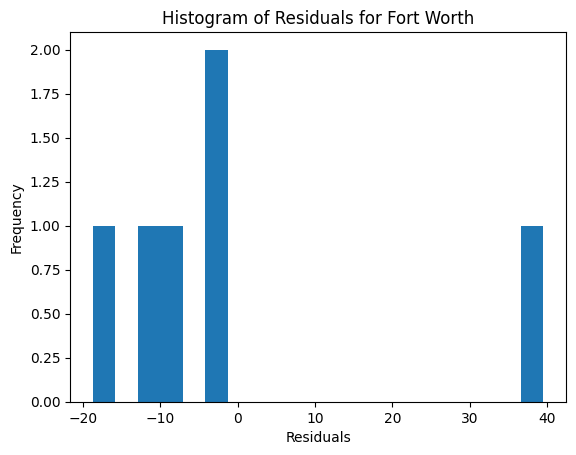

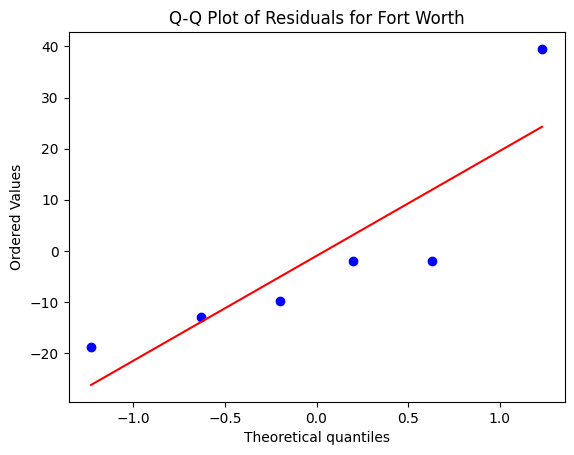

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
8,01_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",0.50,26213.60,27737.61,166.55,39.99,-0.06,68.42,89.47,94.74,94.74
3,01_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,16797.04,1341.84,36.63,17.49,0.92,31.46,62.92,69.29,81.65
7,01_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,140.91,22.03,4.69,3.24,0.84,25.00,62.50,75.00,87.50
10,01_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,188.67,85.84,9.26,3.68,0.55,20.19,44.23,60.58,80.29
1,01_PCA,Permian,481,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.01,5745.30,5883.58,76.70,16.76,-0.02,17.93,44.14,66.90,89.66
6,01_PCA,Pacific,145,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,7.59,1.41,1.19,0.76,0.81,15.91,40.91,63.64,77.27
5,01_PCA,Michigan,150,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",linear,"[0.1, 1, 10]",0.1,"[0.01, 0.1, 0.5]",0.01,309.10,111.19,10.54,7.68,0.64,8.89,40.00,55.56,77.78
4,01_PCA,Williston,502,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.01,2074.04,995.44,31.55,16.61,0.52,13.25,37.09,50.33,64.90
0,01_PCA,Appalachian,652,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,3846.88,1531.85,39.14,23.66,0.60,15.82,35.71,57.65,75.51
11,01_PCA,Fort Worth,17,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",linear,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",0.50,893.83,363.50,19.07,14.15,0.59,0.00,33.33,33.33,33.33


In [53]:
# Define all the variables...
df = df_pca_all_basins.copy()
round = '01_PCA'
basins = df_data['BASIN_CATEGORY'].unique()
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly']
c_values = [0.1, 1, 10]
epsilon_values = [0.01, 0.1, 0.5]

# Run the function...
df_round01_pca = generate_svr_models_by_basin_from_pca(df=df, round=round, basins=basins, test_size=test_size, random_state=random_state, 
                                                       kernel_values=kernel_values, c_values=c_values, epsilon_values=epsilon_values)
df_round01_pca

### ROUND 2 (PCA)

Appalachian
Number of data points:  652
Number of samples in the training dataset: 456
Best parameters: {'C': 100, 'epsilon': 0.2, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3846.8820694580386
MSE of the model: 1532.3817205498638
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 39.14564753008773
MAE of the best SVR model: 23.693177111095107
R-squared (Coefficient of Determination): 0.6016561743038432
Percentage of predictions within 5% of the correct values: 16.3265306122449
Percentage of predictions within 15% of the correct values: 35.714285714285715
Percentage of predictions within 25% of the correct values: 57.6530612244898
Percentage of predictions within 50% of the correct values: 75.51020408163265
-------------------------------


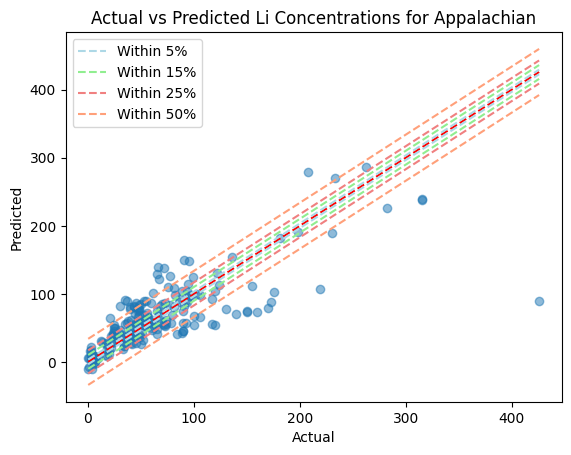

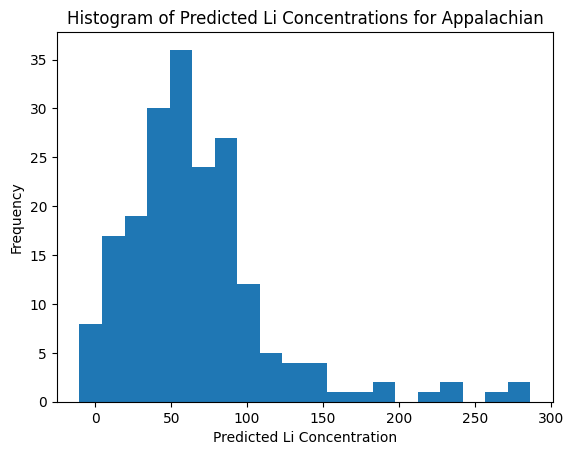

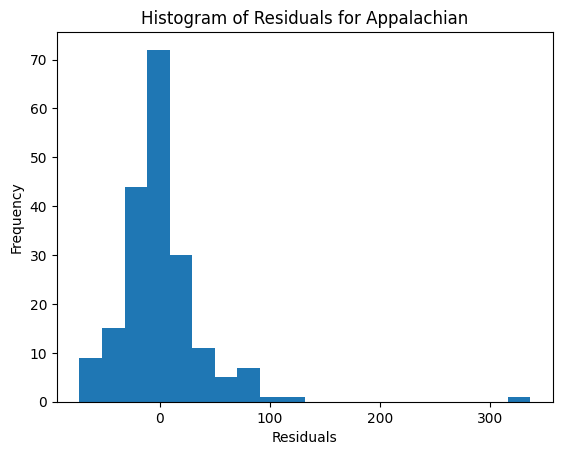

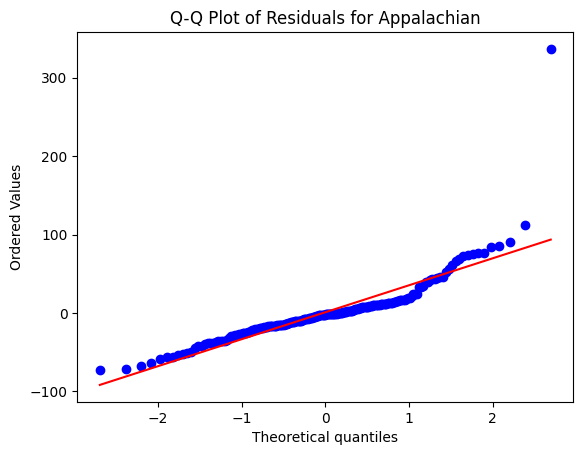

Permian
Number of data points:  481
Number of samples in the training dataset: 336
Best parameters: {'C': 100, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 5745.300019005945
MSE of the model: 5826.855562083843
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 76.33384283582114
MAE of the best SVR model: 16.555160732546682
R-squared (Coefficient of Determination): -0.014195175675440153
Percentage of predictions within 5% of the correct values: 17.24137931034483
Percentage of predictions within 15% of the correct values: 51.03448275862069
Percentage of predictions within 25% of the correct values: 68.27586206896552
Percentage of predictions within 50% of the correct values: 89.65517241379311
-------------------------------


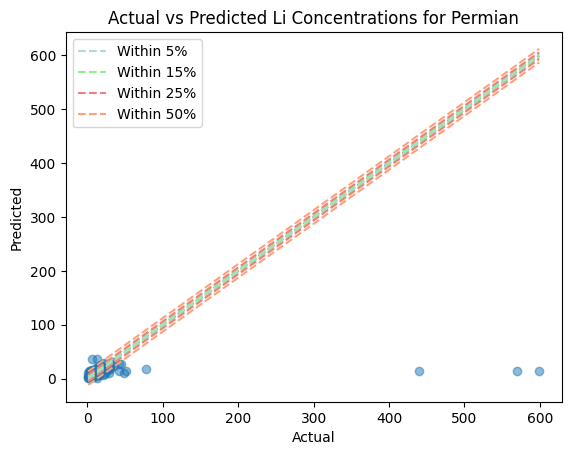

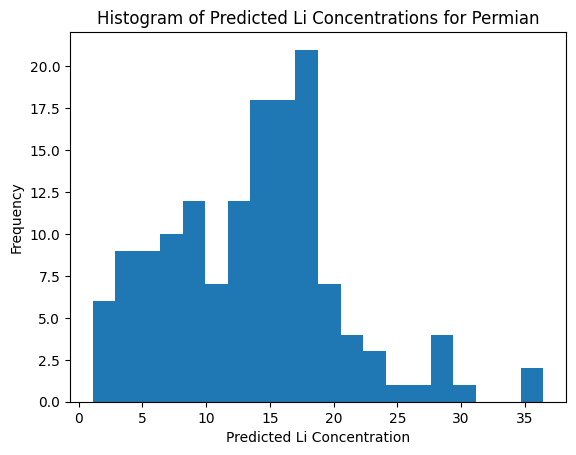

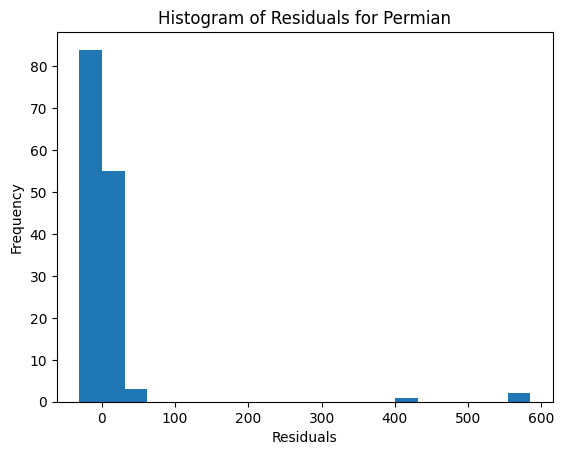

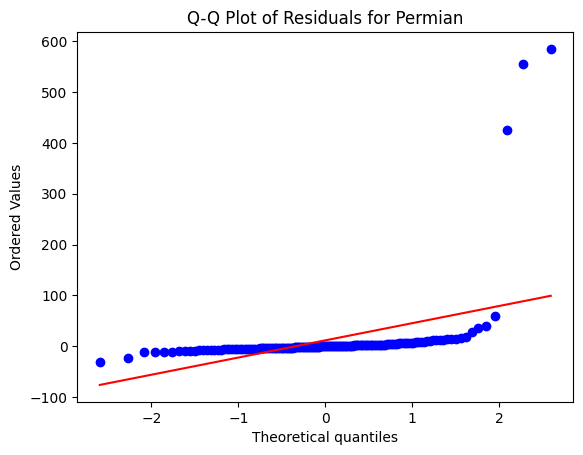

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 177
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 283.78324827120935
MSE of the model: 57.36311838670743
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.573844359815392
MAE of the best SVR model: 5.776841092182809
R-squared (Coefficient of Determination): 0.7978629156718724
Percentage of predictions within 5% of the correct values: 16.883116883116884
Percentage of predictions within 15% of the correct values: 32.467532467532465
Percentage of predictions within 25% of the correct values: 55.84415584415584
Percentage of predictions within 50% of the correct values: 83.11688311688312
-------------------------------


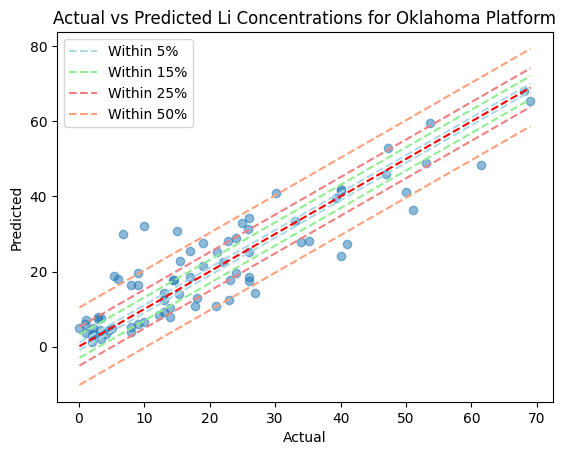

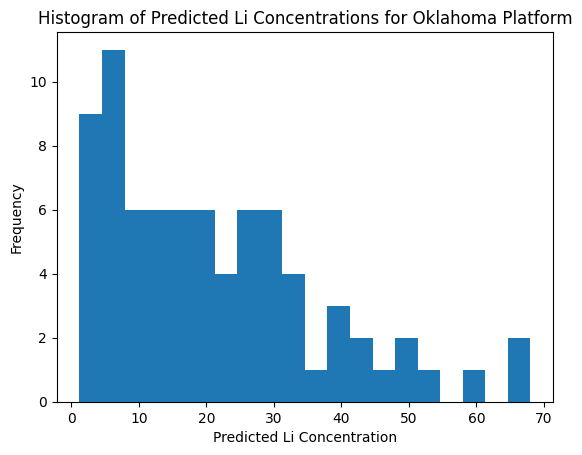

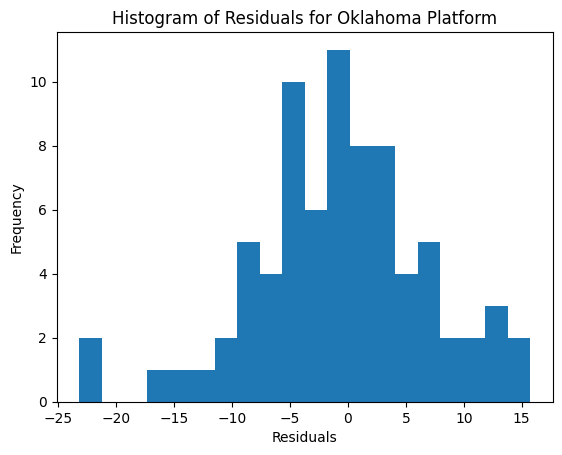

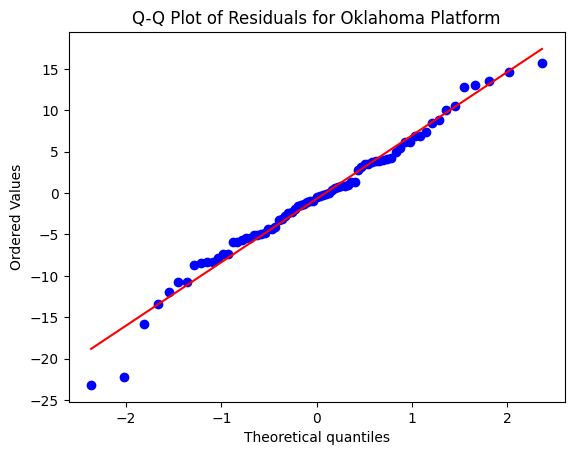

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 621
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 16797.03549157903
MSE of the model: 1341.8413140420178
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 36.63115223470343
MAE of the best SVR model: 17.493140846155043
R-squared (Coefficient of Determination): 0.920114396691325
Percentage of predictions within 5% of the correct values: 31.46067415730337
Percentage of predictions within 15% of the correct values: 62.92134831460674
Percentage of predictions within 25% of the correct values: 69.28838951310861
Percentage of predictions within 50% of the correct values: 81.64794007490637
-------------------------------


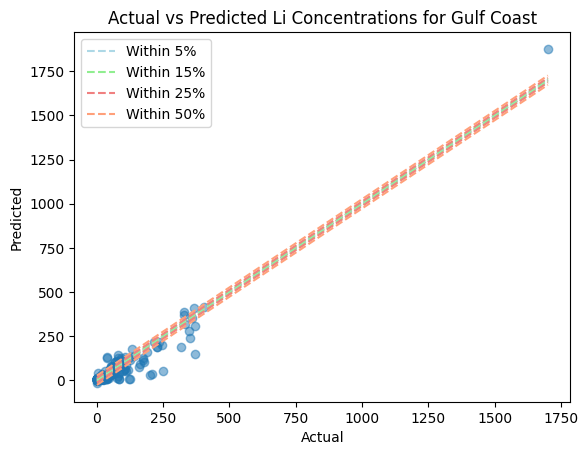

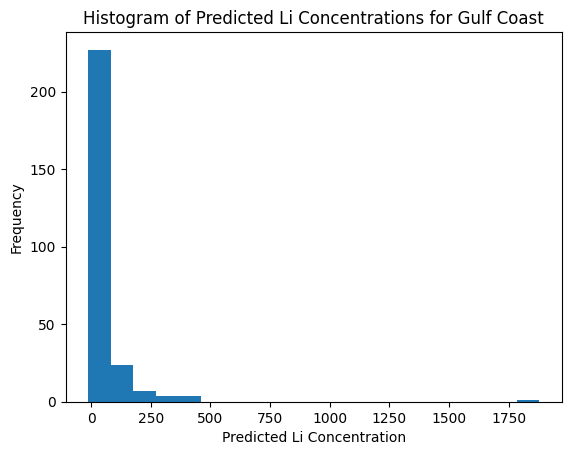

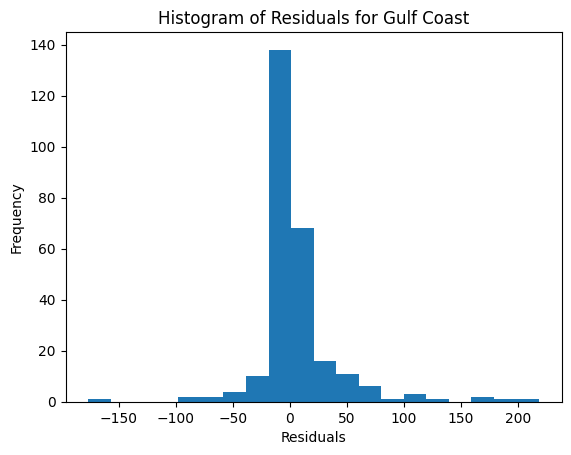

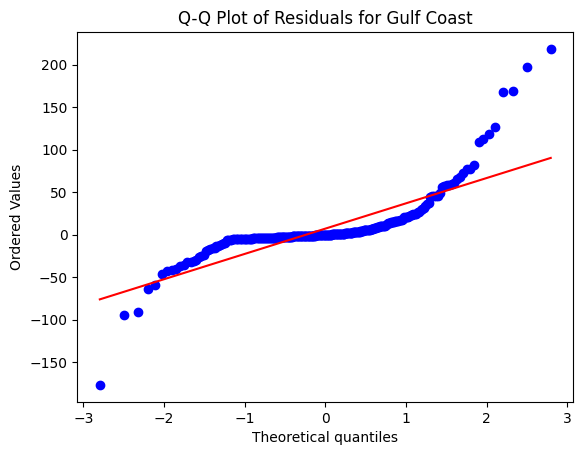

Williston
Number of data points:  502
Number of samples in the training dataset: 351
Best parameters: {'C': 100, 'epsilon': 0.05, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2074.040156853596
MSE of the model: 1015.7154978935692
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 31.870291776097208
MAE of the best SVR model: 16.921541944533175
R-squared (Coefficient of Determination): 0.5102720193062937
Percentage of predictions within 5% of the correct values: 11.258278145695364
Percentage of predictions within 15% of the correct values: 34.437086092715234
Percentage of predictions within 25% of the correct values: 49.00662251655629
Percentage of predictions within 50% of the correct values: 64.90066225165563
-------------------------------


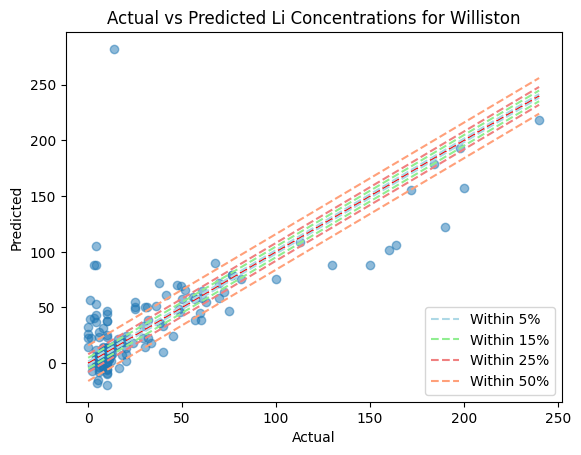

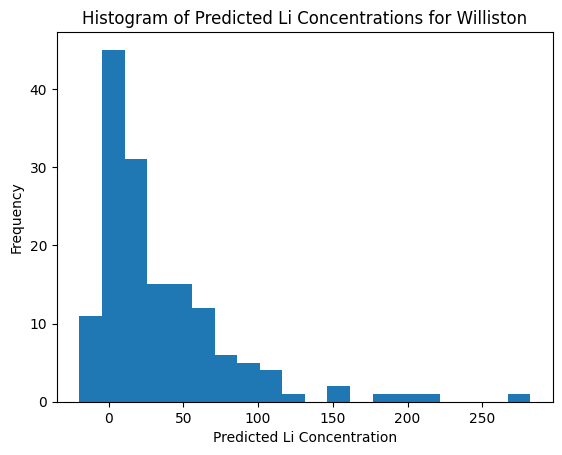

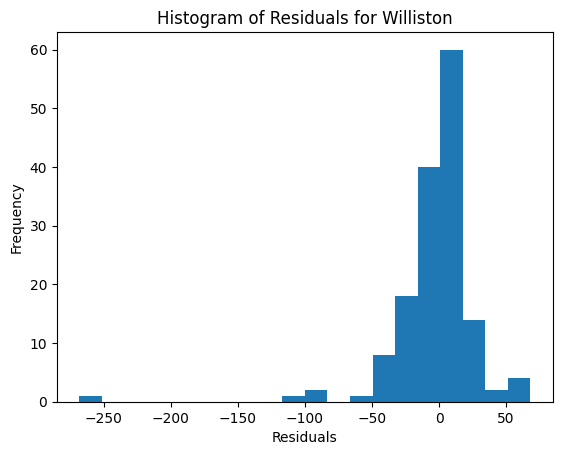

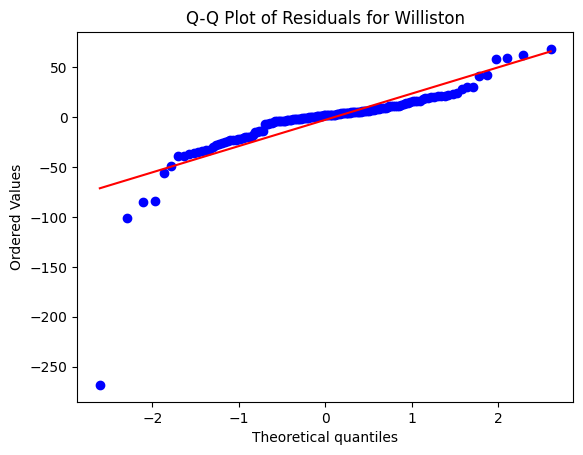

Michigan
Number of data points:  150
Number of samples in the training dataset: 105
Best parameters: {'C': 0.1, 'epsilon': 0.01, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 309.10417758024687
MSE of the model: 111.19499381652665
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 10.544903689295918
MAE of the best SVR model: 7.676316739914463
R-squared (Coefficient of Determination): 0.6402669330224138
Percentage of predictions within 5% of the correct values: 8.88888888888889
Percentage of predictions within 15% of the correct values: 40.0
Percentage of predictions within 25% of the correct values: 55.55555555555556
Percentage of predictions within 50% of the correct values: 77.77777777777779
-------------------------------


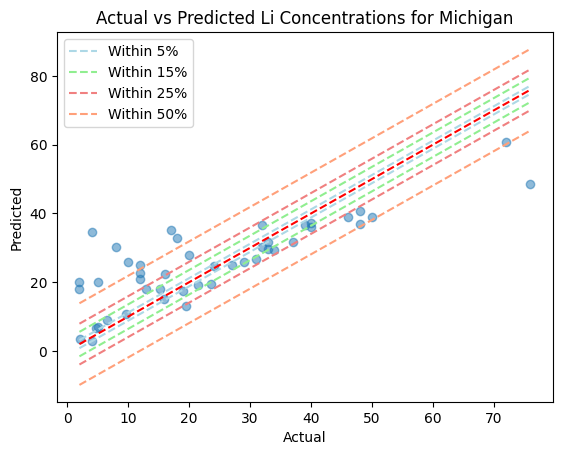

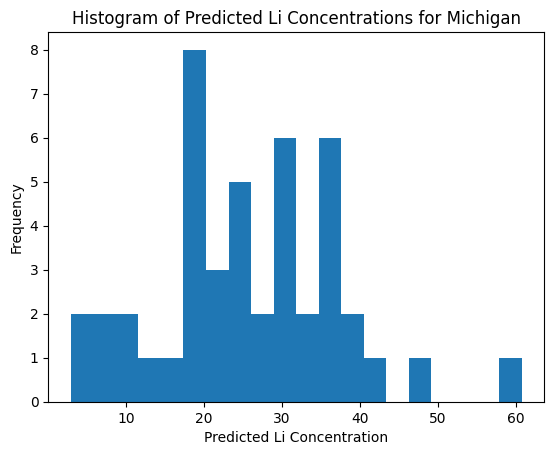

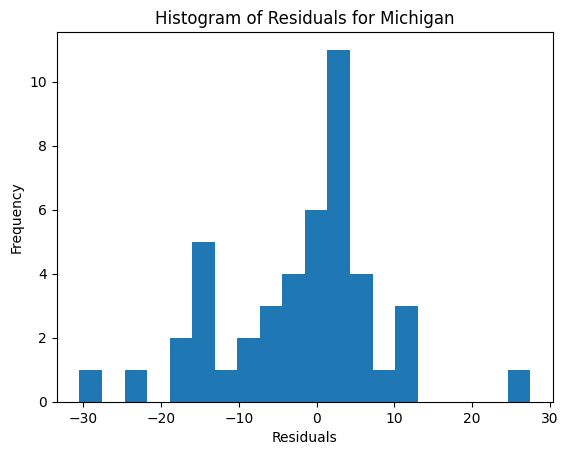

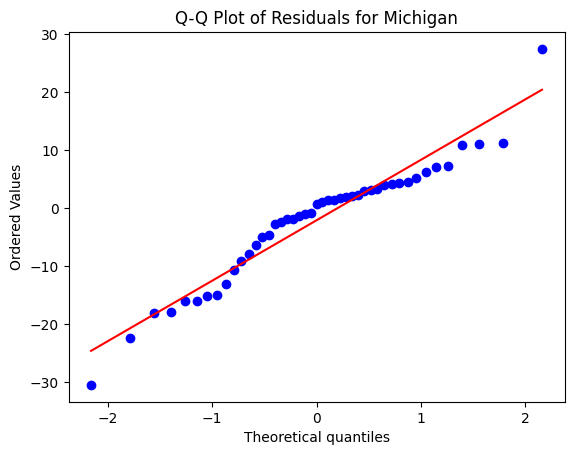

Pacific
Number of data points:  145
Number of samples in the training dataset: 101
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 7.590610782541325
MSE of the model: 1.4117241493156678
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.1881599847308728
MAE of the best SVR model: 0.7583274501390903
R-squared (Coefficient of Determination): 0.8140170547852772
Percentage of predictions within 5% of the correct values: 15.909090909090908
Percentage of predictions within 15% of the correct values: 40.909090909090914
Percentage of predictions within 25% of the correct values: 63.63636363636363
Percentage of predictions within 50% of the correct values: 77.27272727272727
-------------------------------


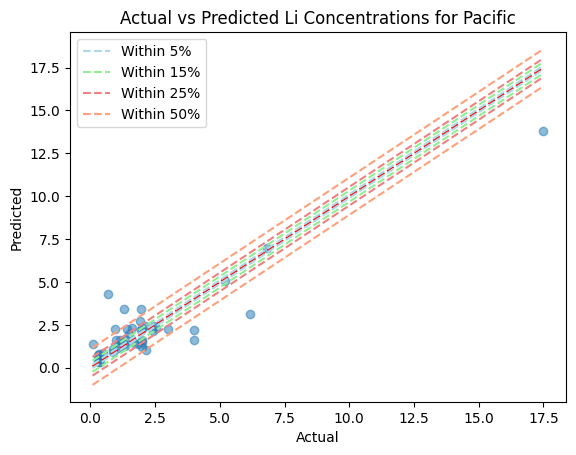

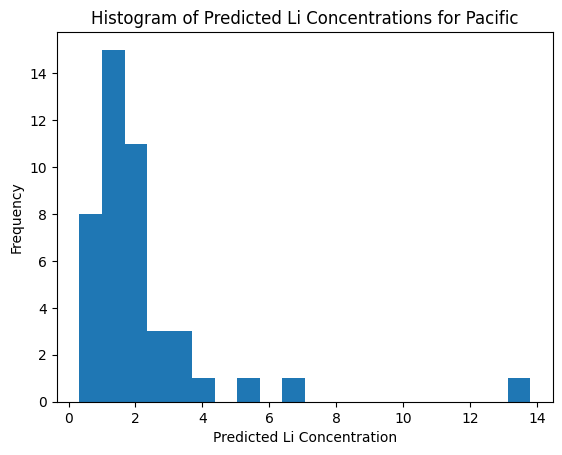

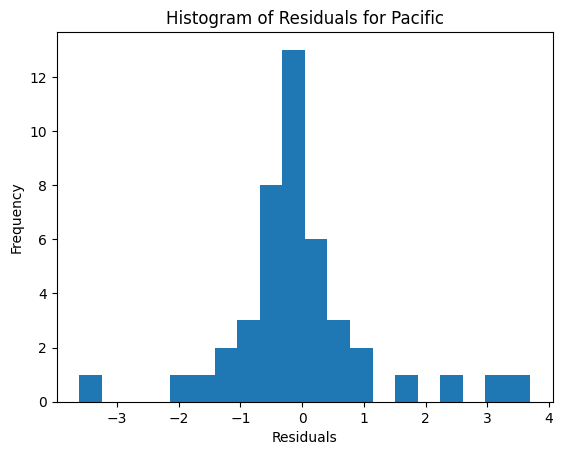

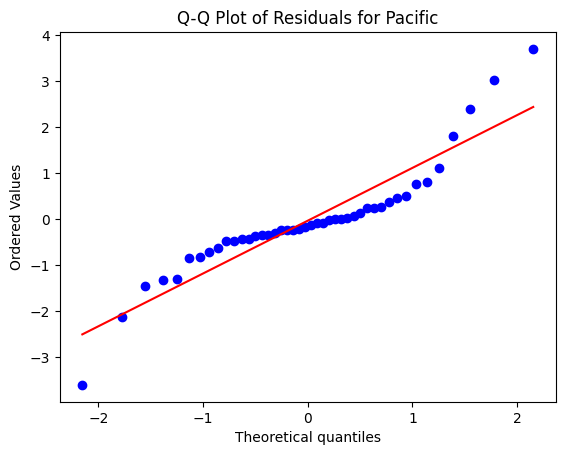

Illinois
Number of data points:  25
Number of samples in the training dataset: 17
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'linear'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 140.9118484375
MSE of the model: 21.656343955095608
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 4.653637712058773
MAE of the best SVR model: 3.223984662152975
R-squared (Coefficient of Determination): 0.8463128246827232
Percentage of predictions within 5% of the correct values: 25.0
Percentage of predictions within 15% of the correct values: 62.5
Percentage of predictions within 25% of the correct values: 75.0
Percentage of predictions within 50% of the correct values: 87.5
-------------------------------


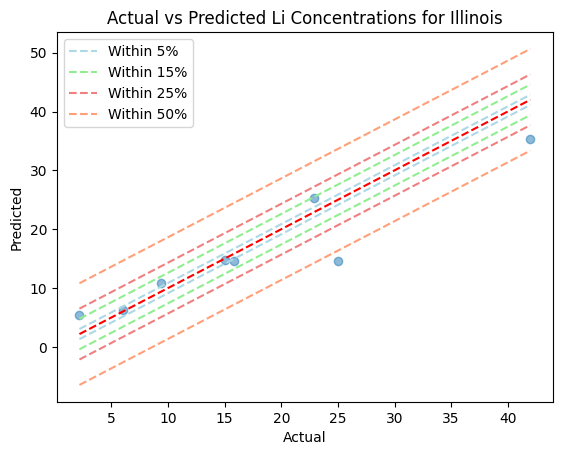

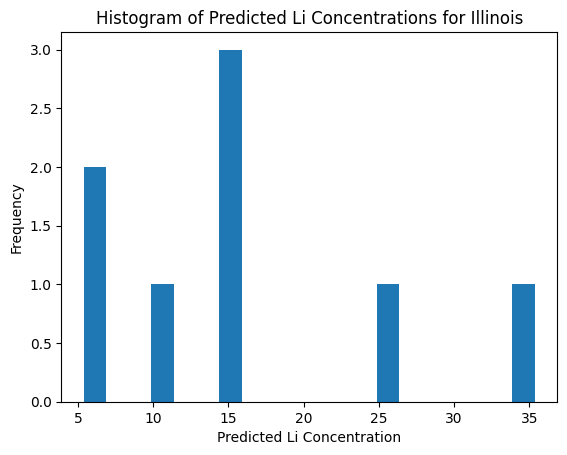

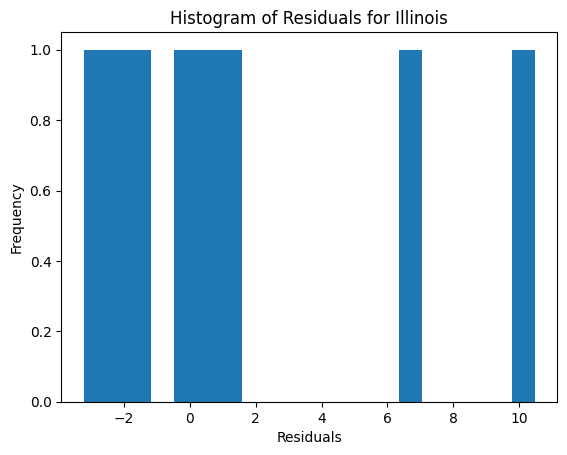

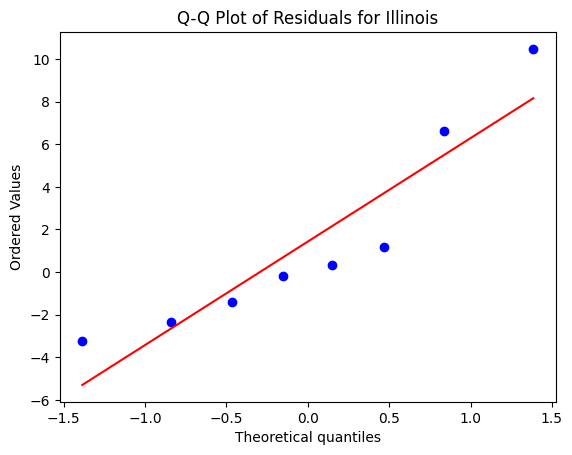

Great Plains
Number of data points:  62
Number of samples in the training dataset: 43
Best parameters: {'C': 1, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 26213.59710083102
MSE of the model: 27731.174897925524
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 166.52679933850143
MAE of the best SVR model: 39.955790268324286
R-squared (Coefficient of Determination): -0.05789277187930808
Percentage of predictions within 5% of the correct values: 68.42105263157895
Percentage of predictions within 15% of the correct values: 89.47368421052632
Percentage of predictions within 25% of the correct values: 94.73684210526315
Percentage of predictions within 50% of the correct values: 94.73684210526315
-------------------------------


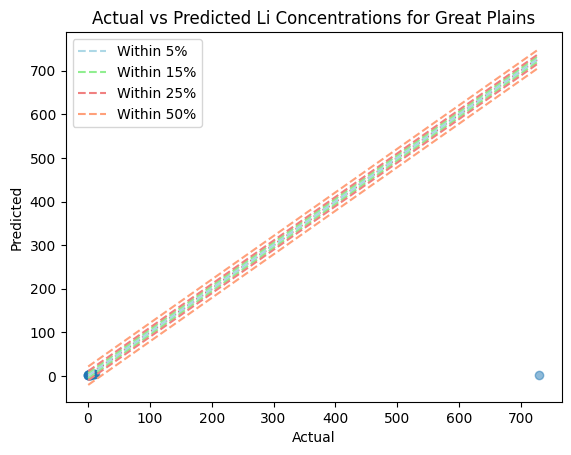

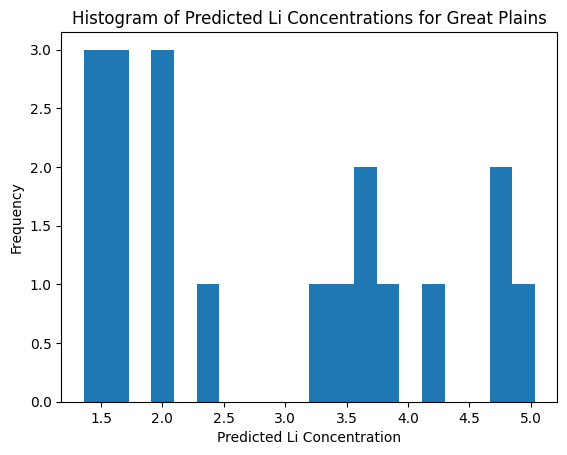

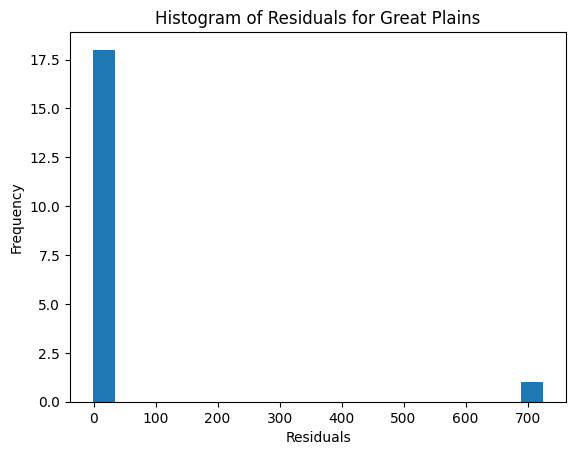

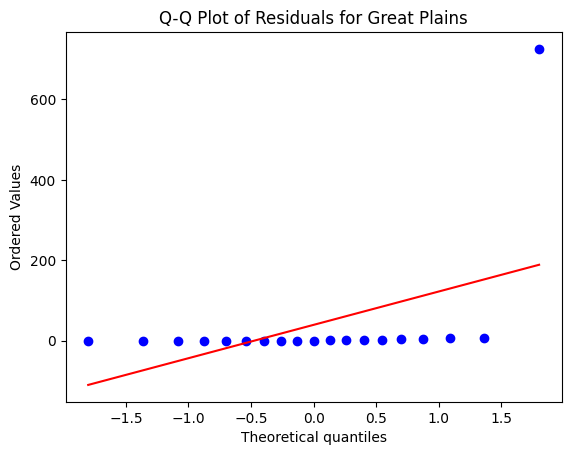

Anadarko
Number of data points:  262
Number of samples in the training dataset: 183
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 18808.841227111043
MSE of the model: 11128.33588504524
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 105.49092797508817
MAE of the best SVR model: 22.179870196101305
R-squared (Coefficient of Determination): 0.4083454822828282
Percentage of predictions within 5% of the correct values: 54.43037974683544
Percentage of predictions within 15% of the correct values: 72.15189873417721
Percentage of predictions within 25% of the correct values: 78.48101265822784
Percentage of predictions within 50% of the correct values: 89.87341772151899
-------------------------------


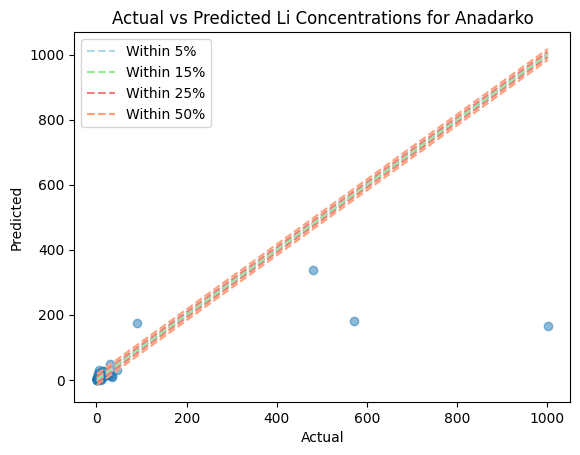

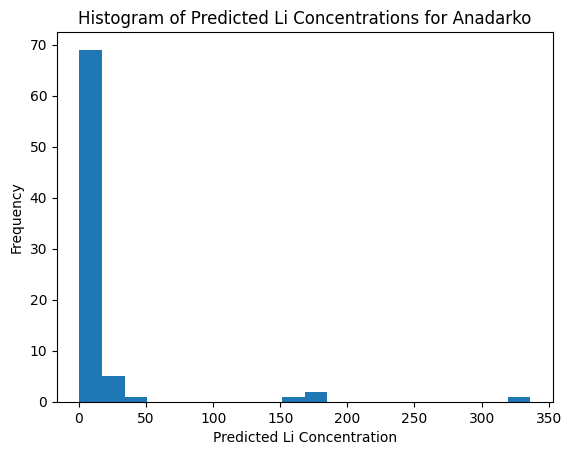

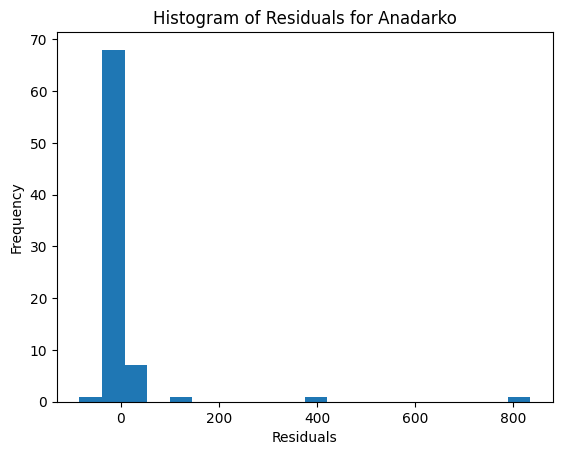

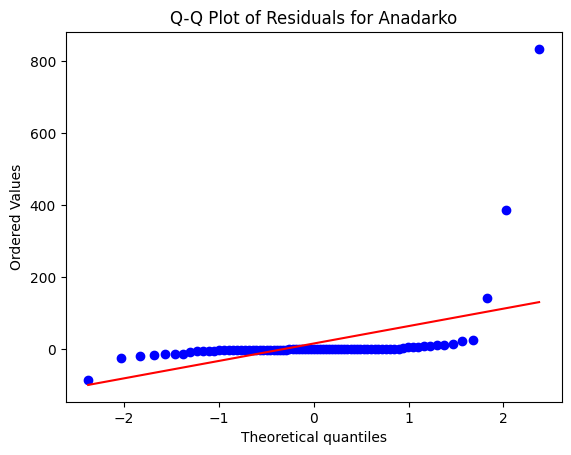

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 485
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 188.66855393629808
MSE of the model: 49.37363341108077
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.026637418501169
MAE of the best SVR model: 3.519504485047202
R-squared (Coefficient of Determination): 0.7383049141949154
Percentage of predictions within 5% of the correct values: 12.5
Percentage of predictions within 15% of the correct values: 37.019230769230774
Percentage of predictions within 25% of the correct values: 55.769230769230774
Percentage of predictions within 50% of the correct values: 78.36538461538461
-------------------------------


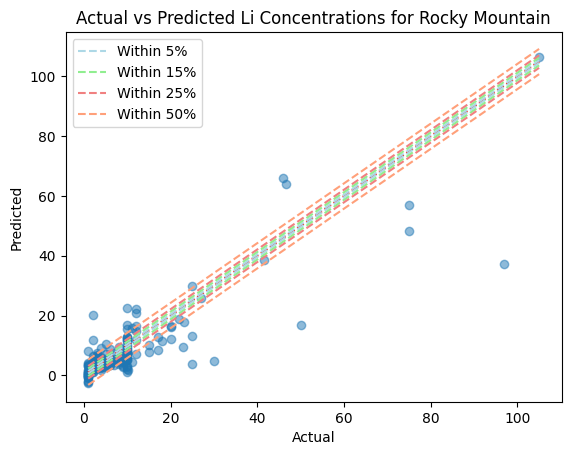

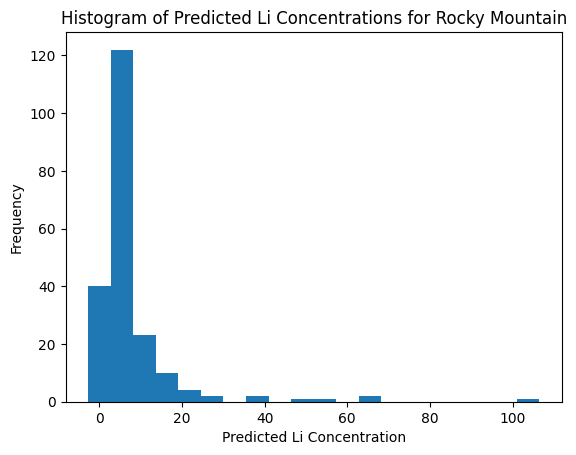

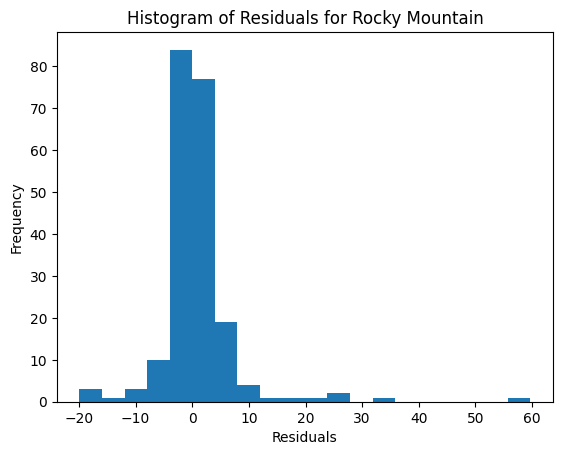

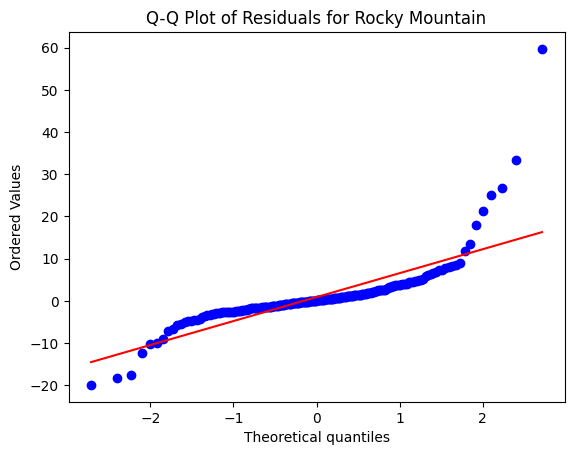

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 11
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 893.8299805555554
MSE of the model: 493.9725413418866
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 22.2254930505914
MAE of the best SVR model: 14.956223949734136
R-squared (Coefficient of Determination): 0.44735290593535415
Percentage of predictions within 5% of the correct values: 0.0
Percentage of predictions within 15% of the correct values: 33.33333333333333
Percentage of predictions within 25% of the correct values: 33.33333333333333
Percentage of predictions within 50% of the correct values: 50.0
-------------------------------


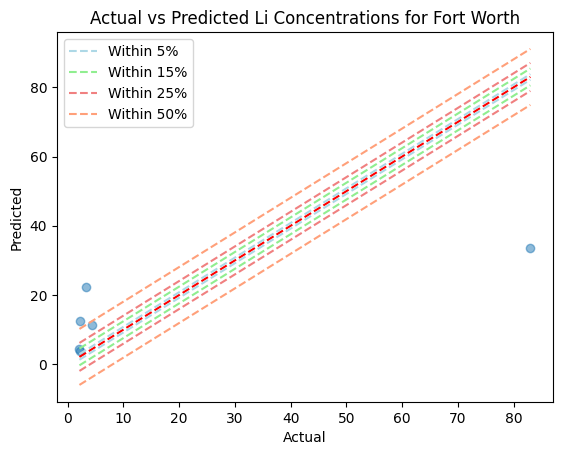

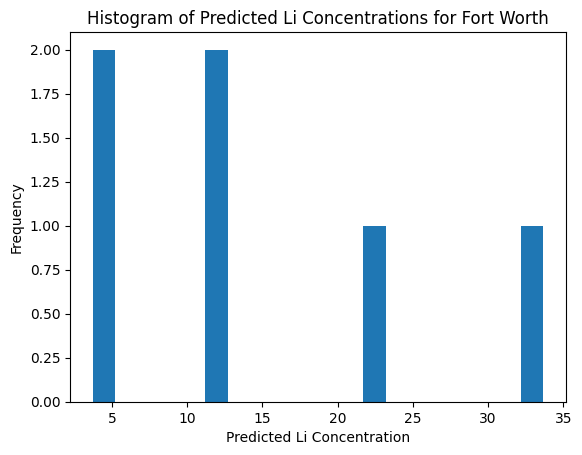

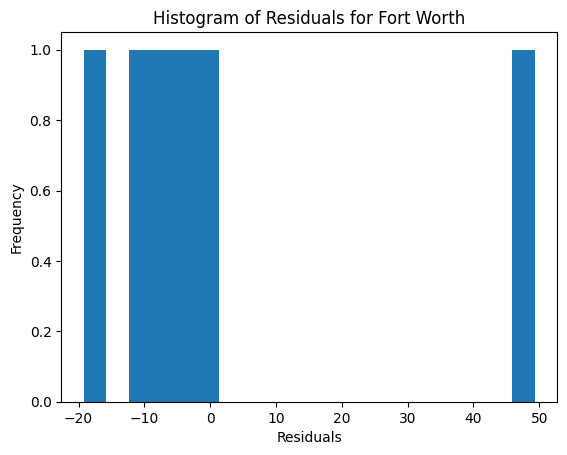

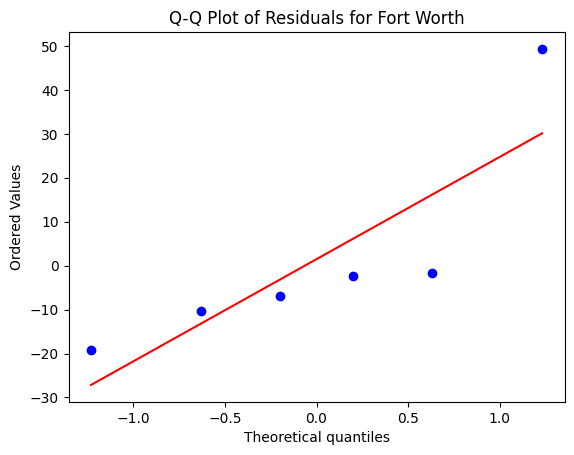

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
8,02_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",1.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.20,26213.60,27731.17,166.53,39.96,-0.06,68.42,89.47,94.74,94.74
9,02_PCA,Anadarko,262,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,18808.84,11128.34,105.49,22.18,0.41,54.43,72.15,78.48,89.87
3,02_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",10.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,16797.04,1341.84,36.63,17.49,0.92,31.46,62.92,69.29,81.65
7,02_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,140.91,21.66,4.65,3.22,0.85,25.00,62.50,75.00,87.50
1,02_PCA,Permian,481,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.01,5745.30,5826.86,76.33,16.56,-0.01,17.24,51.03,68.28,89.66
6,02_PCA,Pacific,145,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",10.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,7.59,1.41,1.19,0.76,0.81,15.91,40.91,63.64,77.27
5,02_PCA,Michigan,150,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",0.1,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.01,309.10,111.19,10.54,7.68,0.64,8.89,40.00,55.56,77.78
10,02_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,188.67,49.37,7.03,3.52,0.74,12.50,37.02,55.77,78.37
0,02_PCA,Appalachian,652,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.20,3846.88,1532.38,39.15,23.69,0.60,16.33,35.71,57.65,75.51
4,02_PCA,Williston,502,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.05,2074.04,1015.72,31.87,16.92,0.51,11.26,34.44,49.01,64.90


In [54]:
# Define all the variables...
df = df_pca_all_basins.copy()
round = '02_PCA'
basins = df_data['BASIN_CATEGORY'].unique()
test_size = 0.3
random_state = 42
kernel_values = ['linear', 'rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10, 50, 100]
epsilon_values = [0.01, 0.05, 0.1, 0.2, 0.5]

# Run the function...
df_round02_pca = generate_svr_models_by_basin_from_pca(df=df, round=round, basins=basins, test_size=test_size, random_state=random_state, 
                                                       kernel_values=kernel_values, c_values=c_values, epsilon_values=epsilon_values)
df_round02_pca

### ROUND 3 (PCA)

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 10, 'epsilon': 0.05, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 1805.5713604143243
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 42.492015254801984
MAE of the best SVR model: 25.265024059691633
R-squared (Coefficient of Determination): 0.5419678668051269
Percentage of predictions within 5% of the correct values: 12.883435582822086
Percentage of predictions within 15% of the correct values: 33.74233128834356
Percentage of predictions within 25% of the correct values: 49.079754601226995
Percentage of predictions within 50% of the correct values: 78.52760736196319
-------------------------------


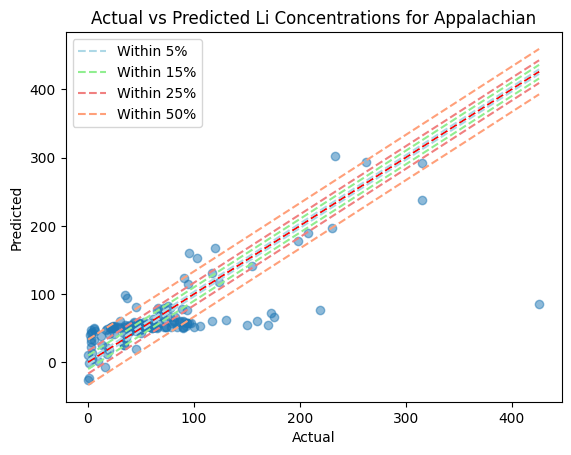

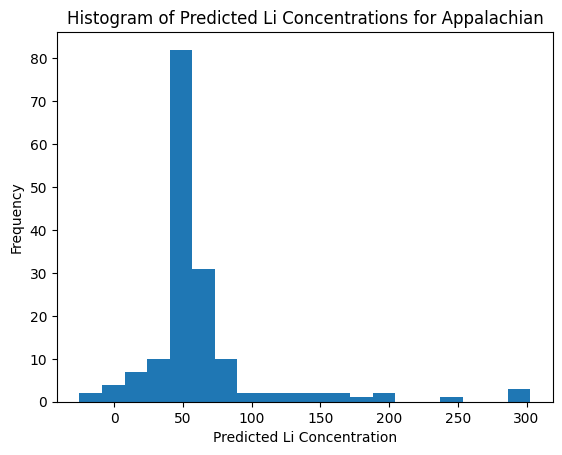

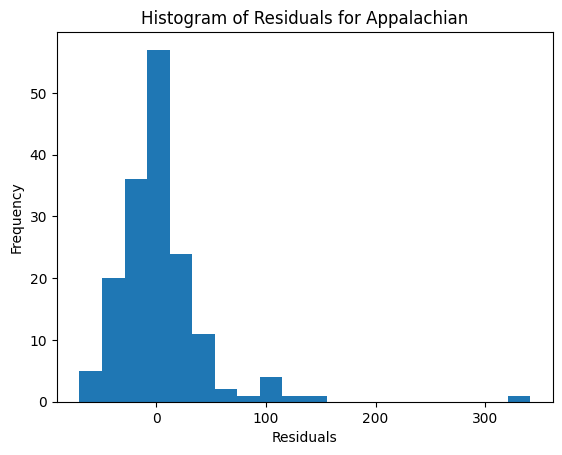

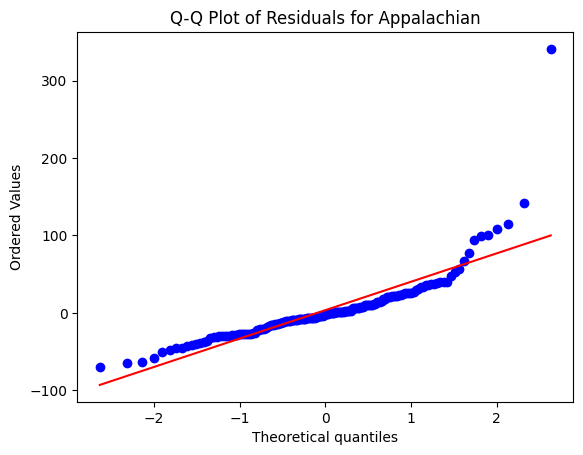

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 1, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531727
MSE of the model: 3327.8051208104575
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 57.6871313276233
MAE of the best SVR model: 13.856571043815228
R-squared (Coefficient of Determination): 0.18953630378305186
Percentage of predictions within 5% of the correct values: 14.049586776859504
Percentage of predictions within 15% of the correct values: 34.710743801652896
Percentage of predictions within 25% of the correct values: 51.2396694214876
Percentage of predictions within 50% of the correct values: 83.47107438016529
-------------------------------


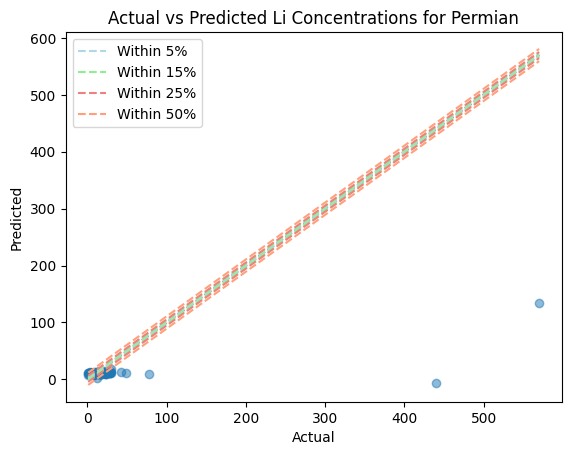

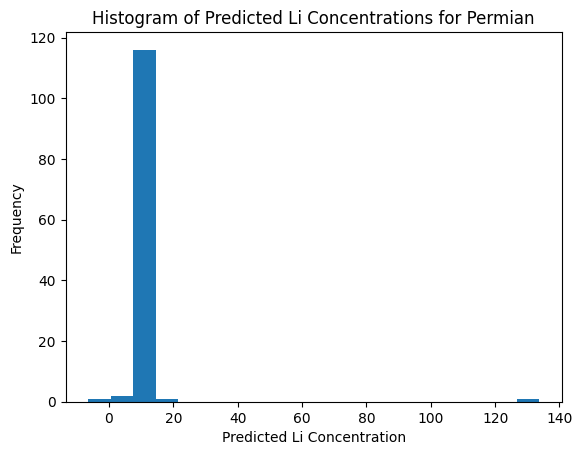

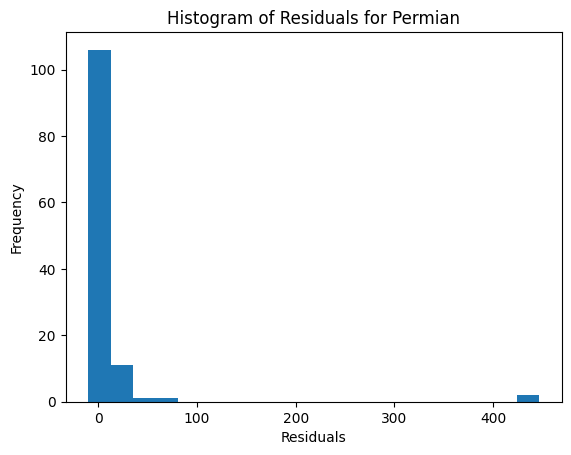

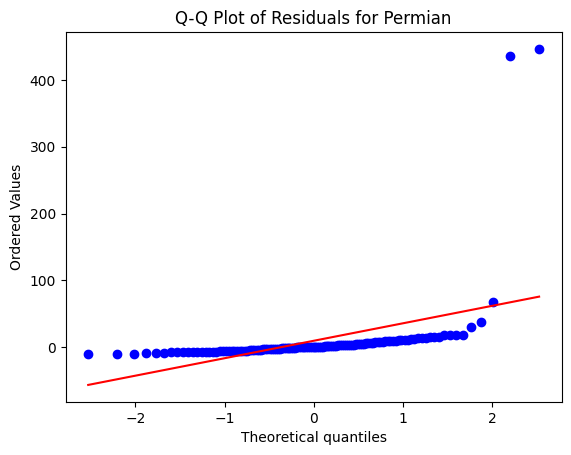

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.398918359375
MSE of the model: 63.25604393628035
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.9533668302348755
MAE of the best SVR model: 6.157715266729355
R-squared (Coefficient of Determination): 0.7948888917224782
Percentage of predictions within 5% of the correct values: 12.5
Percentage of predictions within 15% of the correct values: 31.25
Percentage of predictions within 25% of the correct values: 54.6875
Percentage of predictions within 50% of the correct values: 84.375
-------------------------------


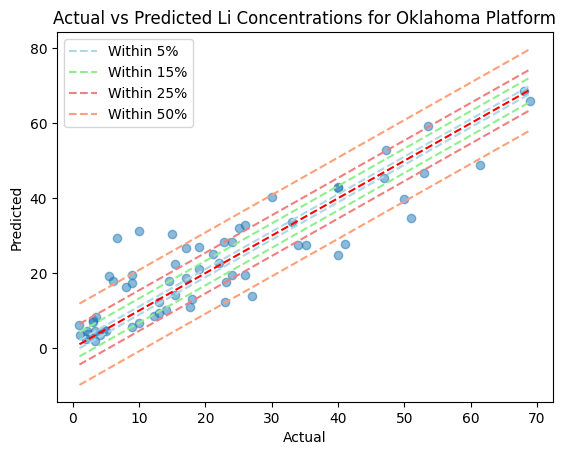

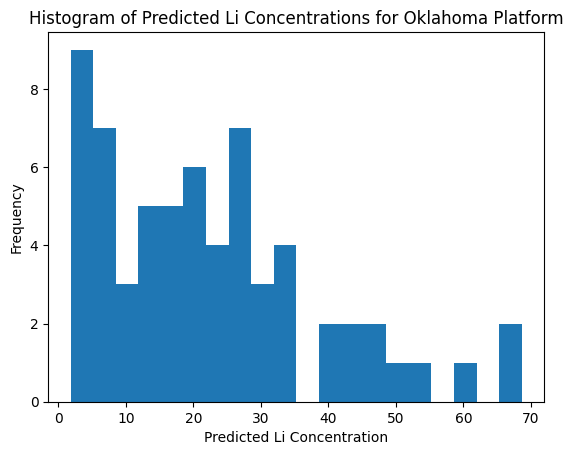

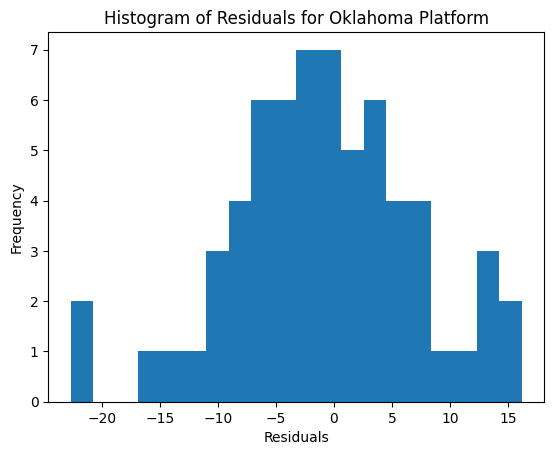

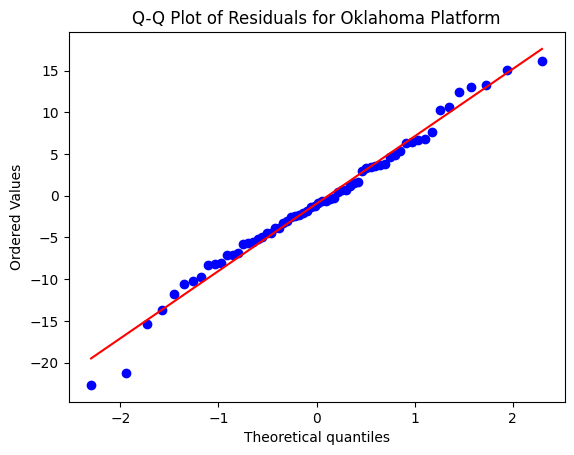

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 50, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.615187723528
MSE of the model: 1476.7219165857564
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 38.42813964513188
MAE of the best SVR model: 17.566521756336773
R-squared (Coefficient of Determination): 0.9235398498814237
Percentage of predictions within 5% of the correct values: 35.585585585585584
Percentage of predictions within 15% of the correct values: 65.31531531531532
Percentage of predictions within 25% of the correct values: 70.72072072072072
Percentage of predictions within 50% of the correct values: 82.43243243243244
-------------------------------


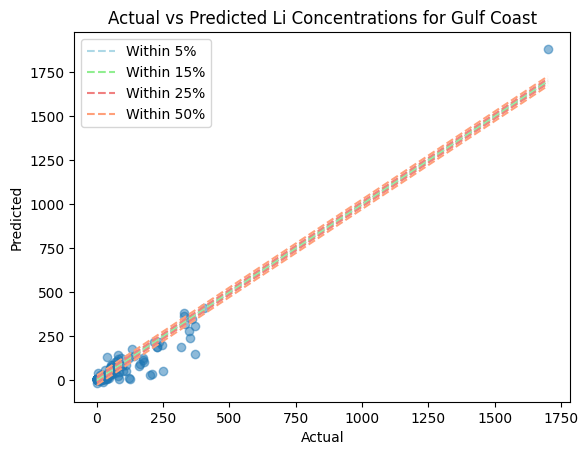

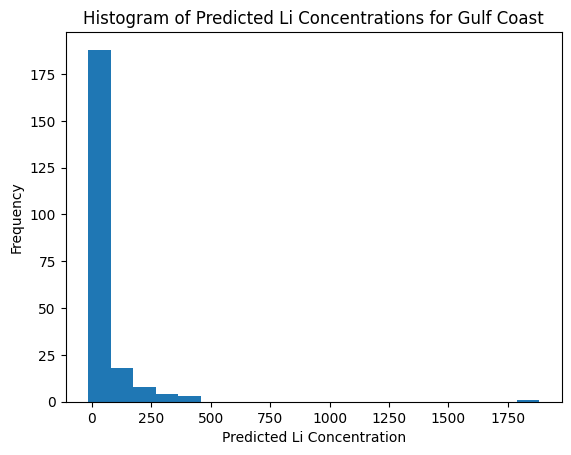

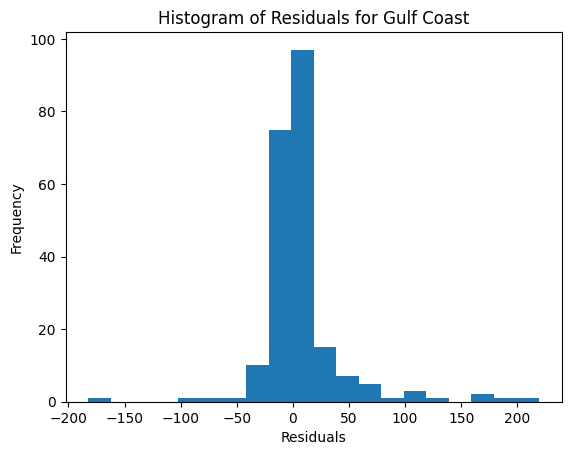

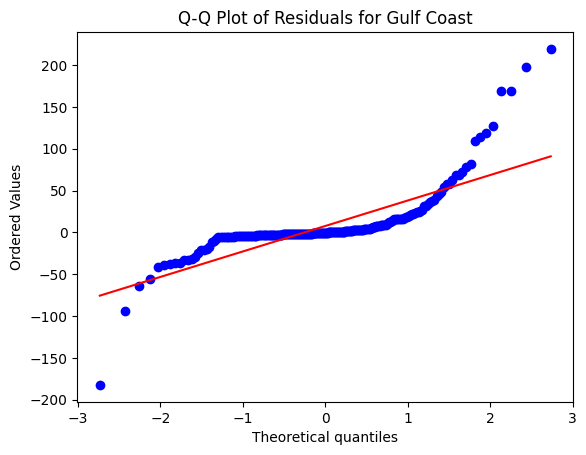

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 50, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274207
MSE of the model: 223.95702853395423
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 14.965193902317278
MAE of the best SVR model: 9.343299057026927
R-squared (Coefficient of Determination): 0.8887693166864516
Percentage of predictions within 5% of the correct values: 16.666666666666664
Percentage of predictions within 15% of the correct values: 42.857142857142854
Percentage of predictions within 25% of the correct values: 61.904761904761905
Percentage of predictions within 50% of the correct values: 84.12698412698413
-------------------------------


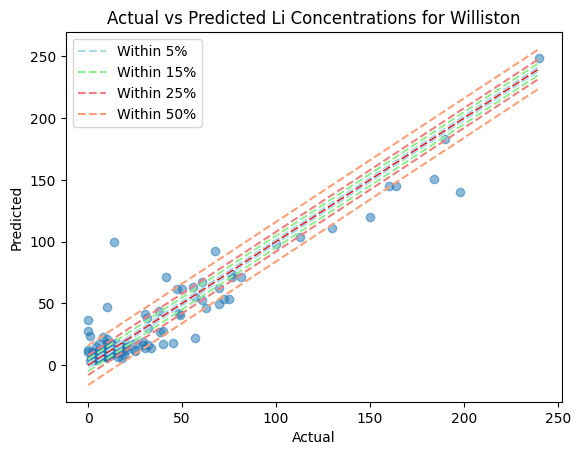

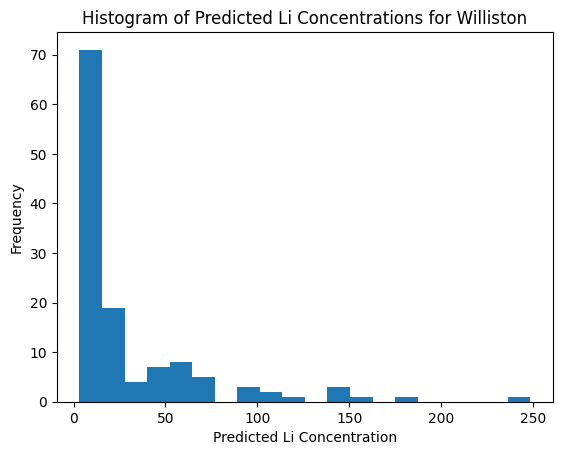

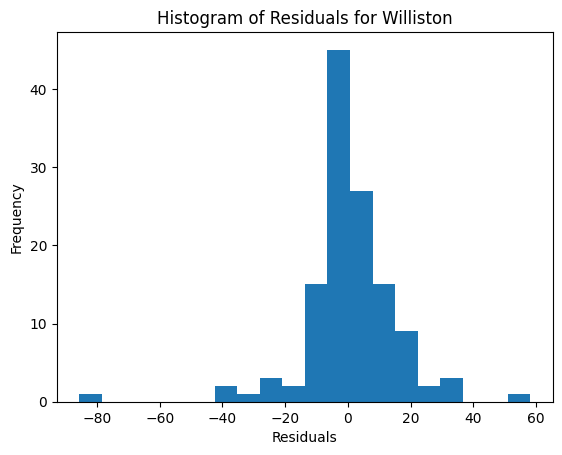

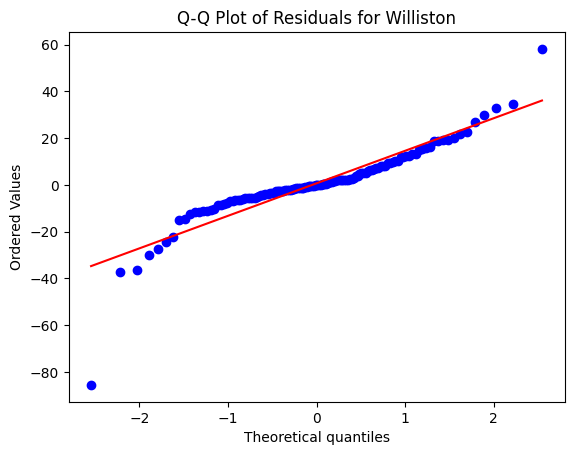

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 1, 'epsilon': 0.05, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 144.04337912916202
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 12.001807327613705
MAE of the best SVR model: 8.97258034249763
R-squared (Coefficient of Determination): 0.5740567468578572
Percentage of predictions within 5% of the correct values: 5.263157894736842
Percentage of predictions within 15% of the correct values: 21.052631578947366
Percentage of predictions within 25% of the correct values: 52.63157894736842
Percentage of predictions within 50% of the correct values: 78.94736842105263
-------------------------------


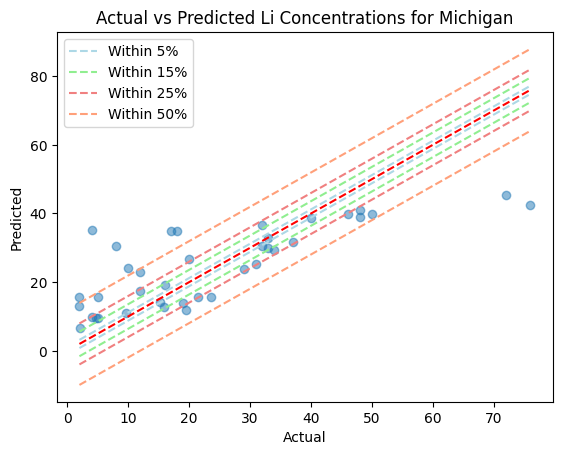

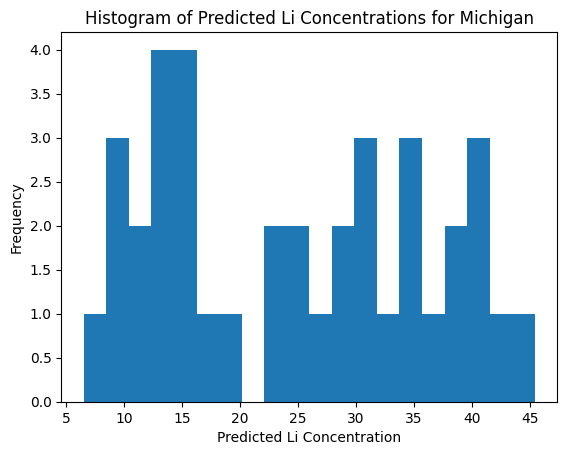

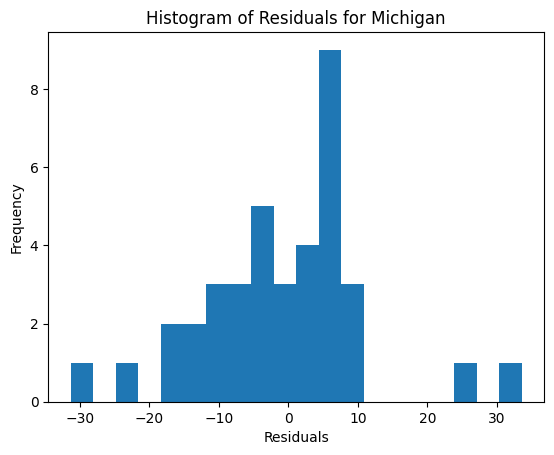

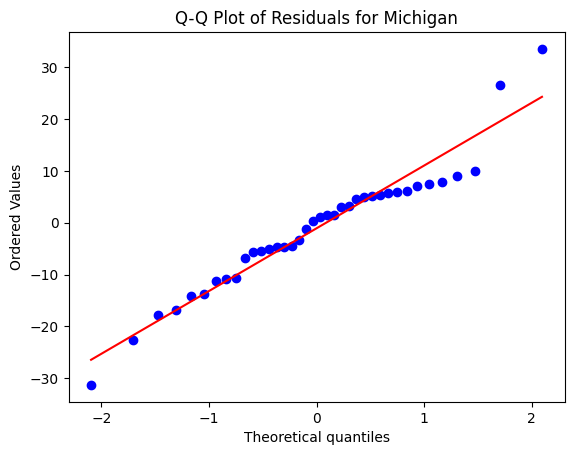

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 50, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 0.7913285575452711
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 0.8895664997881109
MAE of the best SVR model: 0.6440694523539225
R-squared (Coefficient of Determination): 0.9056086337130148
Percentage of predictions within 5% of the correct values: 13.513513513513514
Percentage of predictions within 15% of the correct values: 40.54054054054054
Percentage of predictions within 25% of the correct values: 56.75675675675676
Percentage of predictions within 50% of the correct values: 83.78378378378379
-------------------------------


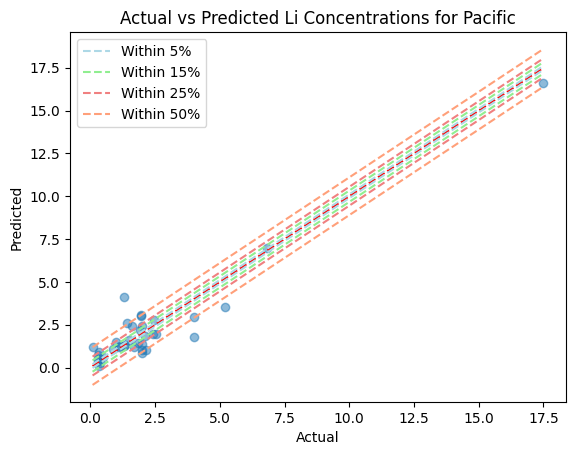

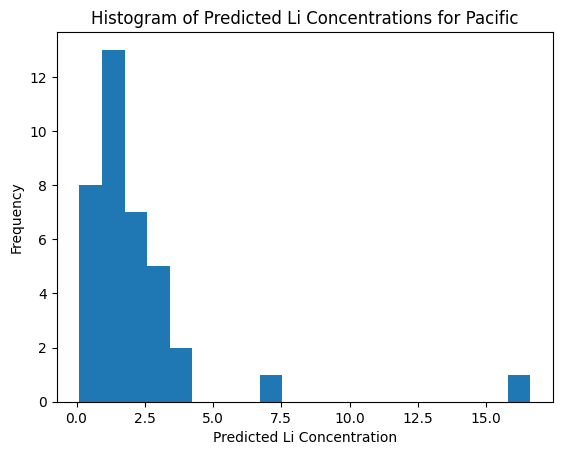

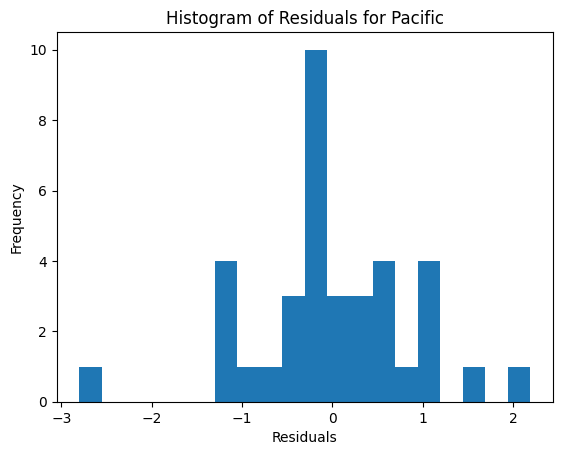

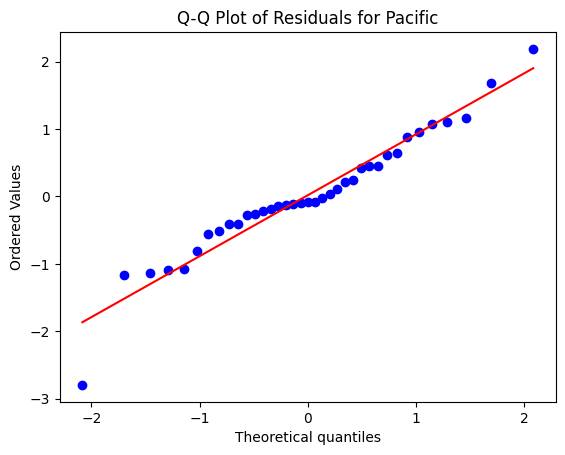

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 67.013445625701
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.1861740529811
MAE of the best SVR model: 5.231397083760982
R-squared (Coefficient of Determination): 0.5701300068124784
Percentage of predictions within 5% of the correct values: 28.57142857142857
Percentage of predictions within 15% of the correct values: 57.14285714285714
Percentage of predictions within 25% of the correct values: 71.42857142857143
Percentage of predictions within 50% of the correct values: 71.42857142857143
-------------------------------


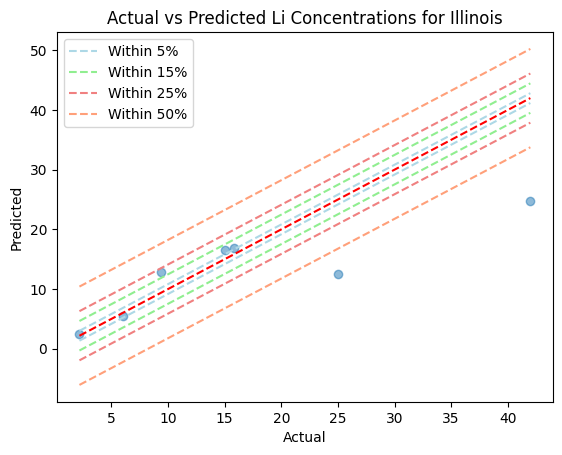

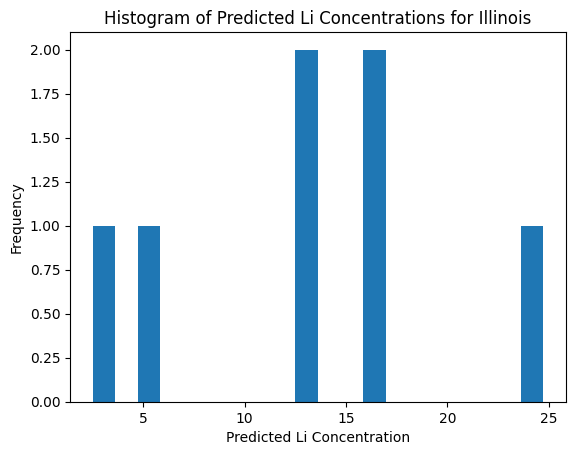

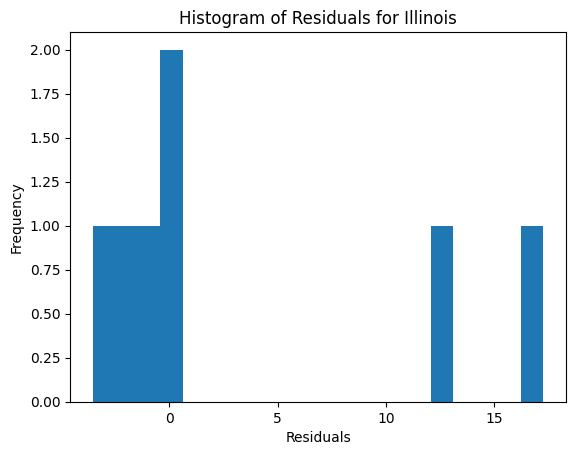

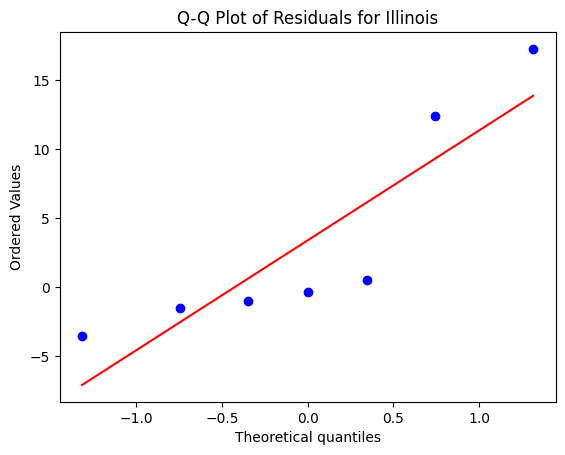

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 1, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32941.86996798012
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 181.49895307681564
MAE of the best SVR model: 47.330396959606034
R-squared (Coefficient of Determination): -0.07075753511992011
Percentage of predictions within 5% of the correct values: 62.5
Percentage of predictions within 15% of the correct values: 87.5
Percentage of predictions within 25% of the correct values: 93.75
Percentage of predictions within 50% of the correct values: 93.75
-------------------------------


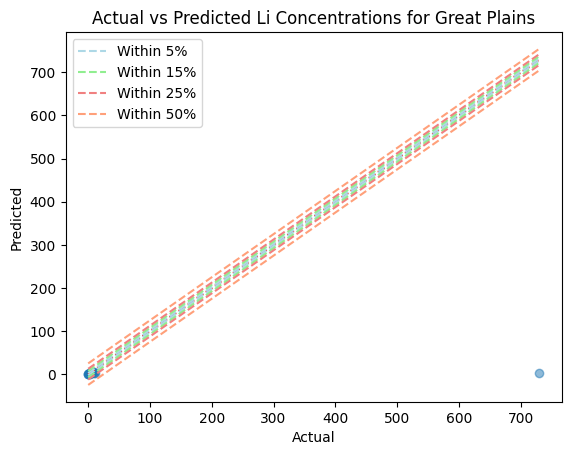

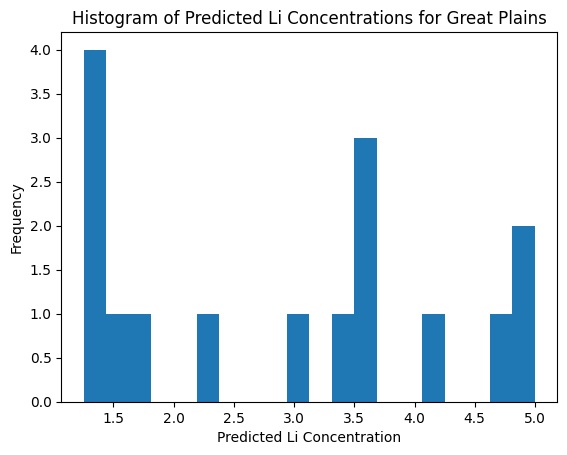

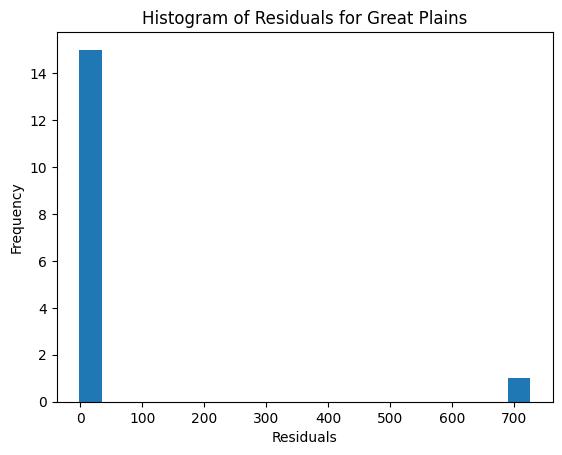

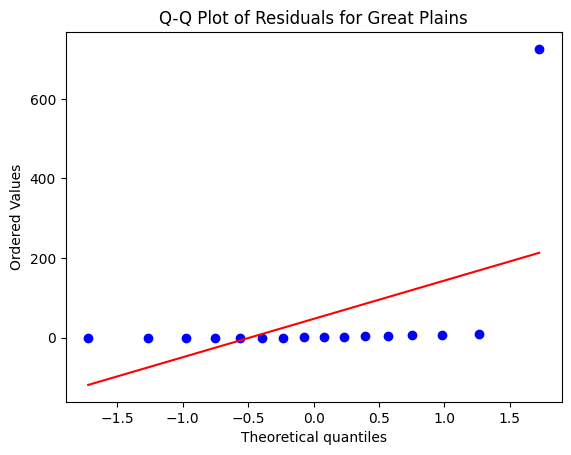

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 10, 'epsilon': 0.05, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310375
MSE of the model: 3579.7357240267957
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 59.83089272296374
MAE of the best SVR model: 17.535826952548025
R-squared (Coefficient of Determination): 0.5575521563810301
Percentage of predictions within 5% of the correct values: 24.242424242424242
Percentage of predictions within 15% of the correct values: 60.60606060606061
Percentage of predictions within 25% of the correct values: 68.18181818181817
Percentage of predictions within 50% of the correct values: 78.78787878787878
-------------------------------


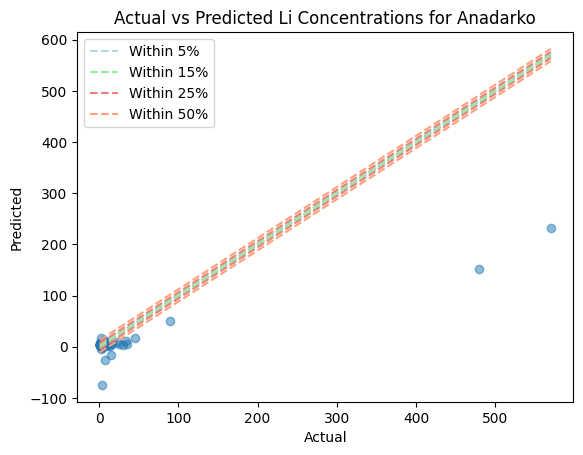

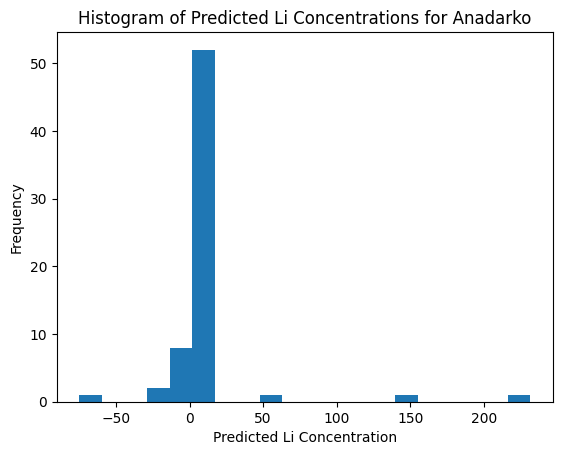

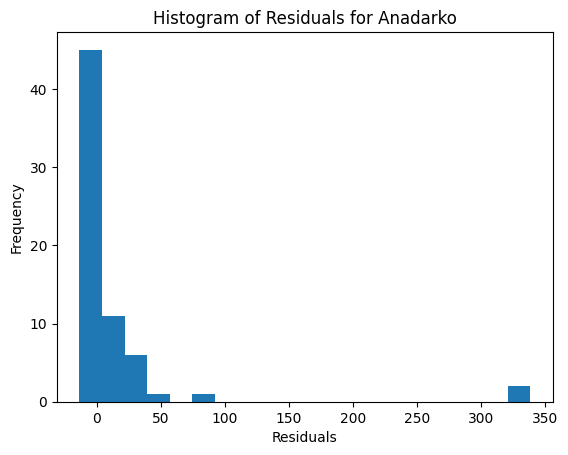

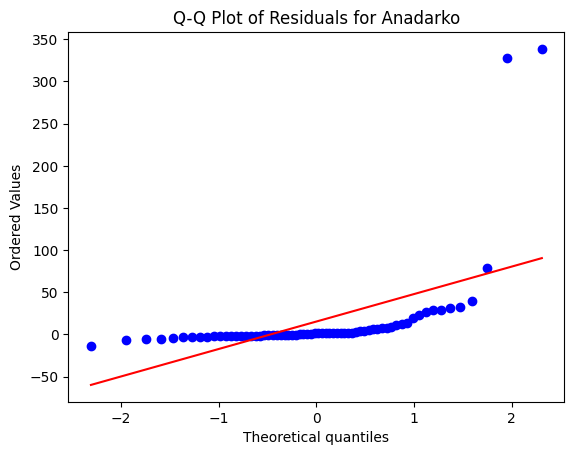

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 50, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134763
MSE of the model: 52.73508543489875
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.26189268957472
MAE of the best SVR model: 3.282018943840784
R-squared (Coefficient of Determination): 0.6996393133095336
Percentage of predictions within 5% of the correct values: 23.563218390804597
Percentage of predictions within 15% of the correct values: 40.804597701149426
Percentage of predictions within 25% of the correct values: 59.195402298850574
Percentage of predictions within 50% of the correct values: 78.73563218390804
-------------------------------


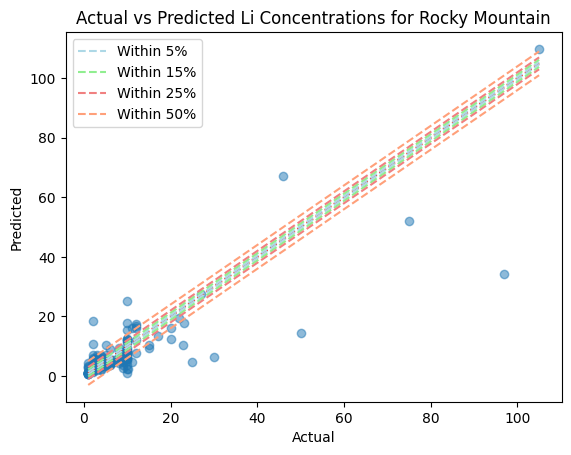

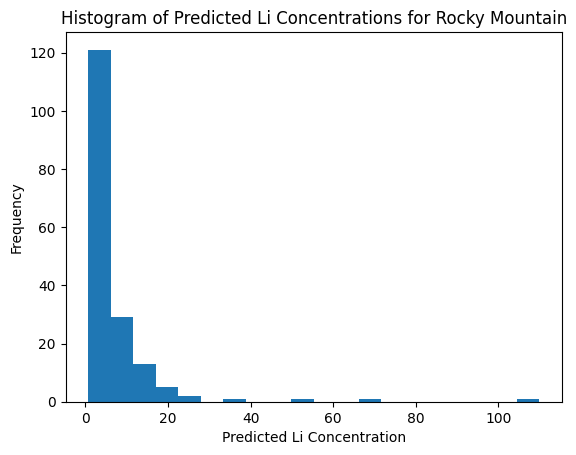

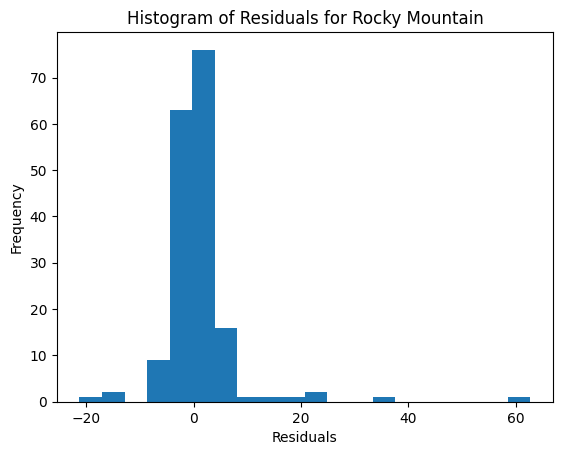

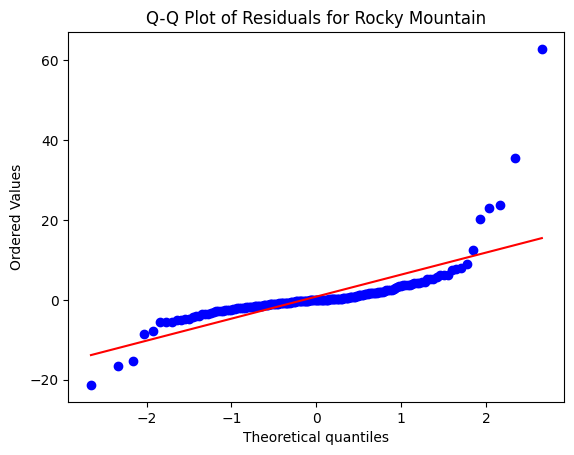

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 453.78131498076607
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 21.30214343630157
MAE of the best SVR model: 15.174141263458775
R-squared (Coefficient of Determination): 0.563179626843118
Percentage of predictions within 5% of the correct values: 0.0
Percentage of predictions within 15% of the correct values: 40.0
Percentage of predictions within 25% of the correct values: 40.0
Percentage of predictions within 50% of the correct values: 40.0
-------------------------------


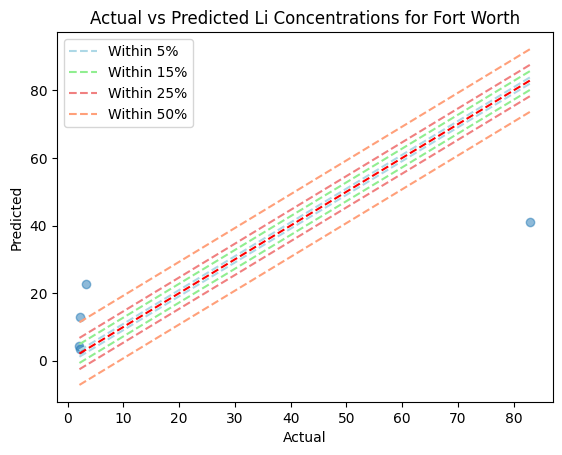

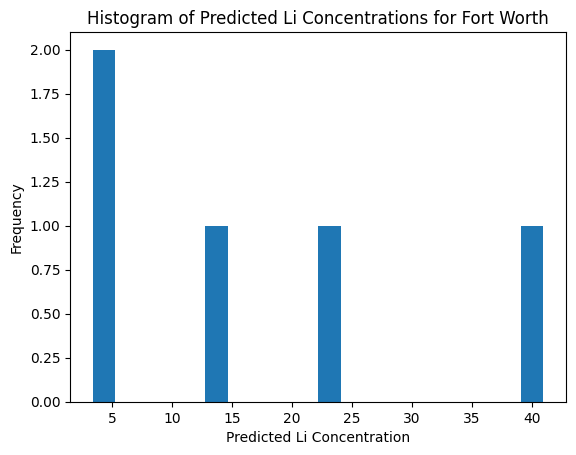

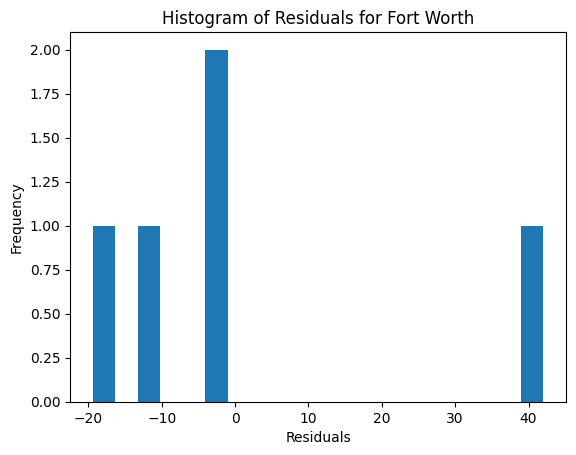

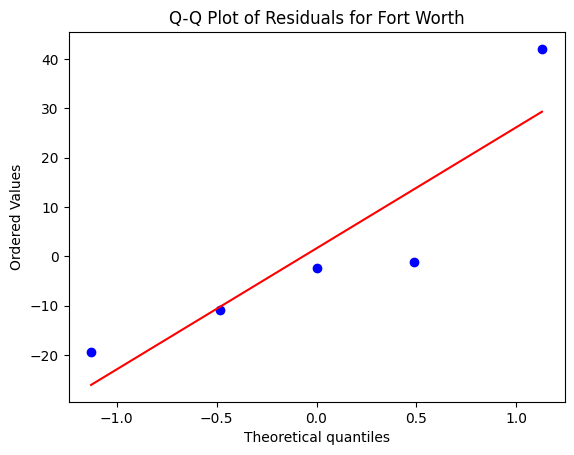

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
8,03_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",1,"[0.01, 0.05, 0.1, 0.2]",0.20,30765.01,32941.87,181.50,47.33,-0.07,62.50,87.50,93.75,93.75
3,03_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",0.01,19313.62,1476.72,38.43,17.57,0.92,35.59,65.32,70.72,82.43
9,03_PCA,Anadarko,262,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50]",10,"[0.01, 0.05, 0.1, 0.2]",0.05,8090.75,3579.74,59.83,17.54,0.56,24.24,60.61,68.18,78.79
7,03_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",10,"[0.01, 0.05, 0.1, 0.2]",0.01,155.89,67.01,8.19,5.23,0.57,28.57,57.14,71.43,71.43
4,03_PCA,Williston,502,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",0.01,2013.45,223.96,14.97,9.34,0.89,16.67,42.86,61.90,84.13
10,03_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",0.01,175.57,52.74,7.26,3.28,0.70,23.56,40.80,59.20,78.74
6,03_PCA,Pacific,145,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50,"[0.01, 0.05, 0.1, 0.2]",0.20,8.38,0.79,0.89,0.64,0.91,13.51,40.54,56.76,83.78
11,03_PCA,Fort Worth,17,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10, 50]",10,"[0.01, 0.05, 0.1, 0.2]",0.01,1038.83,453.78,21.30,15.17,0.56,0.00,40.00,40.00,40.00
1,03_PCA,Permian,481,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50]",1,"[0.01, 0.05, 0.1, 0.2]",0.01,4106.05,3327.81,57.69,13.86,0.19,14.05,34.71,51.24,83.47
0,03_PCA,Appalachian,652,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50]",10,"[0.01, 0.05, 0.1, 0.2]",0.05,3942.02,1805.57,42.49,25.27,0.54,12.88,33.74,49.08,78.53


In [55]:
# Define all the variables...
df = df_pca_all_basins.copy()
round = '03_PCA'
basins = df_data['BASIN_CATEGORY'].unique()
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10, 50]
epsilon_values = [0.01, 0.05, 0.1, 0.2]

# Run the function...
df_round03_pca = generate_svr_models_by_basin_from_pca(df=df, round=round, basins=basins, test_size=test_size, random_state=random_state, 
                                                       kernel_values=kernel_values, c_values=c_values, epsilon_values=epsilon_values)
df_round03_pca

### ROUND 4 (PCA)

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 10, 'epsilon': 0.05, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 1805.5713604143243
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 42.492015254801984
MAE of the best SVR model: 25.265024059691633
R-squared (Coefficient of Determination): 0.5419678668051269
Percentage of predictions within 5% of the correct values: 12.883435582822086
Percentage of predictions within 15% of the correct values: 33.74233128834356
Percentage of predictions within 25% of the correct values: 49.079754601226995
Percentage of predictions within 50% of the correct values: 78.52760736196319
-------------------------------


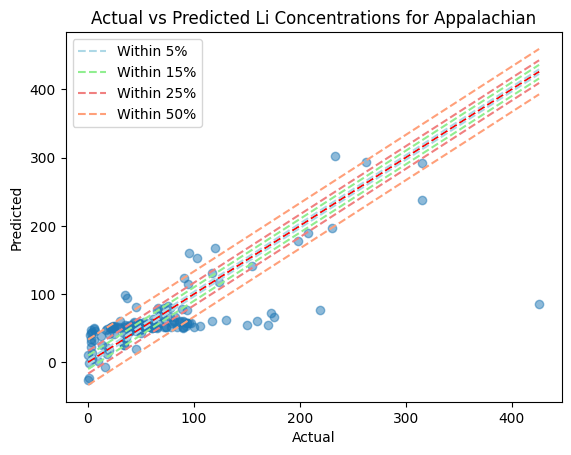

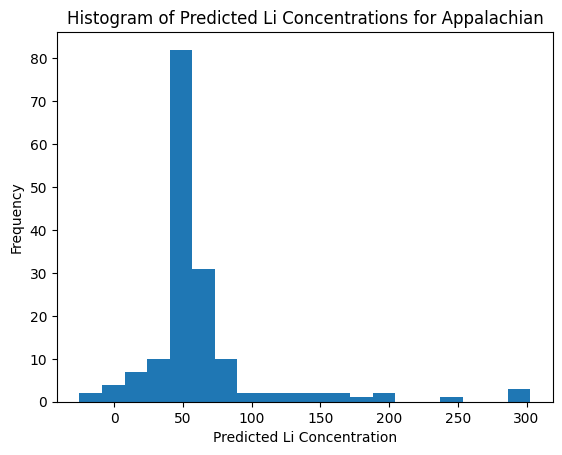

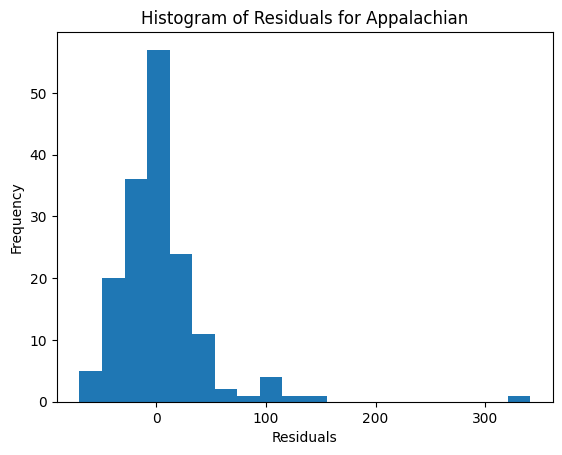

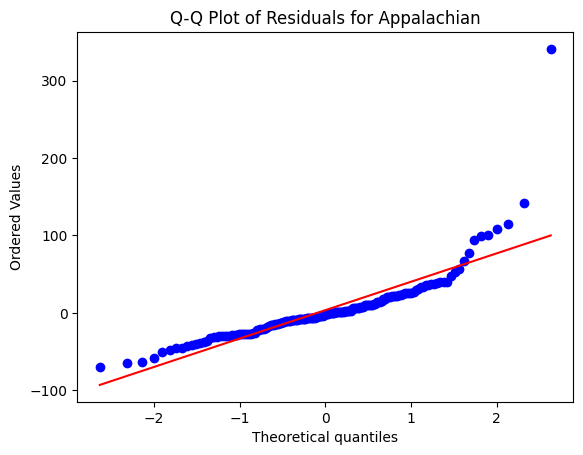

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 1, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531727
MSE of the model: 3327.8051208104575
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 57.6871313276233
MAE of the best SVR model: 13.856571043815228
R-squared (Coefficient of Determination): 0.18953630378305186
Percentage of predictions within 5% of the correct values: 14.049586776859504
Percentage of predictions within 15% of the correct values: 34.710743801652896
Percentage of predictions within 25% of the correct values: 51.2396694214876
Percentage of predictions within 50% of the correct values: 83.47107438016529
-------------------------------


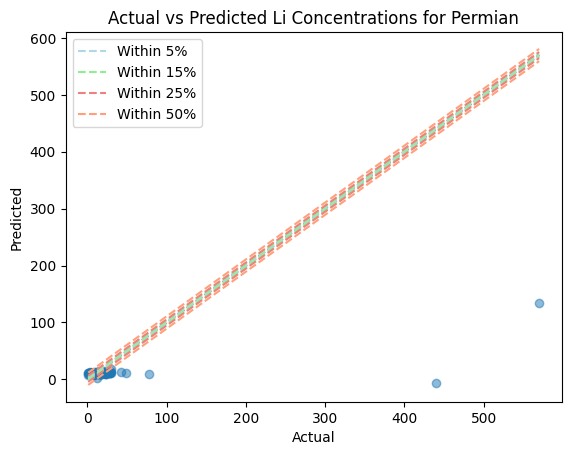

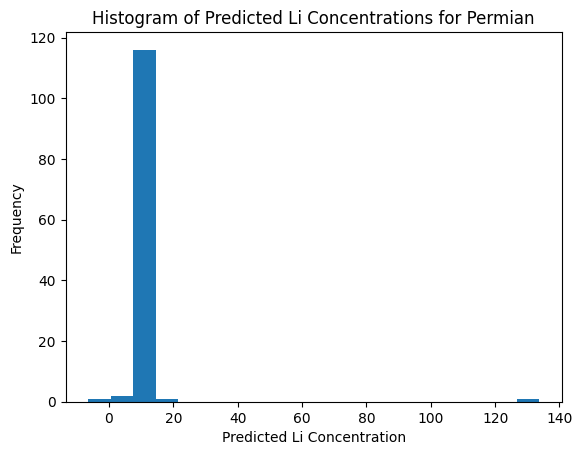

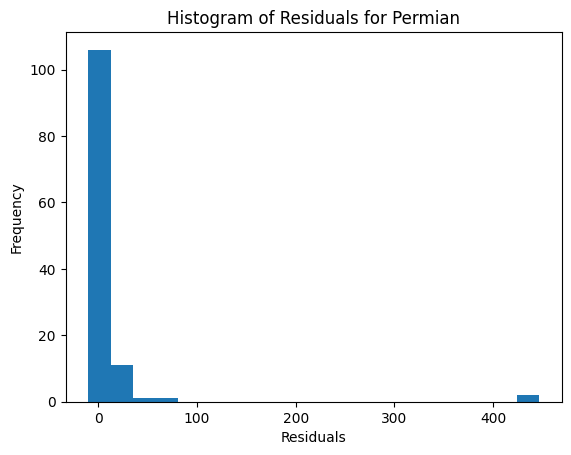

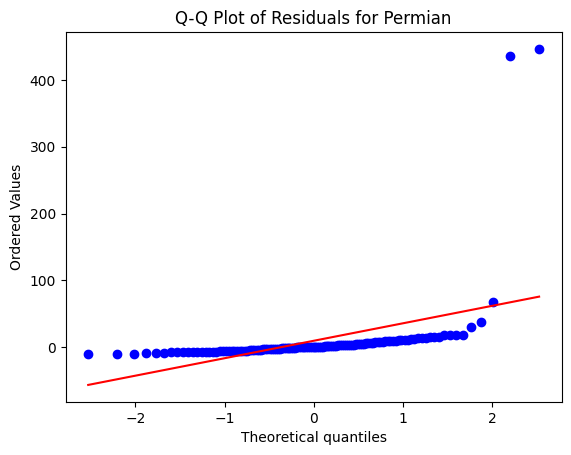

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.398918359375
MSE of the model: 87.06508253763526
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.330867191083327
MAE of the best SVR model: 7.330972509027428
R-squared (Coefficient of Determination): 0.7176868096658531
Percentage of predictions within 5% of the correct values: 9.375
Percentage of predictions within 15% of the correct values: 28.125
Percentage of predictions within 25% of the correct values: 43.75
Percentage of predictions within 50% of the correct values: 75.0
-------------------------------


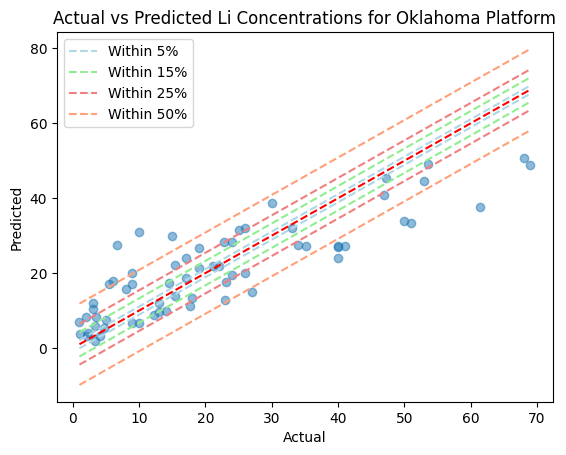

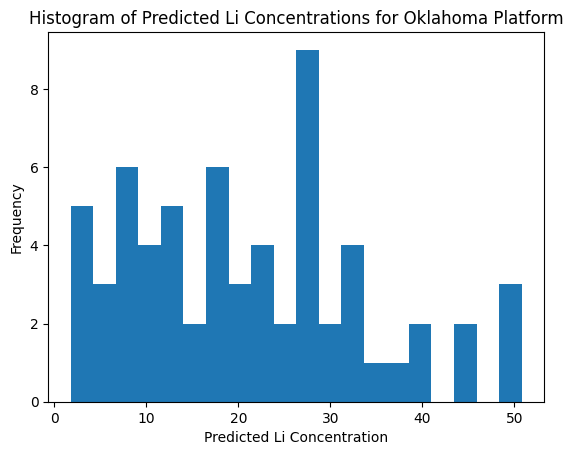

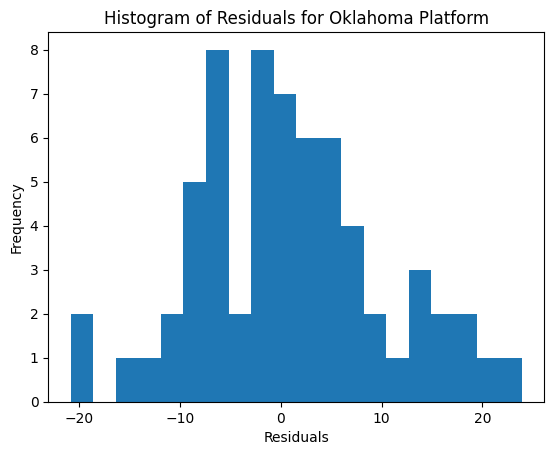

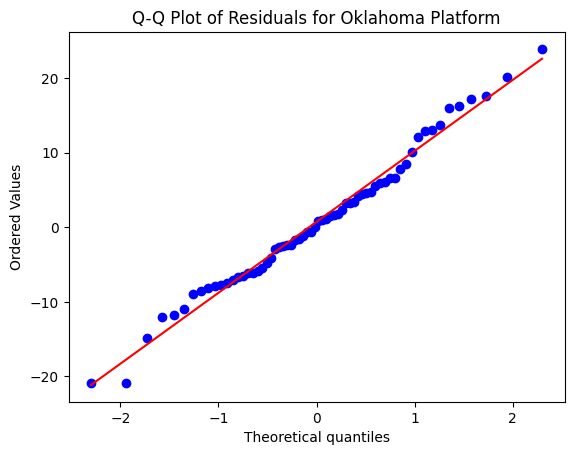

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 10, 'epsilon': 0.05, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.615187723528
MSE of the model: 1472.3662754906502
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 38.37142524705917
MAE of the best SVR model: 17.562519612773897
R-squared (Coefficient of Determination): 0.9237653716728009
Percentage of predictions within 5% of the correct values: 34.234234234234236
Percentage of predictions within 15% of the correct values: 65.31531531531532
Percentage of predictions within 25% of the correct values: 70.72072072072072
Percentage of predictions within 50% of the correct values: 82.88288288288288
-------------------------------


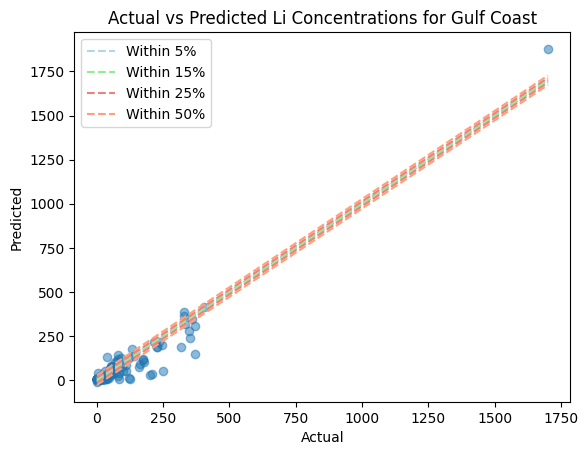

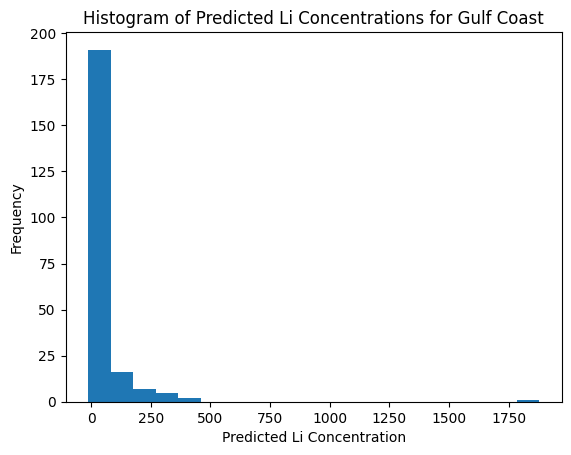

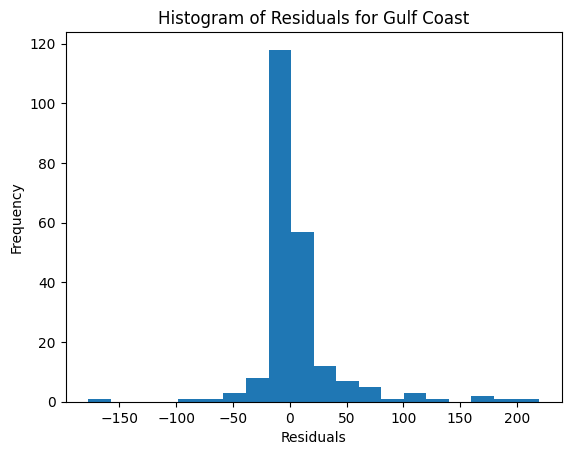

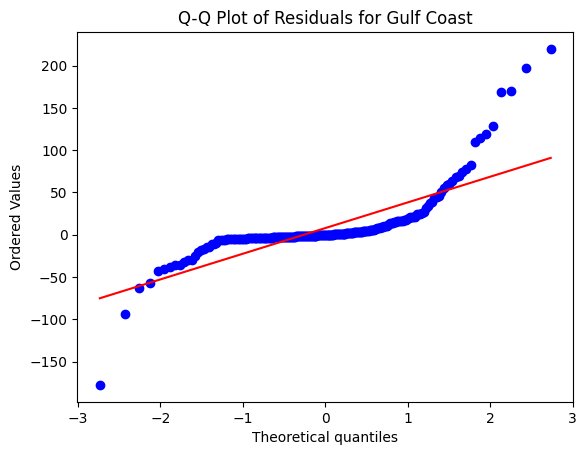

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 5, 'epsilon': 0.01, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274207
MSE of the model: 16601.99989926907
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 128.84874814785385
MAE of the best SVR model: 29.93569499490949
R-squared (Coefficient of Determination): -7.245563022761697
Percentage of predictions within 5% of the correct values: 7.936507936507936
Percentage of predictions within 15% of the correct values: 32.53968253968254
Percentage of predictions within 25% of the correct values: 45.23809523809524
Percentage of predictions within 50% of the correct values: 67.46031746031747
-------------------------------


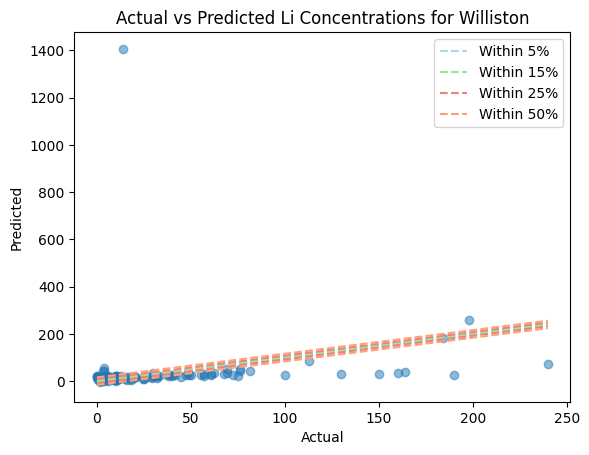

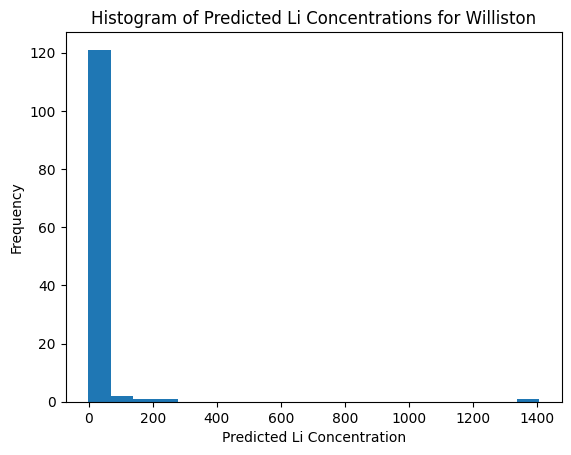

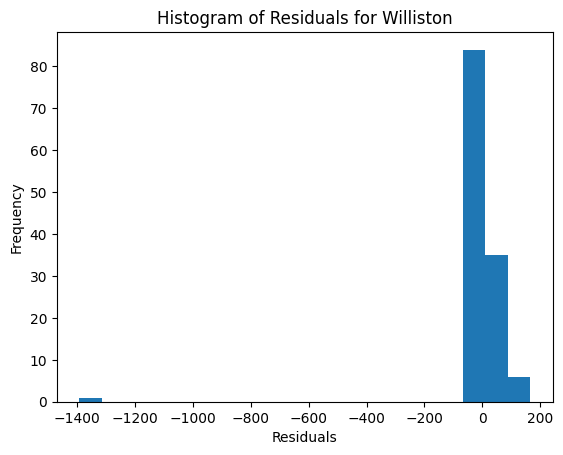

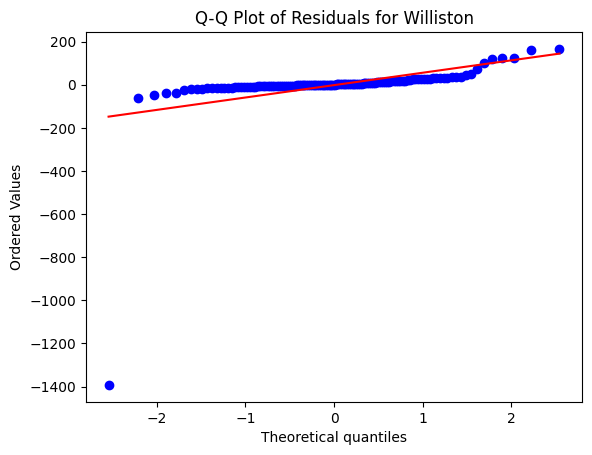

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 1, 'epsilon': 0.05, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 144.04337912916202
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 12.001807327613705
MAE of the best SVR model: 8.97258034249763
R-squared (Coefficient of Determination): 0.5740567468578572
Percentage of predictions within 5% of the correct values: 5.263157894736842
Percentage of predictions within 15% of the correct values: 21.052631578947366
Percentage of predictions within 25% of the correct values: 52.63157894736842
Percentage of predictions within 50% of the correct values: 78.94736842105263
-------------------------------


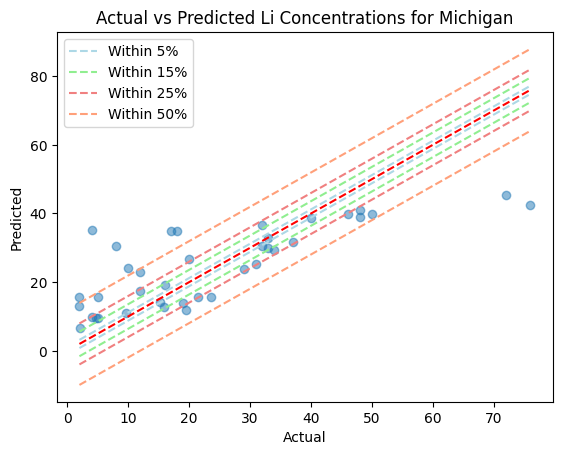

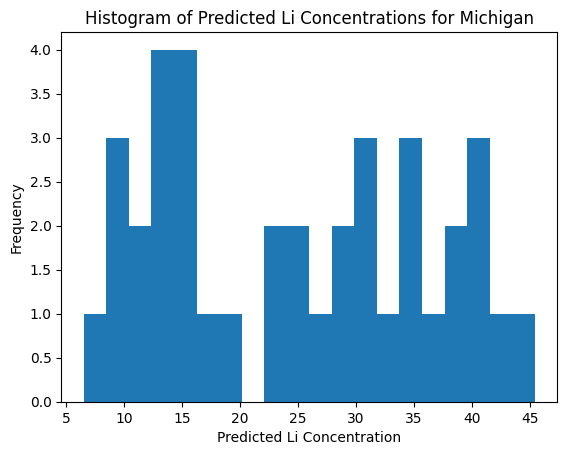

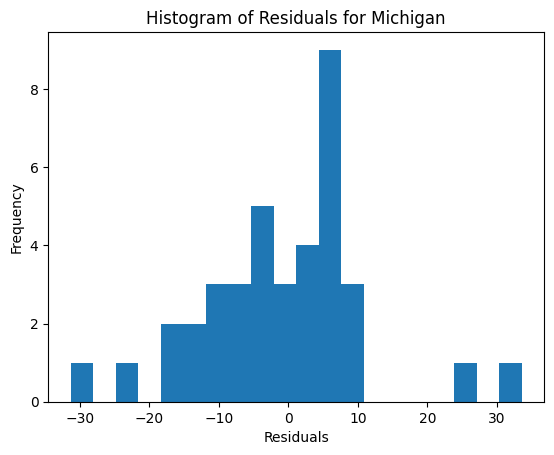

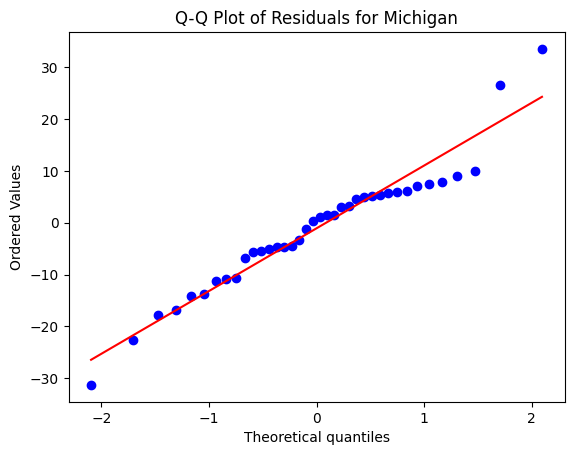

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 5, 'epsilon': 0.05, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 1.246490859480395
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.1164635504486453
MAE of the best SVR model: 0.6136760836859443
R-squared (Coefficient of Determination): 0.8513158988529719
Percentage of predictions within 5% of the correct values: 21.62162162162162
Percentage of predictions within 15% of the correct values: 54.054054054054056
Percentage of predictions within 25% of the correct values: 64.86486486486487
Percentage of predictions within 50% of the correct values: 81.08108108108108
-------------------------------


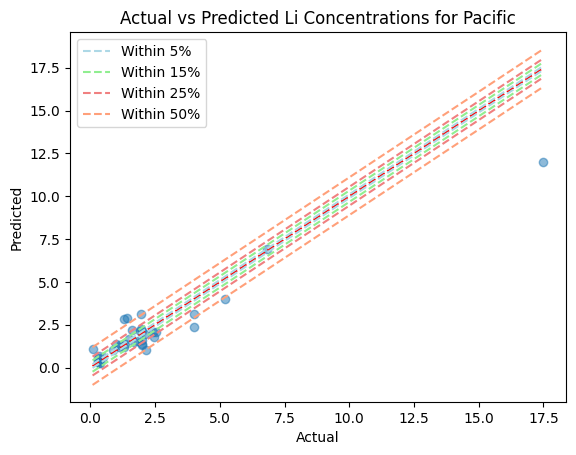

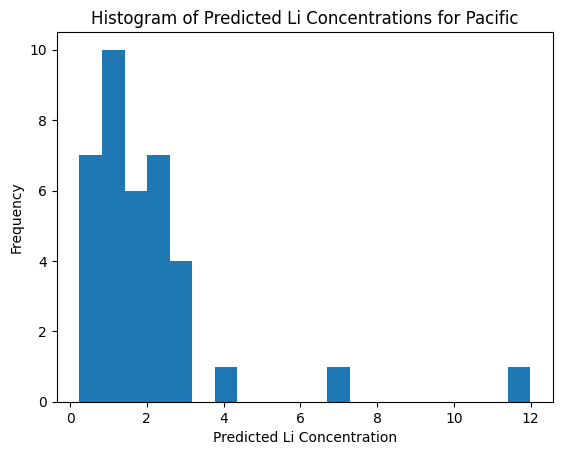

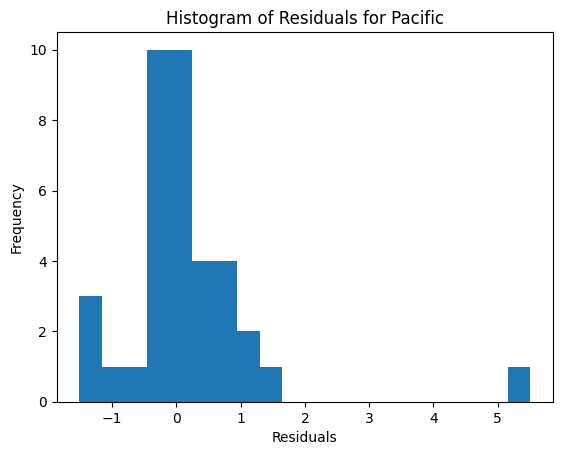

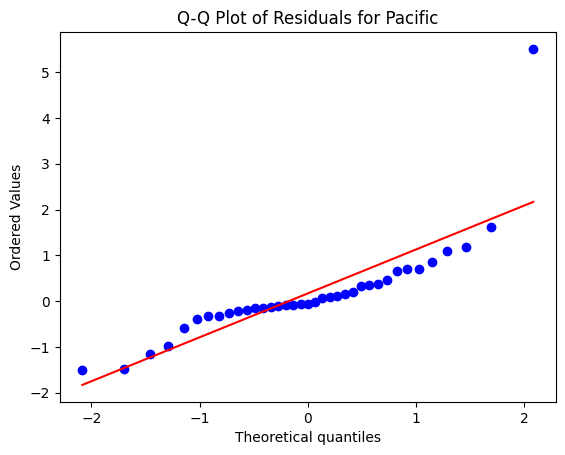

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 67.013445625701
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.1861740529811
MAE of the best SVR model: 5.231397083760982
R-squared (Coefficient of Determination): 0.5701300068124784
Percentage of predictions within 5% of the correct values: 28.57142857142857
Percentage of predictions within 15% of the correct values: 57.14285714285714
Percentage of predictions within 25% of the correct values: 71.42857142857143
Percentage of predictions within 50% of the correct values: 71.42857142857143
-------------------------------


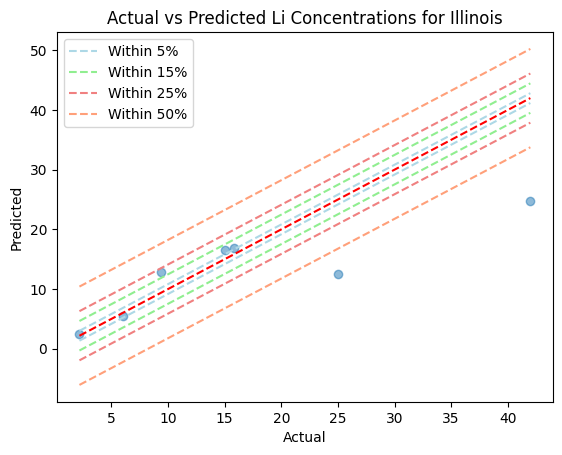

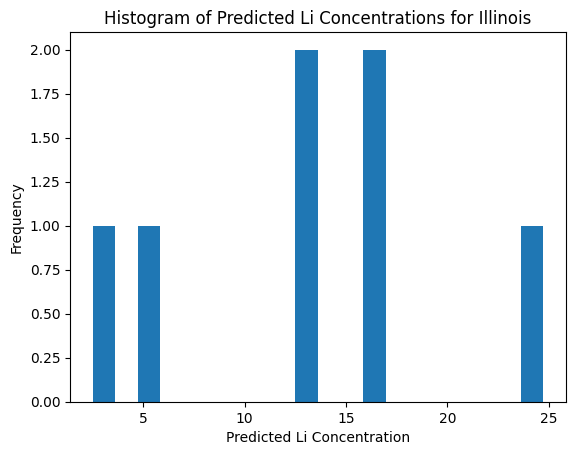

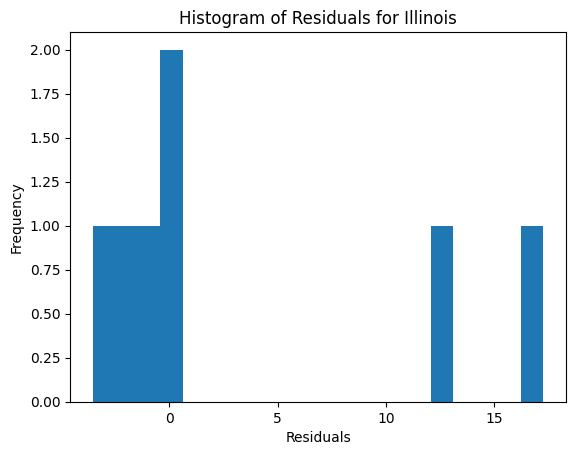

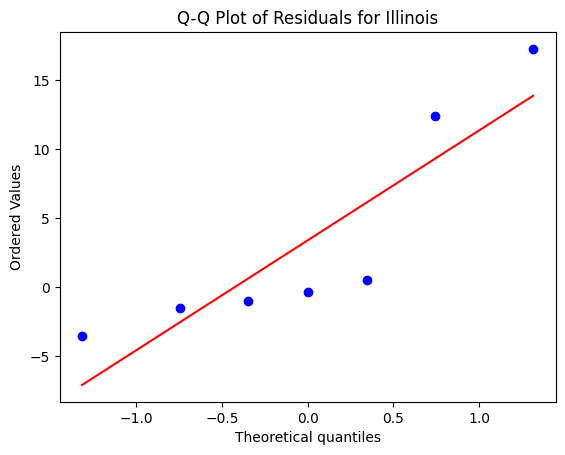

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 1, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32943.94202378585
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 181.5046611626981
MAE of the best SVR model: 47.36406373690877
R-squared (Coefficient of Determination): -0.07082488616493743
Percentage of predictions within 5% of the correct values: 62.5
Percentage of predictions within 15% of the correct values: 87.5
Percentage of predictions within 25% of the correct values: 93.75
Percentage of predictions within 50% of the correct values: 93.75
-------------------------------


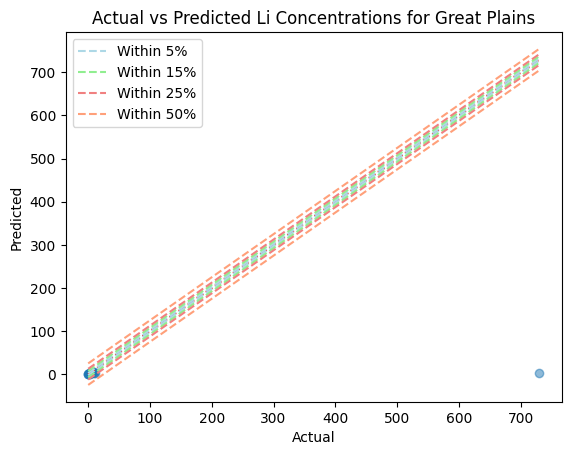

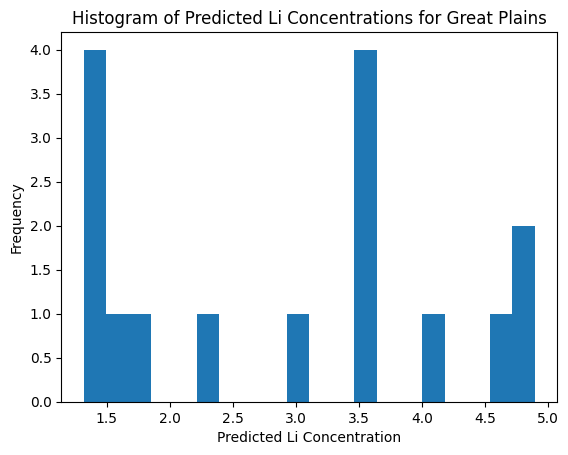

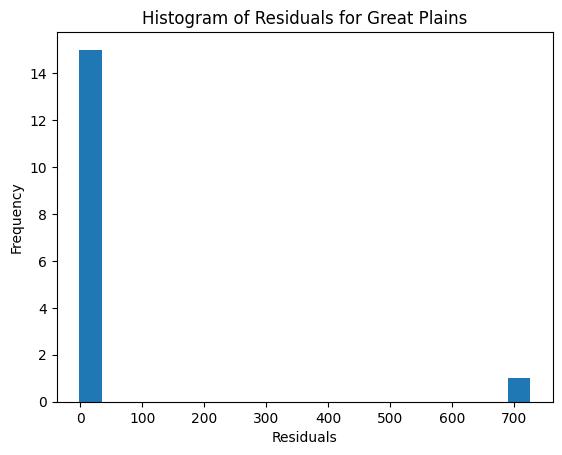

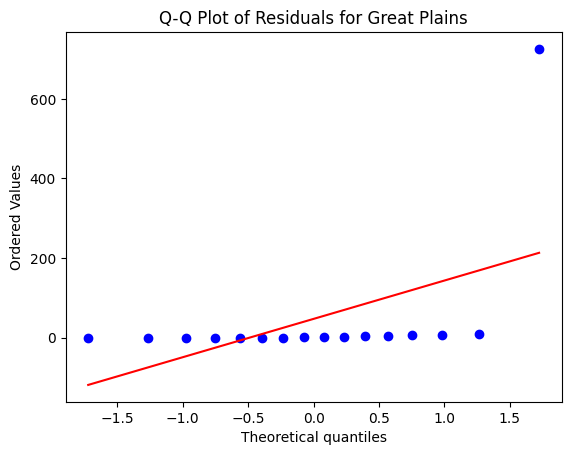

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 10, 'epsilon': 0.05, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310375
MSE of the model: 3579.7357240267957
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 59.83089272296374
MAE of the best SVR model: 17.535826952548025
R-squared (Coefficient of Determination): 0.5575521563810301
Percentage of predictions within 5% of the correct values: 24.242424242424242
Percentage of predictions within 15% of the correct values: 60.60606060606061
Percentage of predictions within 25% of the correct values: 68.18181818181817
Percentage of predictions within 50% of the correct values: 78.78787878787878
-------------------------------


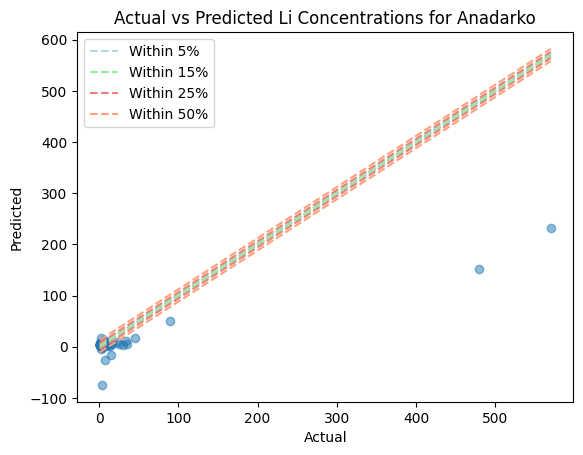

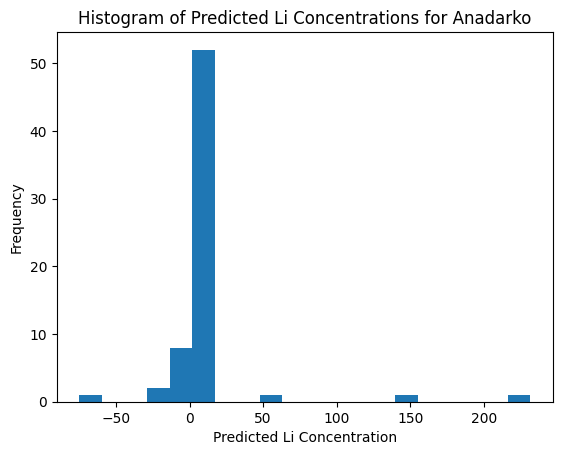

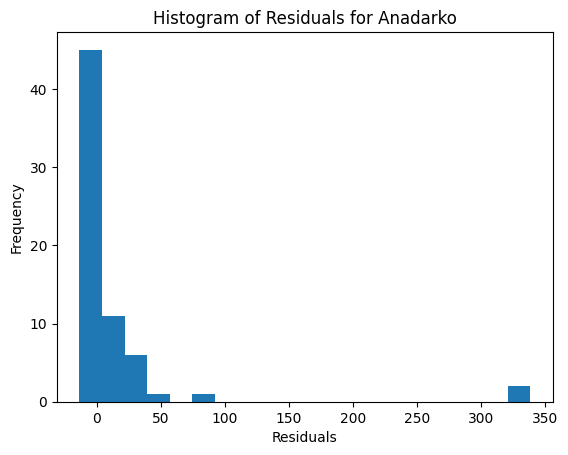

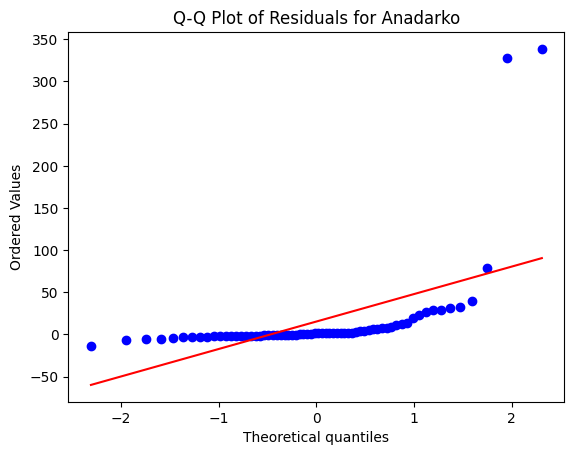

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134763
MSE of the model: 73.18517555844468
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.554833461759772
MAE of the best SVR model: 3.406151560429398
R-squared (Coefficient of Determination): 0.583162719752613
Percentage of predictions within 5% of the correct values: 22.988505747126435
Percentage of predictions within 15% of the correct values: 44.252873563218394
Percentage of predictions within 25% of the correct values: 60.91954022988506
Percentage of predictions within 50% of the correct values: 80.45977011494253
-------------------------------


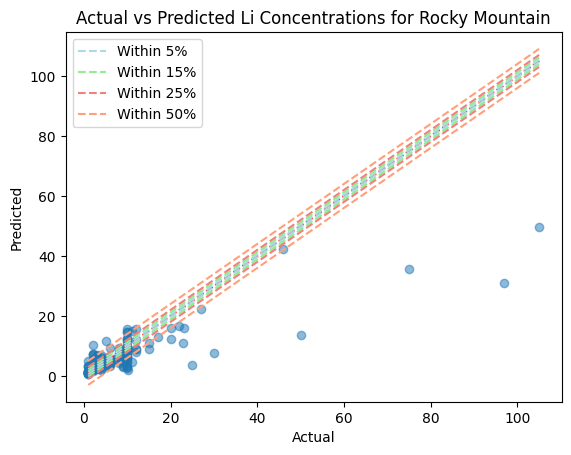

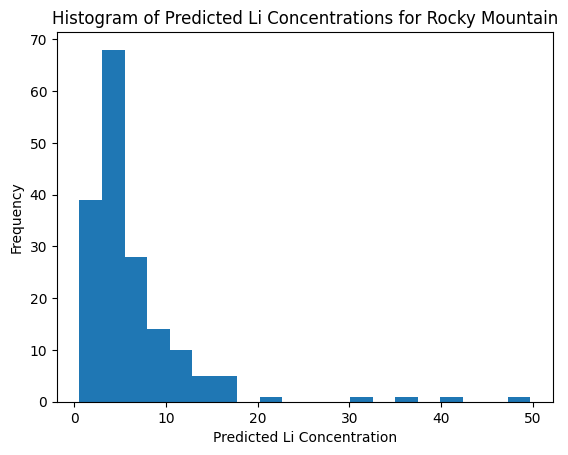

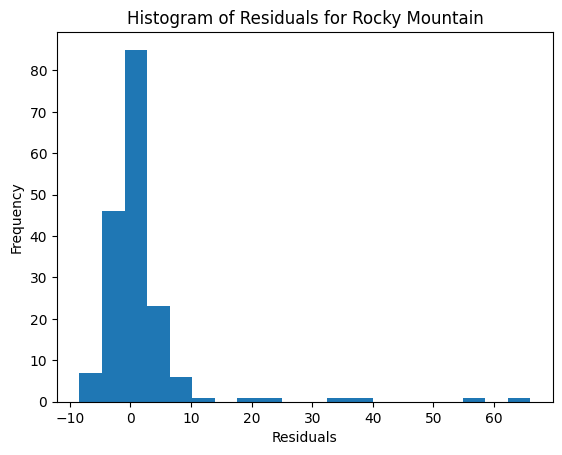

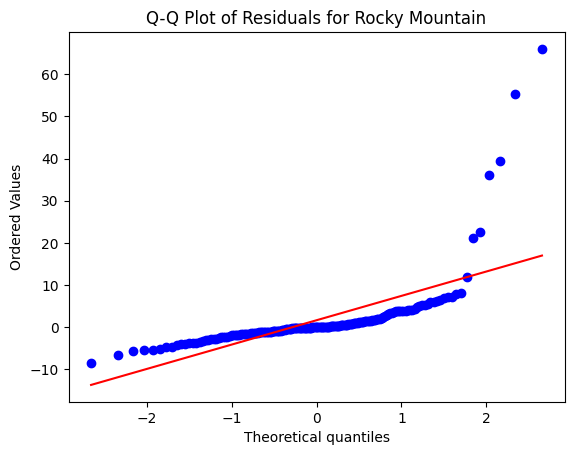

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 453.78131498076607
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 21.30214343630157
MAE of the best SVR model: 15.174141263458775
R-squared (Coefficient of Determination): 0.563179626843118
Percentage of predictions within 5% of the correct values: 0.0
Percentage of predictions within 15% of the correct values: 40.0
Percentage of predictions within 25% of the correct values: 40.0
Percentage of predictions within 50% of the correct values: 40.0
-------------------------------


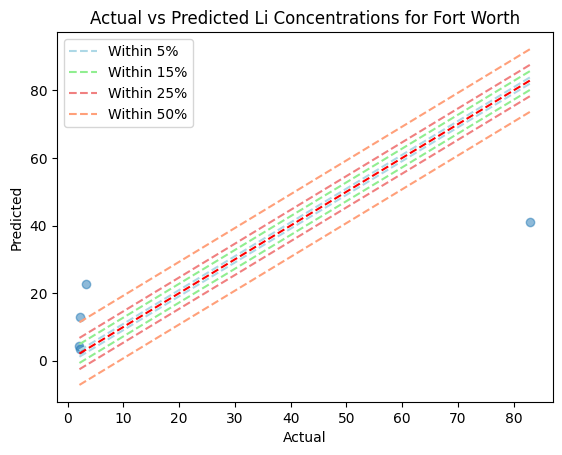

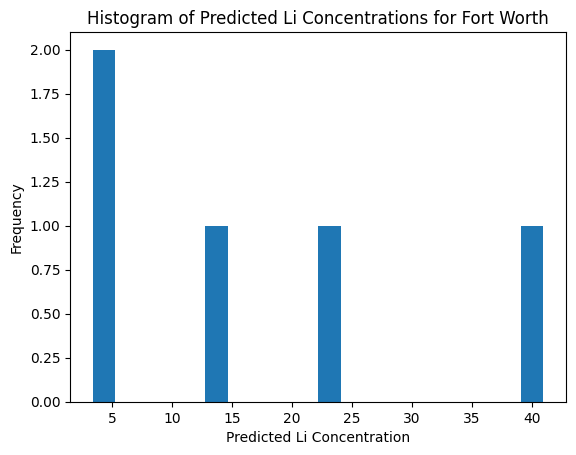

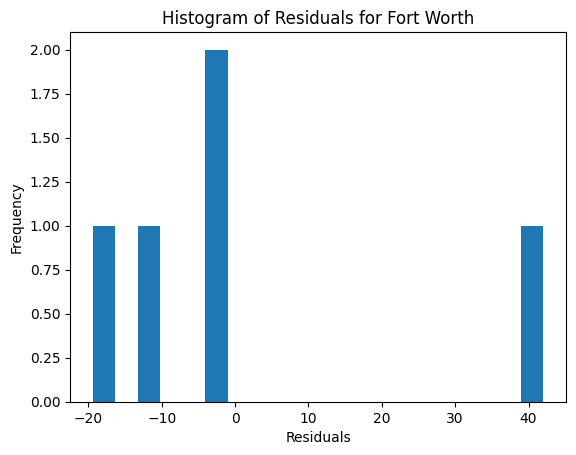

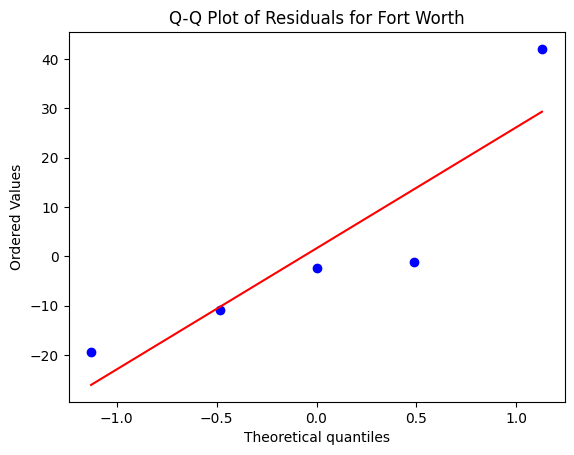

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
8,04_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",1,"[0.01, 0.05, 0.1]",0.10,30765.01,32943.94,181.50,47.36,-0.07,62.50,87.50,93.75,93.75
3,04_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",10,"[0.01, 0.05, 0.1]",0.05,19313.62,1472.37,38.37,17.56,0.92,34.23,65.32,70.72,82.88
9,04_PCA,Anadarko,262,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",10,"[0.01, 0.05, 0.1]",0.05,8090.75,3579.74,59.83,17.54,0.56,24.24,60.61,68.18,78.79
7,04_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",10,"[0.01, 0.05, 0.1]",0.01,155.89,67.01,8.19,5.23,0.57,28.57,57.14,71.43,71.43
6,04_PCA,Pacific,145,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",5,"[0.01, 0.05, 0.1]",0.05,8.38,1.25,1.12,0.61,0.85,21.62,54.05,64.86,81.08
10,04_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",10,"[0.01, 0.05, 0.1]",0.01,175.57,73.19,8.55,3.41,0.58,22.99,44.25,60.92,80.46
11,04_PCA,Fort Worth,17,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",sigmoid,"[0.1, 0.5, 1, 5, 10]",10,"[0.01, 0.05, 0.1]",0.01,1038.83,453.78,21.30,15.17,0.56,0.00,40.00,40.00,40.00
1,04_PCA,Permian,481,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",1,"[0.01, 0.05, 0.1]",0.01,4106.05,3327.81,57.69,13.86,0.19,14.05,34.71,51.24,83.47
0,04_PCA,Appalachian,652,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",10,"[0.01, 0.05, 0.1]",0.05,3942.02,1805.57,42.49,25.27,0.54,12.88,33.74,49.08,78.53
4,04_PCA,Williston,502,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",5,"[0.01, 0.05, 0.1]",0.01,2013.45,16602.00,128.85,29.94,-7.25,7.94,32.54,45.24,67.46


In [56]:
# Define all the variables...
df = df_pca_all_basins.copy()
round = '04_PCA'
basins = df_data['BASIN_CATEGORY'].unique()
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [0.1, 0.5, 1, 5, 10]
epsilon_values = [0.01, 0.05, 0.1]

# Run the function...
df_round04_pca = generate_svr_models_by_basin_from_pca(df=df, round=round, basins=basins, test_size=test_size, random_state=random_state, 
                                                       kernel_values=kernel_values, c_values=c_values, epsilon_values=epsilon_values)
df_round04_pca

### ROUND 5 (PCA)

Appalachian
Number of data points:  652
Number of samples in the training dataset: 391
Best parameters: {'C': 200, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4226.988241849062
MSE of the model: 1751.6945918142442
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 41.853250672011654
MAE of the best SVR model: 22.102224446228295
R-squared (Coefficient of Determination): 0.5855927455696022
Percentage of predictions within 5% of the correct values: 20.306513409961685
Percentage of predictions within 15% of the correct values: 43.67816091954023
Percentage of predictions within 25% of the correct values: 59.00383141762452
Percentage of predictions within 50% of the correct values: 79.3103448275862
-------------------------------


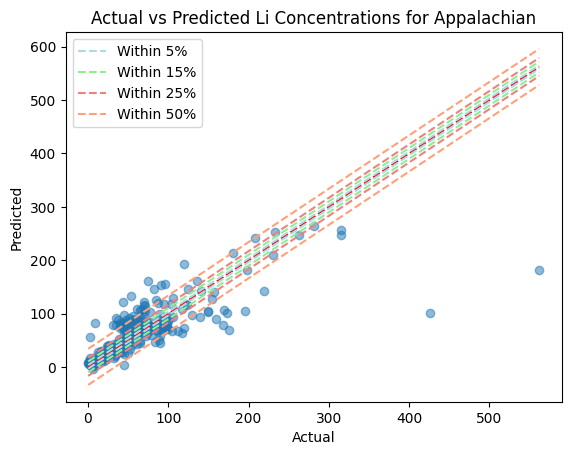

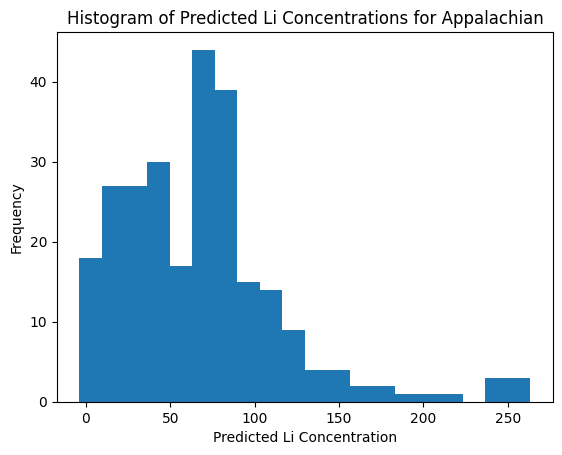

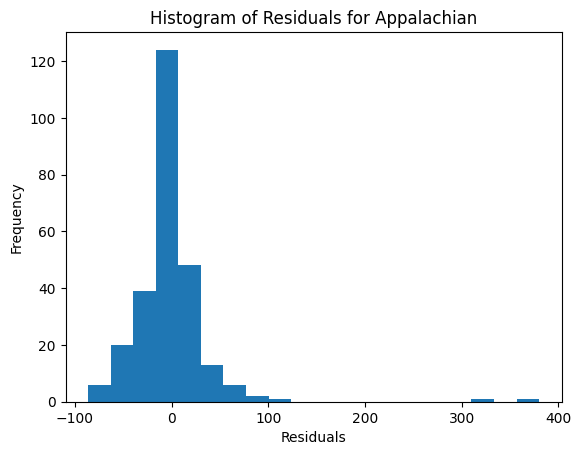

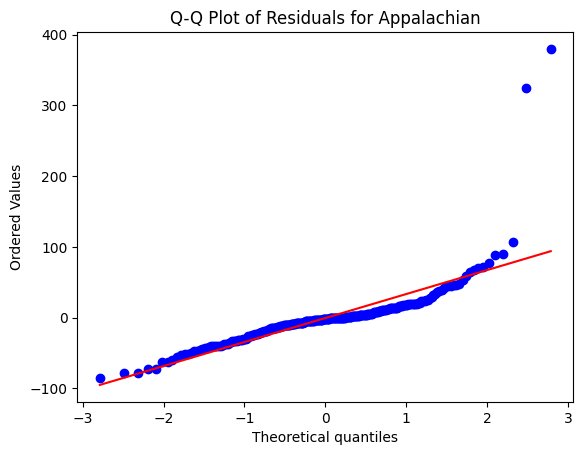

Permian
Number of data points:  481
Number of samples in the training dataset: 288
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4363.275946903273
MSE of the model: 4430.885515424995
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 66.56489702106505
MAE of the best SVR model: 13.793445653303293
R-squared (Coefficient of Determination): -0.015495139281691994
Percentage of predictions within 5% of the correct values: 17.616580310880828
Percentage of predictions within 15% of the correct values: 44.04145077720207
Percentage of predictions within 25% of the correct values: 63.212435233160626
Percentage of predictions within 50% of the correct values: 86.52849740932642
-------------------------------


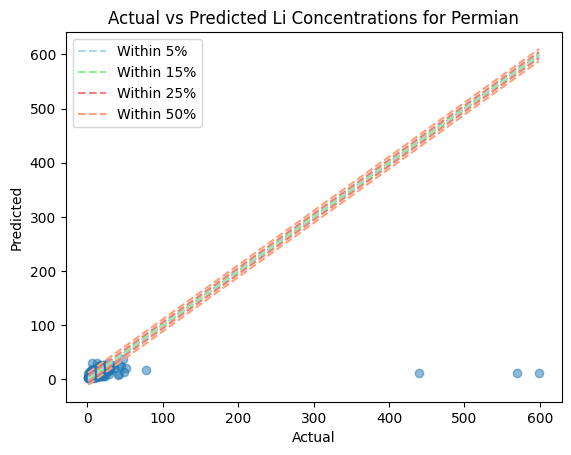

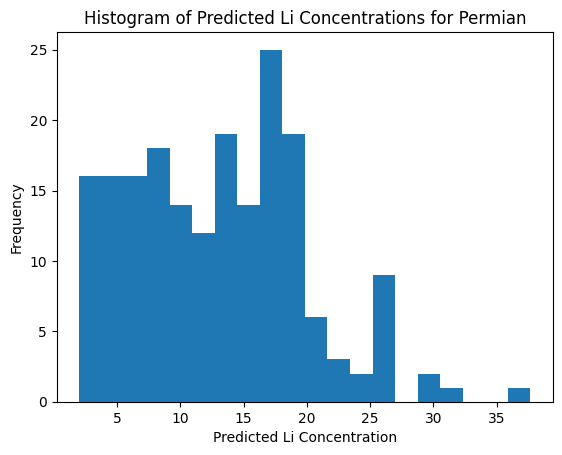

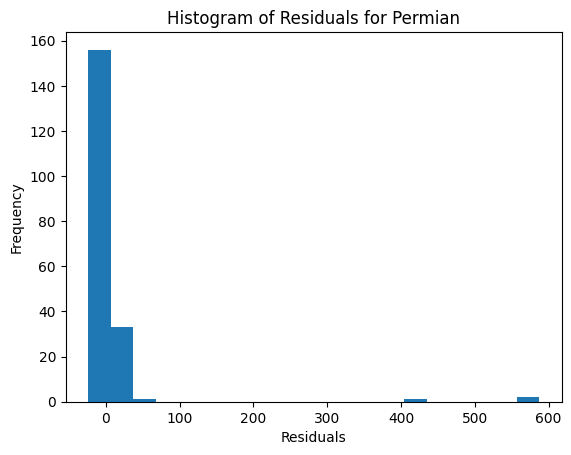

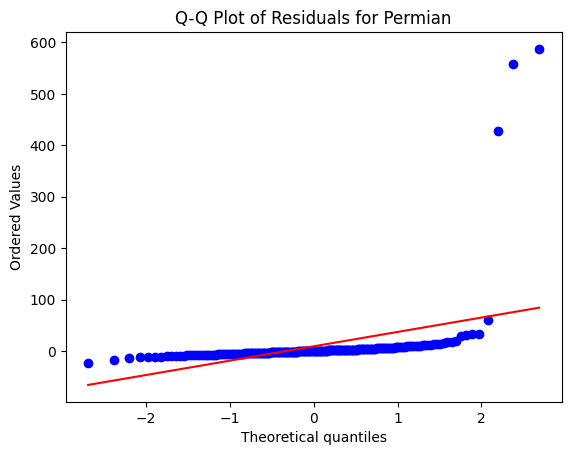

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 152
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 262.25286420607466
MSE of the model: 58.040891811039
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.618457311755379
MAE of the best SVR model: 5.736832837892097
R-squared (Coefficient of Determination): 0.7786834779221656
Percentage of predictions within 5% of the correct values: 13.725490196078432
Percentage of predictions within 15% of the correct values: 31.372549019607842
Percentage of predictions within 25% of the correct values: 50.98039215686274
Percentage of predictions within 50% of the correct values: 81.37254901960785
-------------------------------


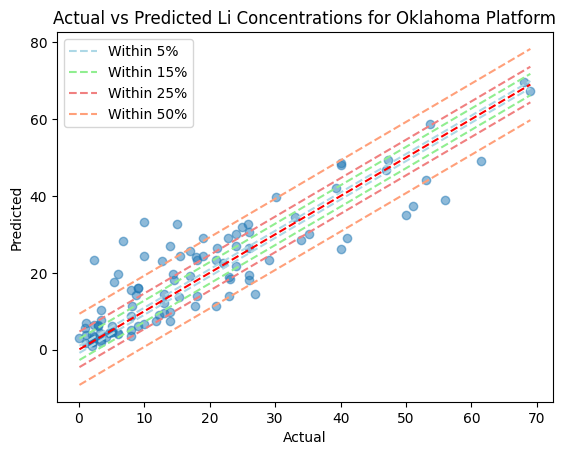

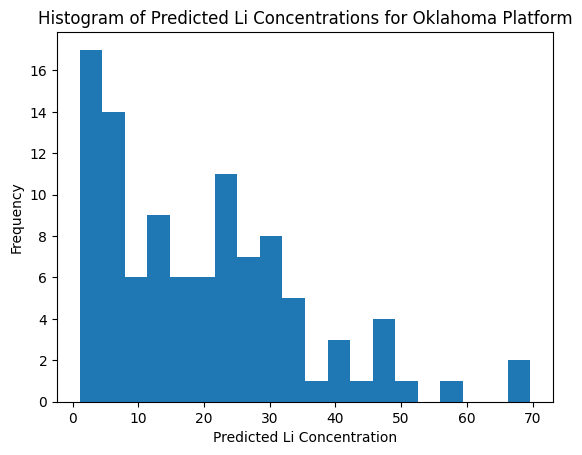

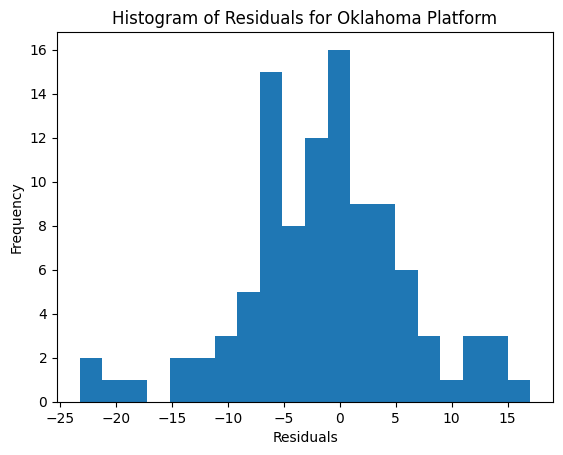

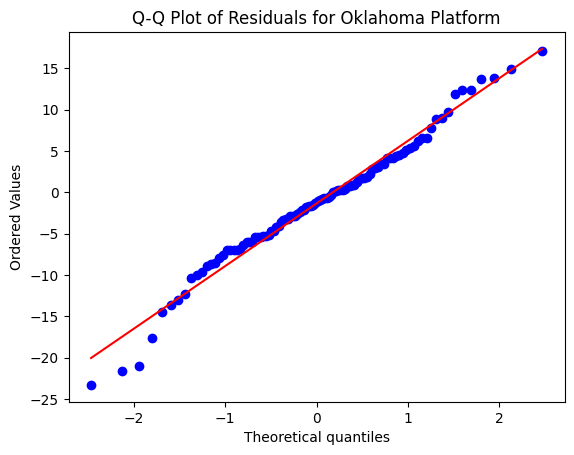

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 532
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 15220.196403299022
MSE of the model: 1378.8800844795908
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 37.13327462639931
MAE of the best SVR model: 18.126865732971886
R-squared (Coefficient of Determination): 0.9094045800761996
Percentage of predictions within 5% of the correct values: 30.337078651685395
Percentage of predictions within 15% of the correct values: 62.64044943820225
Percentage of predictions within 25% of the correct values: 69.3820224719101
Percentage of predictions within 50% of the correct values: 80.6179775280899
-------------------------------


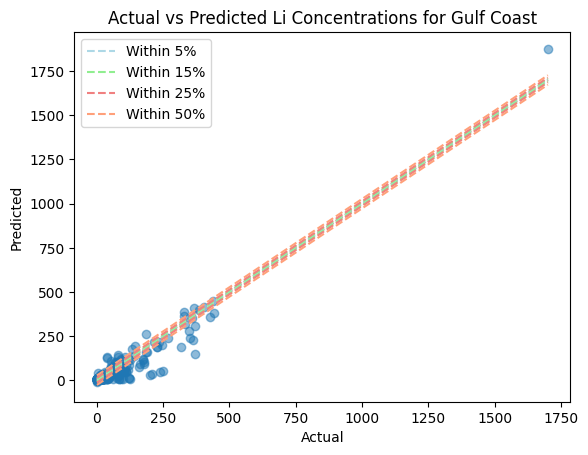

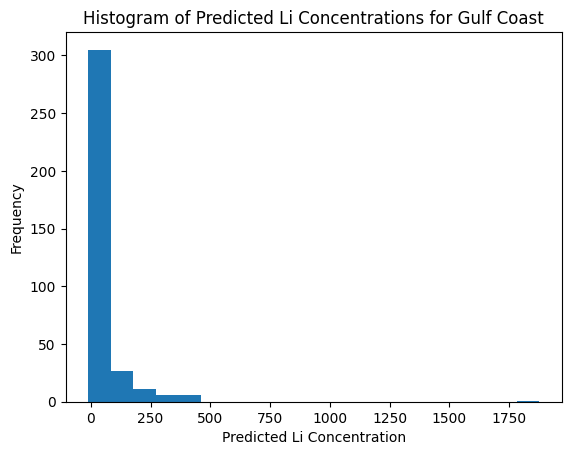

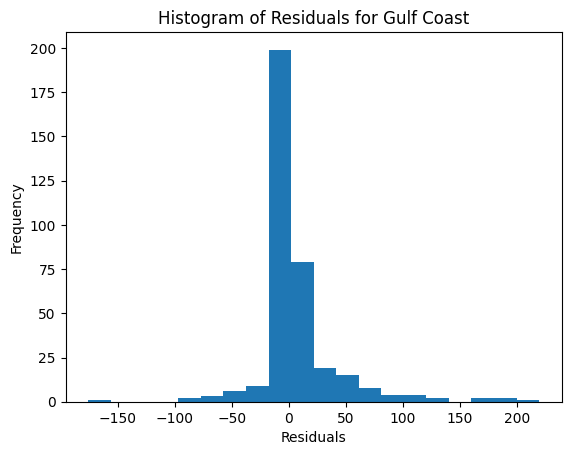

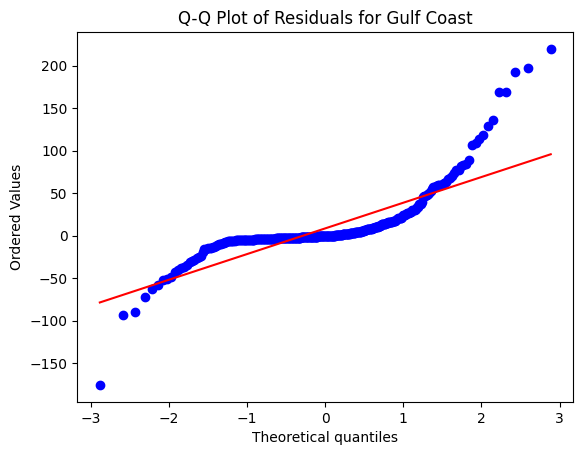

Williston
Number of data points:  502
Number of samples in the training dataset: 301
Best parameters: {'C': 200, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3119.976659452595
MSE of the model: 389.3797339348225
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 19.73270721251452
MAE of the best SVR model: 10.560744448215667
R-squared (Coefficient of Determination): 0.8751978695881847
Percentage of predictions within 5% of the correct values: 23.88059701492537
Percentage of predictions within 15% of the correct values: 53.233830845771145
Percentage of predictions within 25% of the correct values: 67.66169154228857
Percentage of predictions within 50% of the correct values: 83.08457711442786
-------------------------------


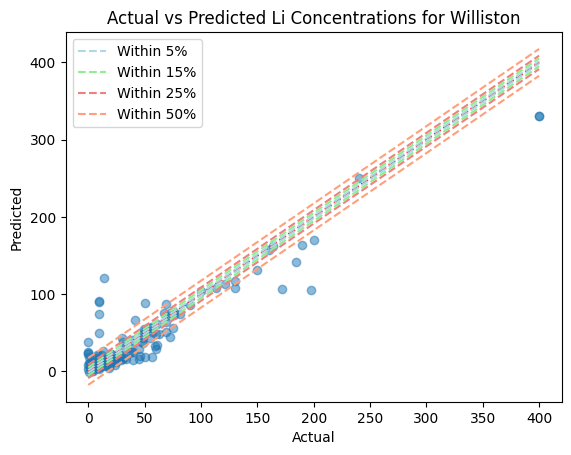

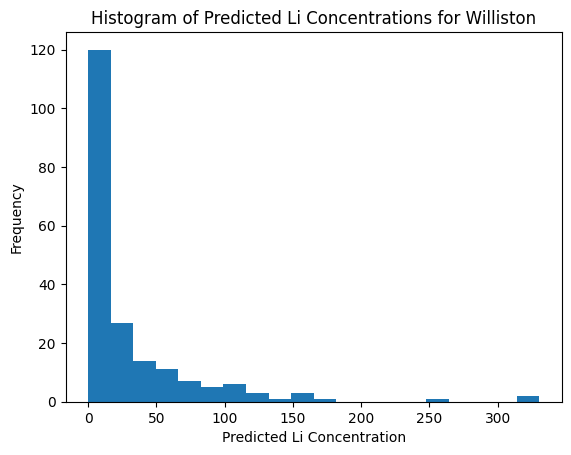

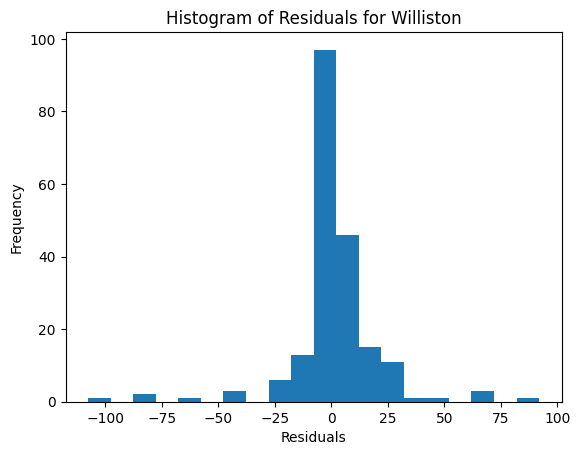

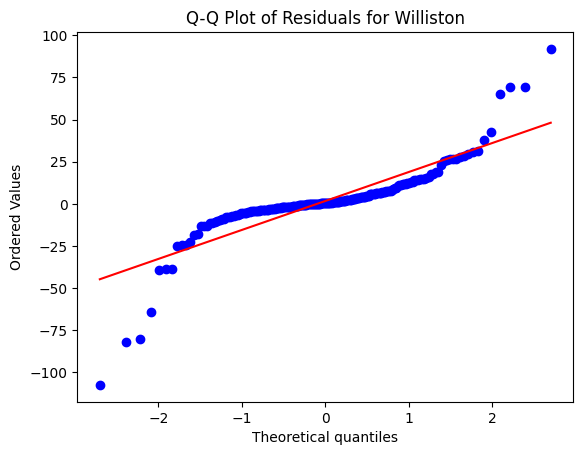

Michigan
Number of data points:  150
Number of samples in the training dataset: 90
Best parameters: {'C': 150, 'epsilon': 0.3, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 294.2037282222222
MSE of the model: 390.6953803014368
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 19.76601579229959
MAE of the best SVR model: 11.429876250689027
R-squared (Coefficient of Determination): -0.3279756264894478
Percentage of predictions within 5% of the correct values: 16.666666666666664
Percentage of predictions within 15% of the correct values: 28.333333333333332
Percentage of predictions within 25% of the correct values: 45.0
Percentage of predictions within 50% of the correct values: 68.33333333333333
-------------------------------


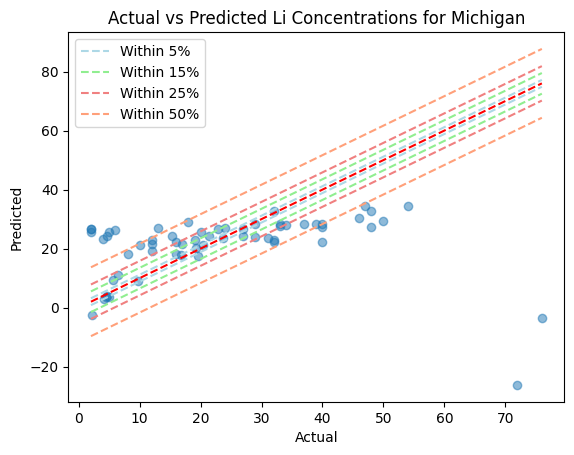

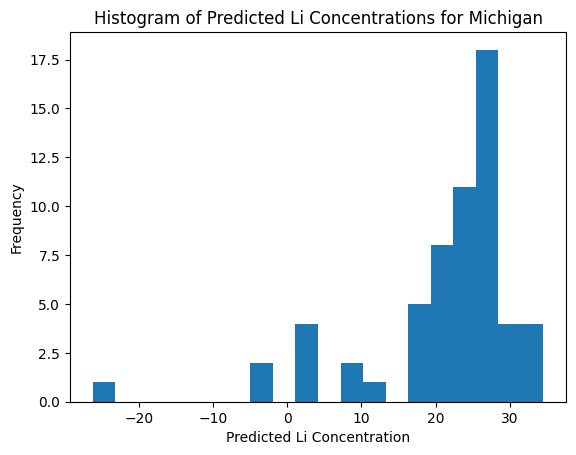

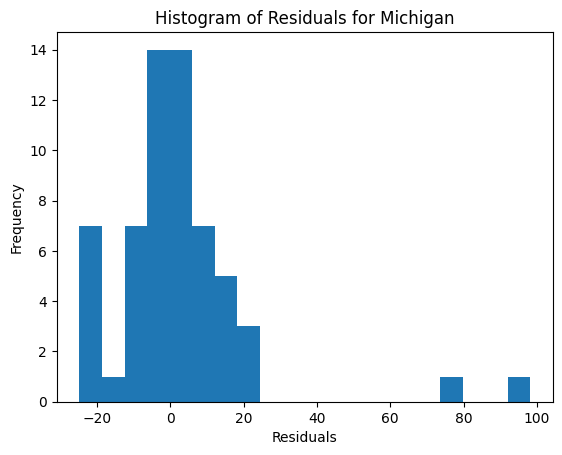

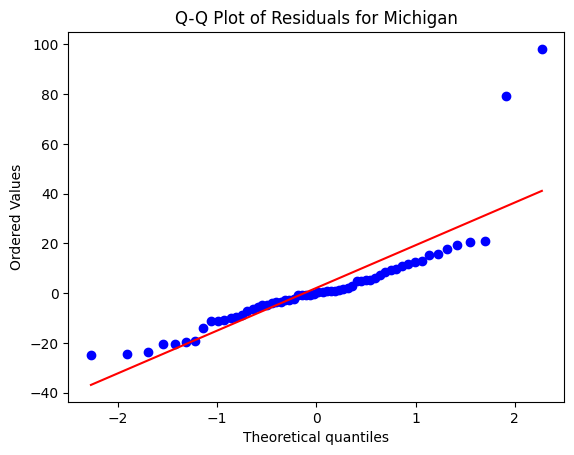

Pacific
Number of data points:  145
Number of samples in the training dataset: 87
Best parameters: {'C': 10, 'epsilon': 0.2, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 6.184807498513675
MSE of the model: 1.2649518248102016
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 1.1247007712321537
MAE of the best SVR model: 0.6990604432253729
R-squared (Coefficient of Determination): 0.7954743417456092
Percentage of predictions within 5% of the correct values: 15.517241379310345
Percentage of predictions within 15% of the correct values: 43.103448275862064
Percentage of predictions within 25% of the correct values: 58.620689655172406
Percentage of predictions within 50% of the correct values: 79.3103448275862
-------------------------------


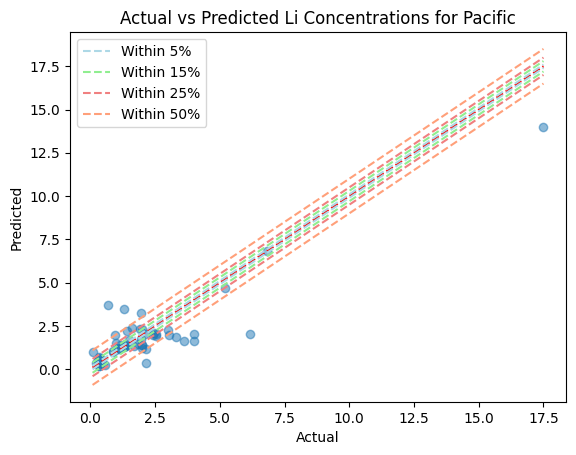

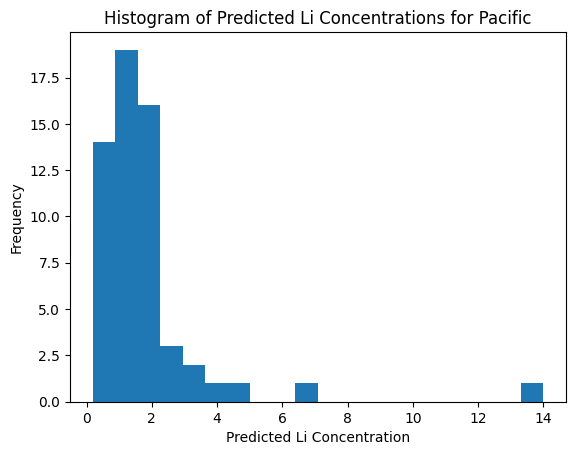

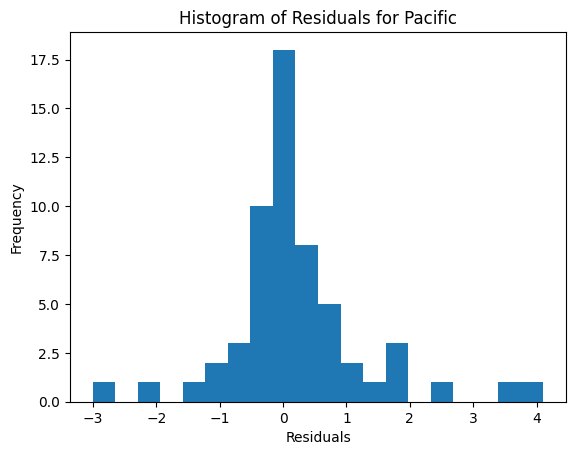

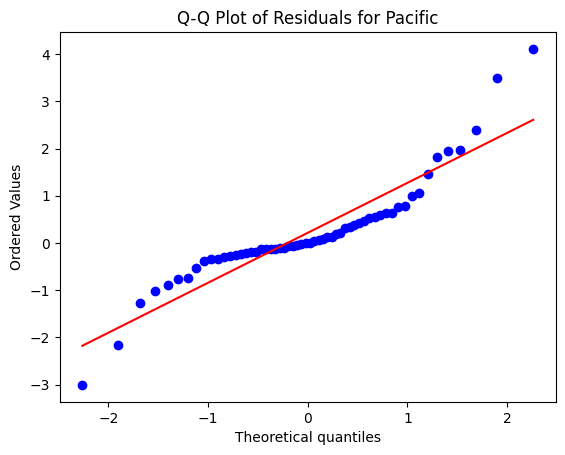

Illinois
Number of data points:  25
Number of samples in the training dataset: 15
Best parameters: {'C': 50, 'epsilon': 0.3, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 114.36396100000002
MSE of the model: 29.21572687816512
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 5.405157433245134
MAE of the best SVR model: 3.5383306784044466
R-squared (Coefficient of Determination): 0.744537294592611
Percentage of predictions within 5% of the correct values: 40.0
Percentage of predictions within 15% of the correct values: 60.0
Percentage of predictions within 25% of the correct values: 70.0
Percentage of predictions within 50% of the correct values: 80.0
-------------------------------


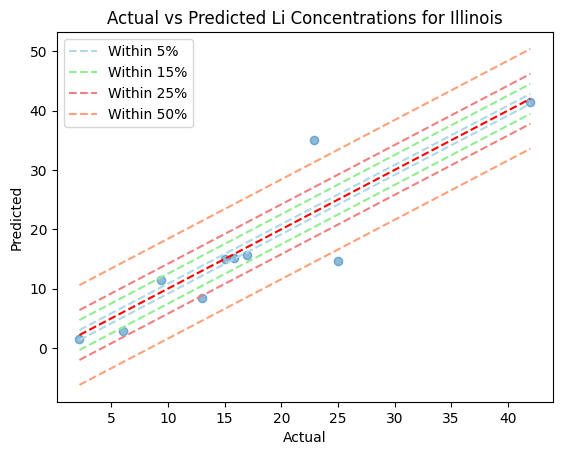

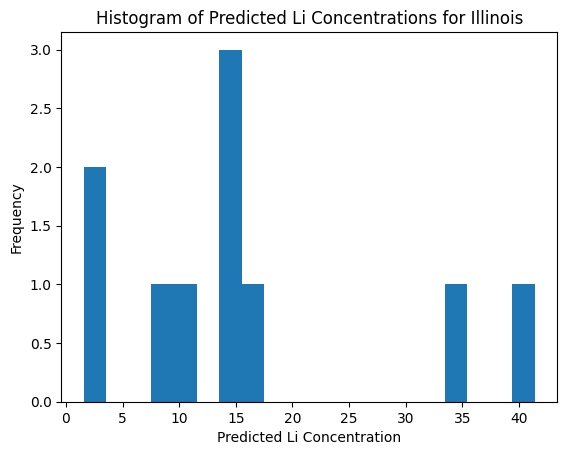

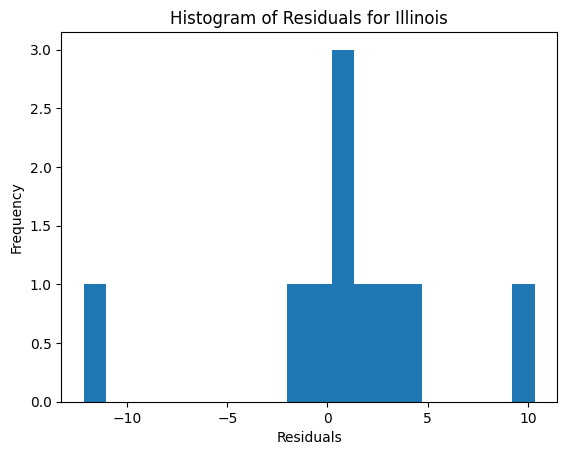

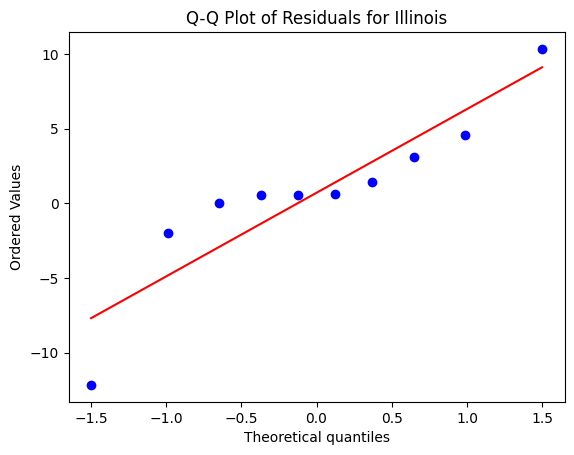

Great Plains
Number of data points:  62
Number of samples in the training dataset: 37
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 20206.926954559996
MSE of the model: 21136.229015226163
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 145.38304239224794
MAE of the best SVR model: 30.430383892503627
R-squared (Coefficient of Determination): -0.045989281930692405
Percentage of predictions within 5% of the correct values: 68.0
Percentage of predictions within 15% of the correct values: 92.0
Percentage of predictions within 25% of the correct values: 92.0
Percentage of predictions within 50% of the correct values: 96.0
-------------------------------


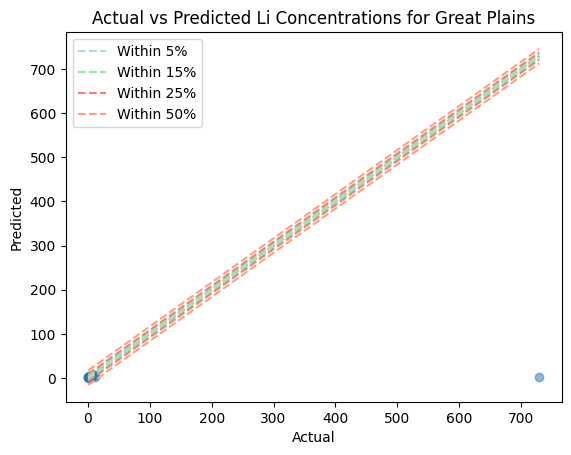

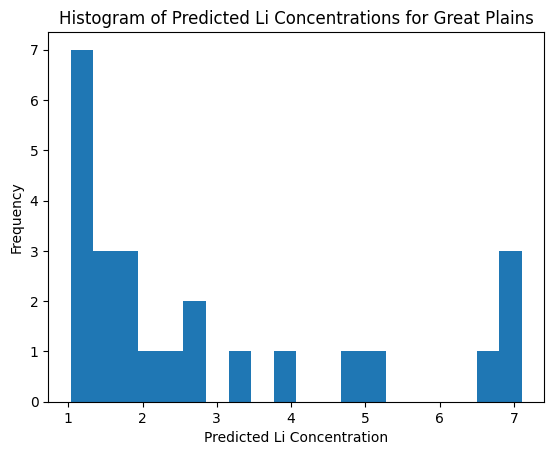

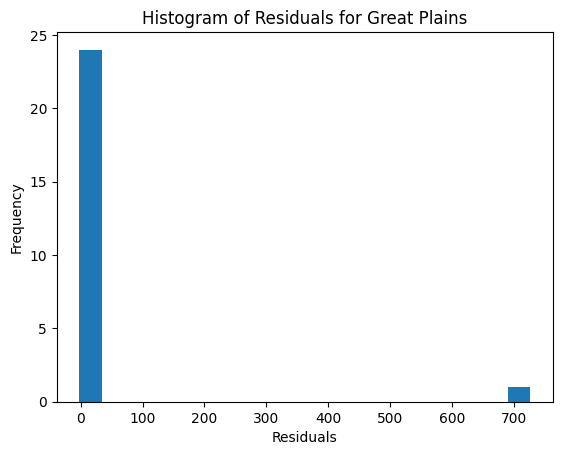

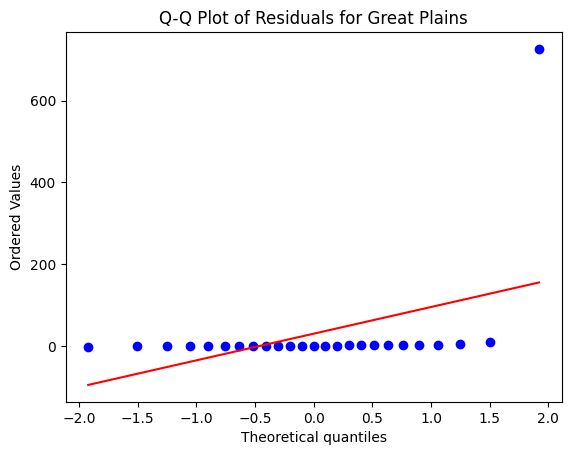

Anadarko
Number of data points:  262
Number of samples in the training dataset: 157
Best parameters: {'C': 200, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 15834.212353868483
MSE of the model: 7262.1315341824275
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 85.21814087494768
MAE of the best SVR model: 18.993493838089407
R-squared (Coefficient of Determination): 0.5413645231044155
Percentage of predictions within 5% of the correct values: 60.952380952380956
Percentage of predictions within 15% of the correct values: 71.42857142857143
Percentage of predictions within 25% of the correct values: 77.14285714285715
Percentage of predictions within 50% of the correct values: 87.61904761904762
-------------------------------


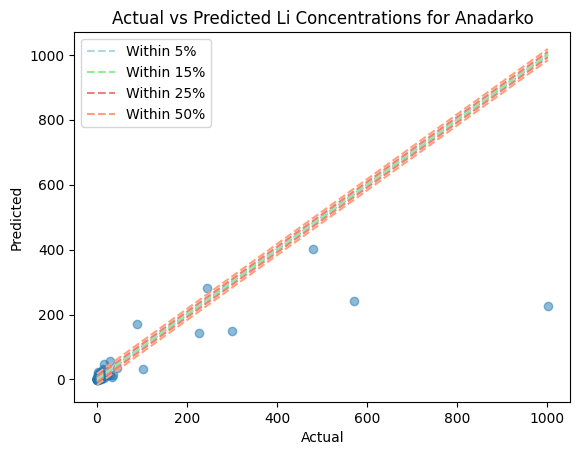

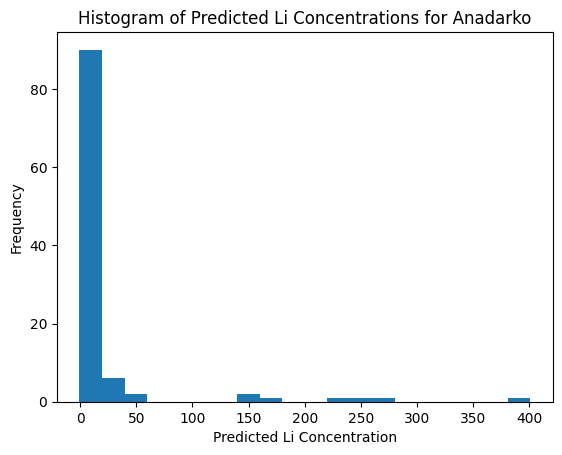

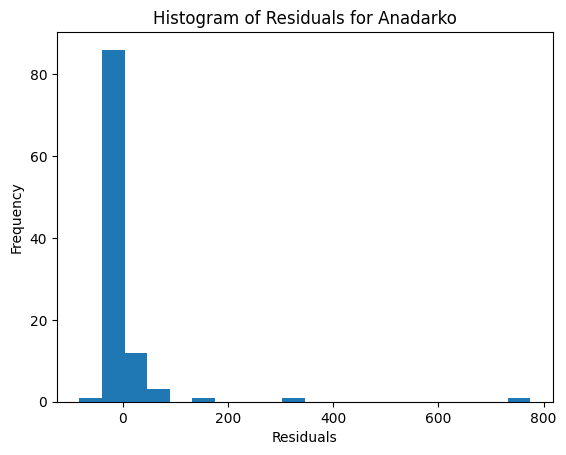

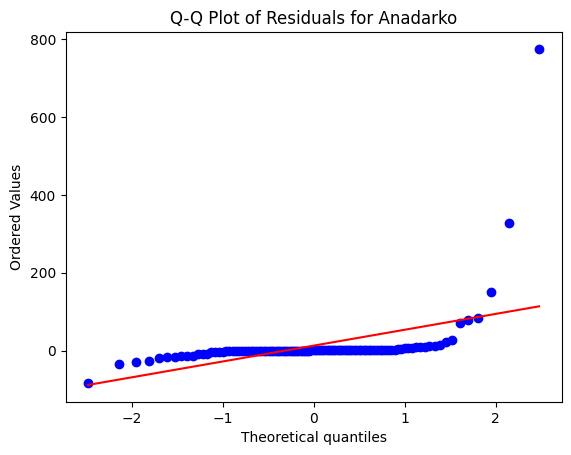

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 415
Best parameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 153.53934524092955
MSE of the model: 39.2069741304829
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 6.261547263295463
MAE of the best SVR model: 3.2364088282217853
R-squared (Coefficient of Determination): 0.7446454257769535
Percentage of predictions within 5% of the correct values: 11.151079136690647
Percentage of predictions within 15% of the correct values: 32.37410071942446
Percentage of predictions within 25% of the correct values: 54.31654676258992
Percentage of predictions within 50% of the correct values: 78.77697841726618
-------------------------------


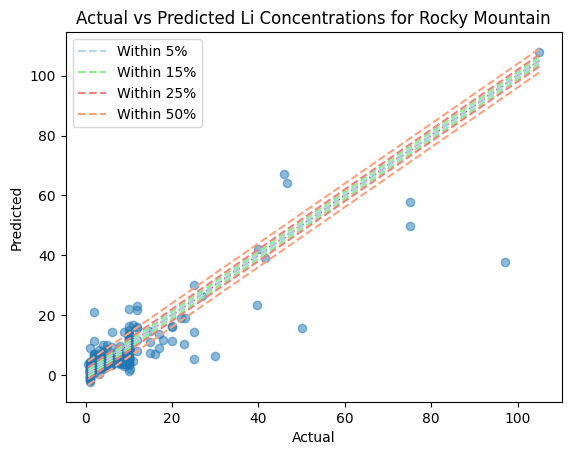

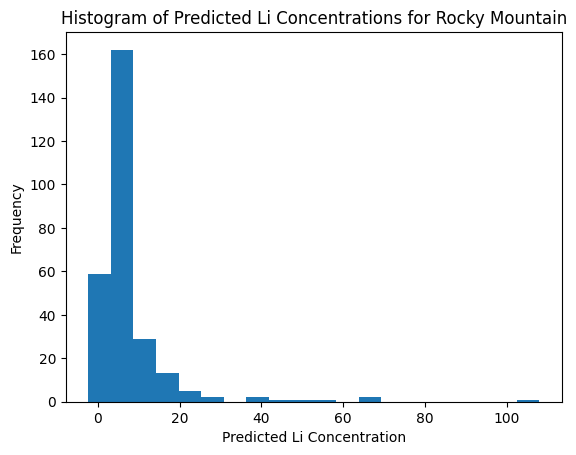

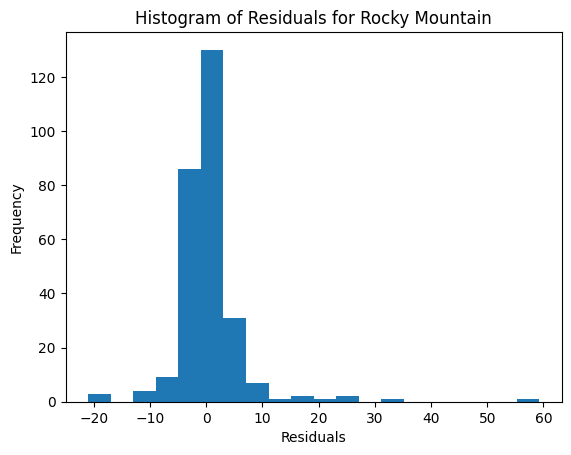

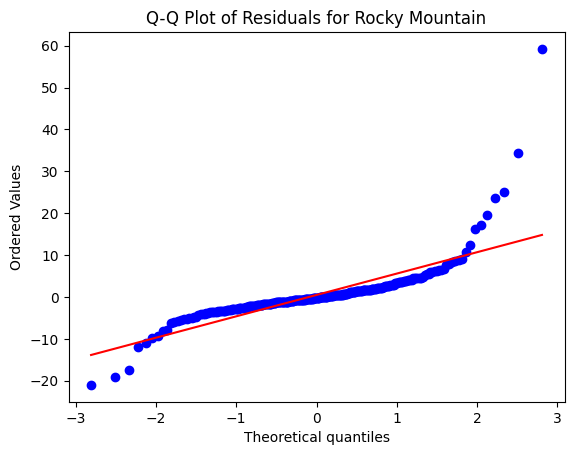

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 10
Best parameters: {'C': 50, 'epsilon': 0.1, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 775.6835918367349
MSE of the model: 128.27319429097136
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 11.325775659572786
MAE of the best SVR model: 9.090136124039978
R-squared (Coefficient of Determination): 0.8346320643611471
Percentage of predictions within 5% of the correct values: 14.285714285714285
Percentage of predictions within 15% of the correct values: 14.285714285714285
Percentage of predictions within 25% of the correct values: 42.857142857142854
Percentage of predictions within 50% of the correct values: 57.14285714285714
-------------------------------


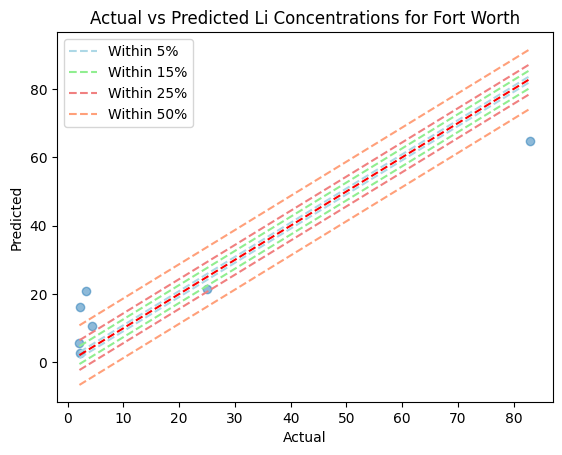

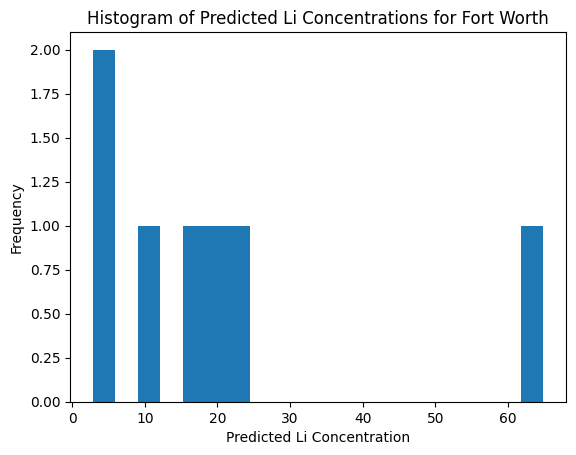

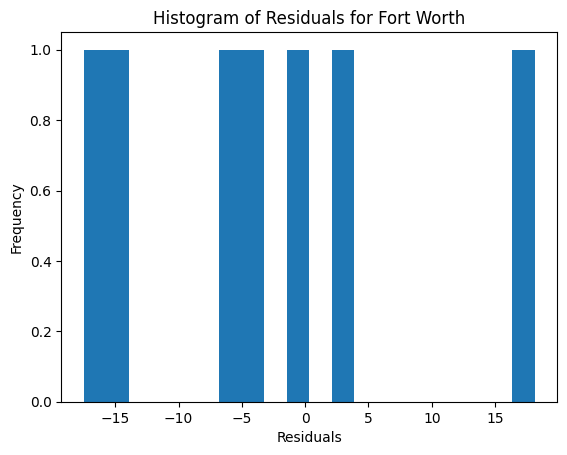

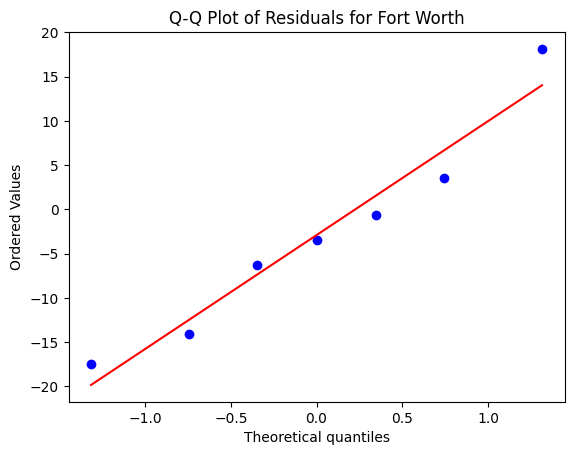

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
8,05_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,20206.93,21136.23,145.38,30.43,-0.05,68.00,92.00,92.00,96.00
9,05_PCA,Anadarko,262,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,15834.21,7262.13,85.22,18.99,0.54,60.95,71.43,77.14,87.62
3,05_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[10, 50, 100, 150, 200]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,15220.20,1378.88,37.13,18.13,0.91,30.34,62.64,69.38,80.62
7,05_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.3,114.36,29.22,5.41,3.54,0.74,40.00,60.00,70.00,80.00
4,05_PCA,Williston,502,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,3119.98,389.38,19.73,10.56,0.88,23.88,53.23,67.66,83.08
1,05_PCA,Permian,481,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,4363.28,4430.89,66.56,13.79,-0.02,17.62,44.04,63.21,86.53
0,05_PCA,Appalachian,652,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,4226.99,1751.69,41.85,22.10,0.59,20.31,43.68,59.00,79.31
6,05_PCA,Pacific,145,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.2,6.18,1.26,1.12,0.70,0.80,15.52,43.10,58.62,79.31
10,05_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",100,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,153.54,39.21,6.26,3.24,0.74,11.15,32.37,54.32,78.78
2,05_PCA,Oklahoma Platform,254,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",100,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,262.25,58.04,7.62,5.74,0.78,13.73,31.37,50.98,81.37


In [57]:
# Define all the variables...
df = df_pca_all_basins.copy()
round = '05_PCA'
basins = df_data['BASIN_CATEGORY'].unique()
test_size = 0.4
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [10, 50, 100, 150, 200]
epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# Run the function...
df_round05_pca = generate_svr_models_by_basin_from_pca(df=df, round=round, basins=basins, test_size=test_size, random_state=random_state, 
                                                       kernel_values=kernel_values, c_values=c_values, epsilon_values=epsilon_values)
df_round05_pca

### ROUND 6 (PCA)

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 1807.094913062406
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 42.509938991515924
MAE of the best SVR model: 25.22528300136867
R-squared (Coefficient of Determination): 0.5415813763651836
Percentage of predictions within 5% of the correct values: 12.883435582822086
Percentage of predictions within 15% of the correct values: 33.74233128834356
Percentage of predictions within 25% of the correct values: 49.079754601226995
Percentage of predictions within 50% of the correct values: 78.52760736196319
-------------------------------


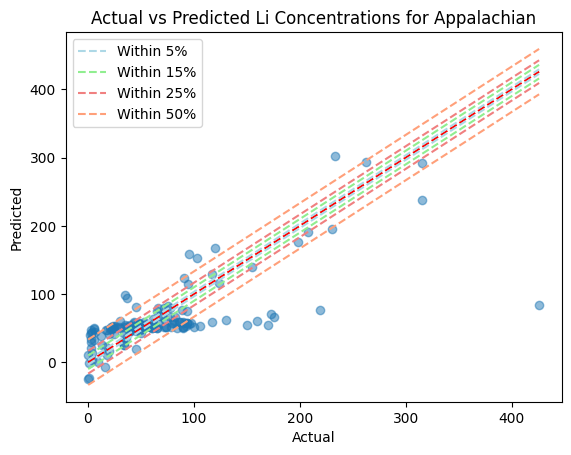

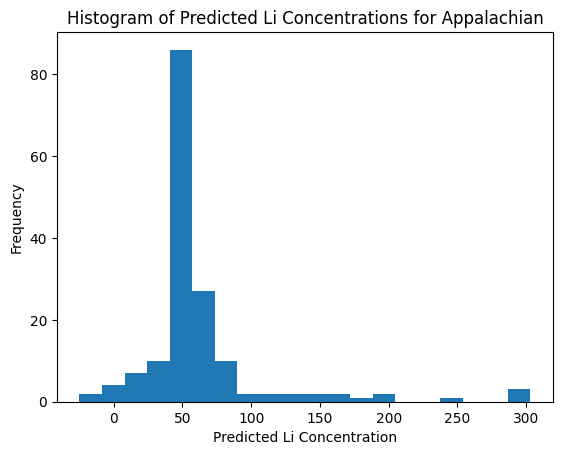

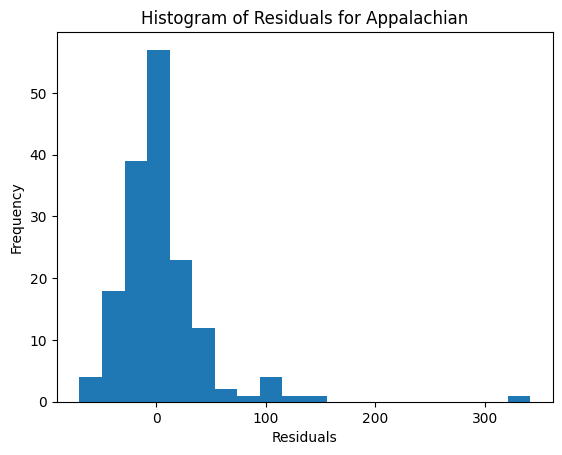

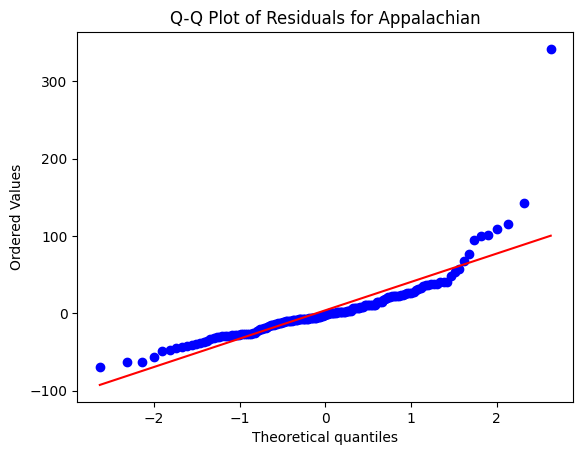

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 200, 'epsilon': 0.4, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531727
MSE of the model: 3783.9400218593814
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 61.51373848059782
MAE of the best SVR model: 13.3568753142193
R-squared (Coefficient of Determination): 0.078447834219176
Percentage of predictions within 5% of the correct values: 15.702479338842975
Percentage of predictions within 15% of the correct values: 42.14876033057851
Percentage of predictions within 25% of the correct values: 64.46280991735537
Percentage of predictions within 50% of the correct values: 86.77685950413223
-------------------------------


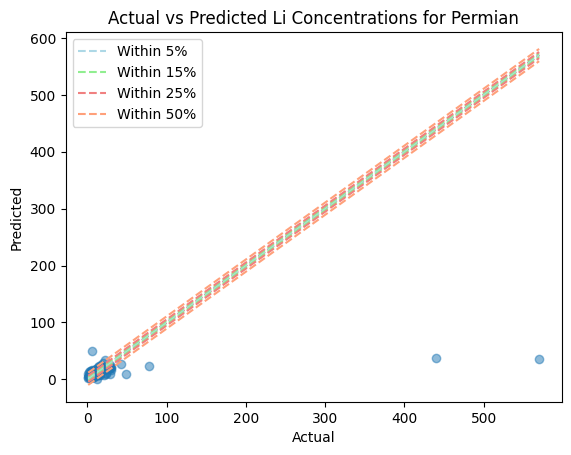

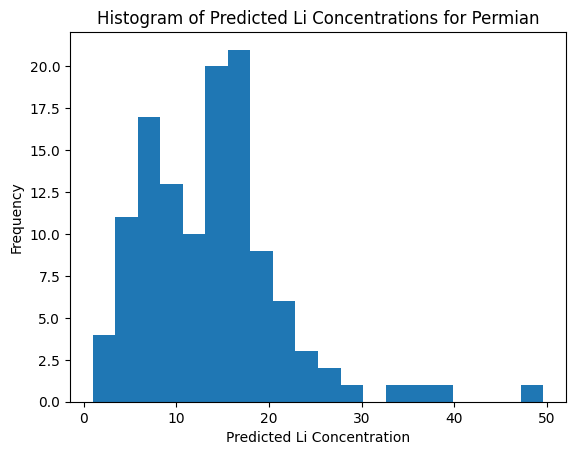

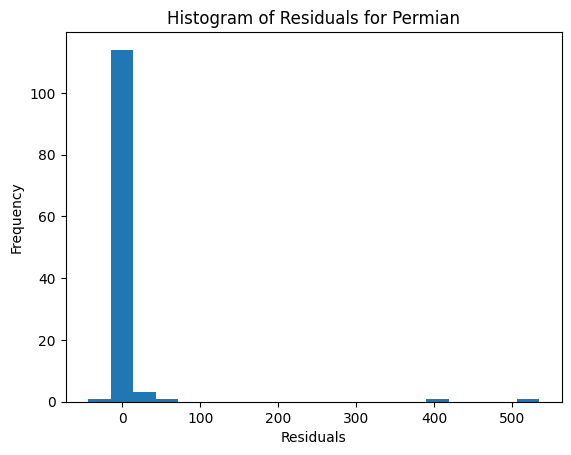

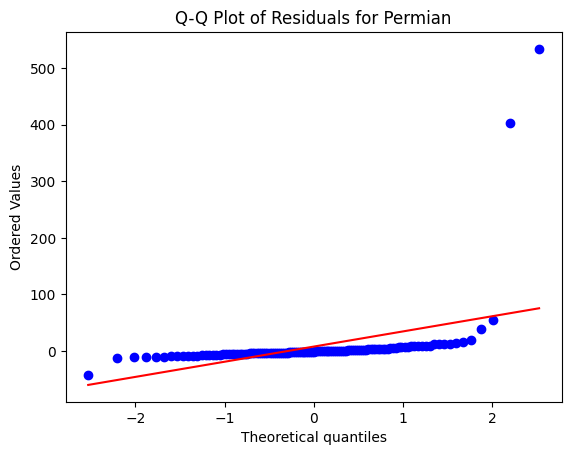

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.398918359375
MSE of the model: 62.325553927294195
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.894653502674718
MAE of the best SVR model: 6.072047993914727
R-squared (Coefficient of Determination): 0.7979060553815993
Percentage of predictions within 5% of the correct values: 14.0625
Percentage of predictions within 15% of the correct values: 34.375
Percentage of predictions within 25% of the correct values: 54.6875
Percentage of predictions within 50% of the correct values: 84.375
-------------------------------


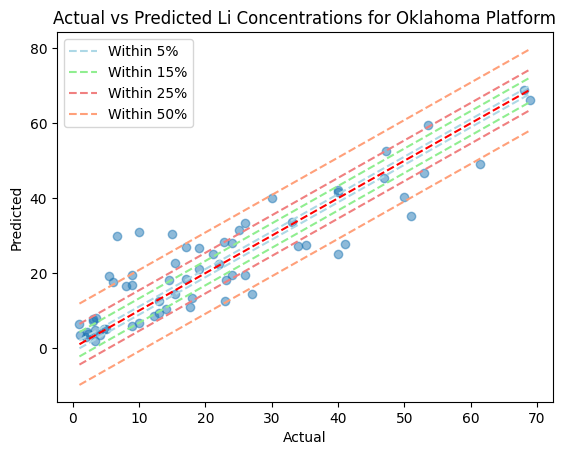

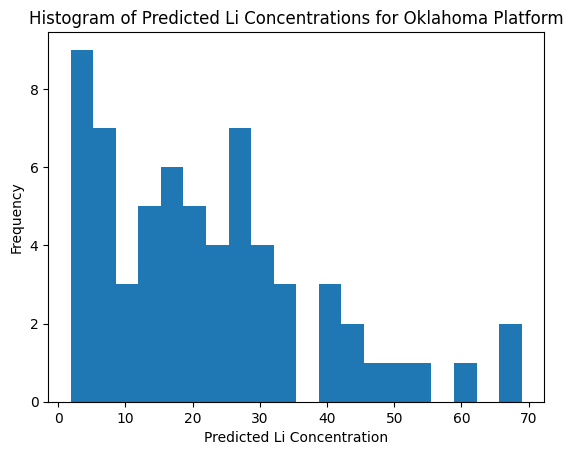

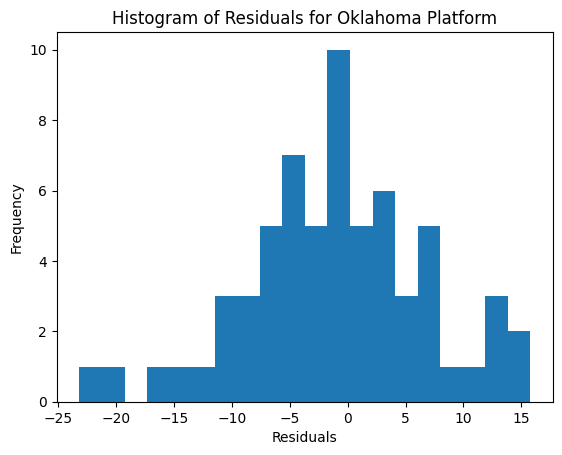

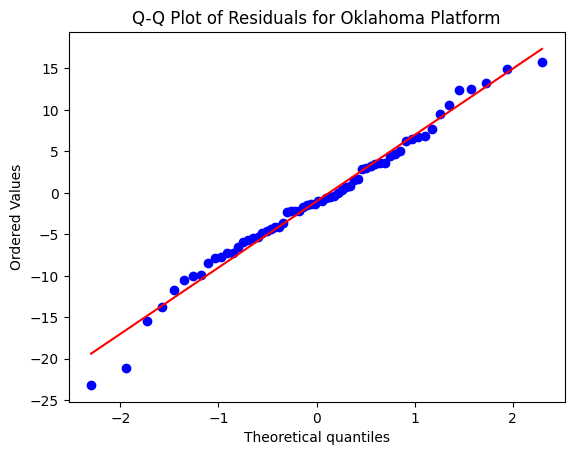

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.615187723528
MSE of the model: 1480.5136800658138
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 38.477443782894596
MAE of the best SVR model: 17.58046125064756
R-squared (Coefficient of Determination): 0.9233435239505609
Percentage of predictions within 5% of the correct values: 36.486486486486484
Percentage of predictions within 15% of the correct values: 65.76576576576578
Percentage of predictions within 25% of the correct values: 71.17117117117117
Percentage of predictions within 50% of the correct values: 82.43243243243244
-------------------------------


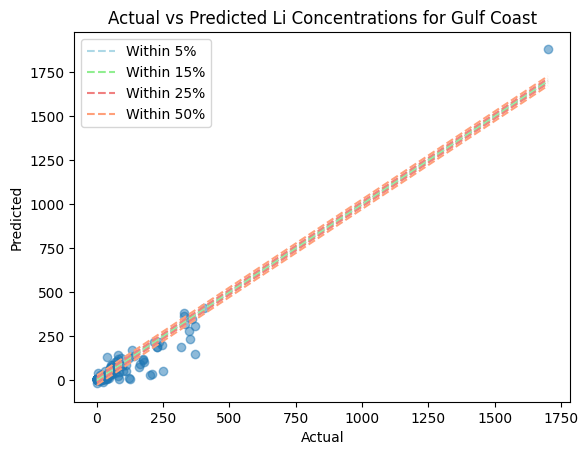

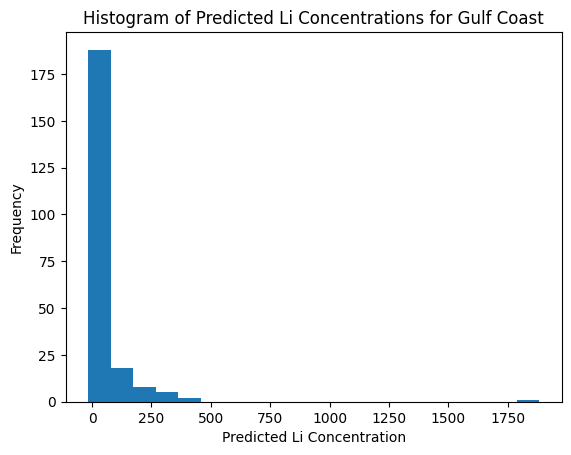

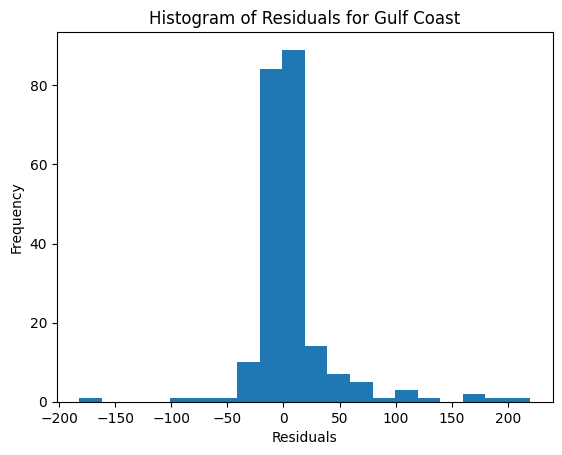

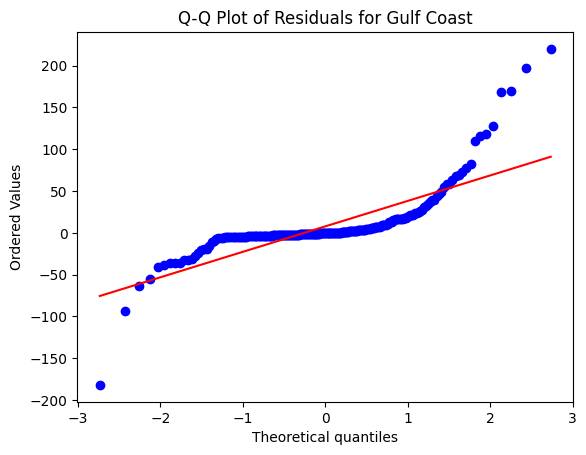

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 200, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274207
MSE of the model: 263.4101154834236
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 16.229914216761085
MAE of the best SVR model: 9.289647203556958
R-squared (Coefficient of Determination): 0.8691745138399182
Percentage of predictions within 5% of the correct values: 17.46031746031746
Percentage of predictions within 15% of the correct values: 50.0
Percentage of predictions within 25% of the correct values: 66.66666666666666
Percentage of predictions within 50% of the correct values: 84.12698412698413
-------------------------------


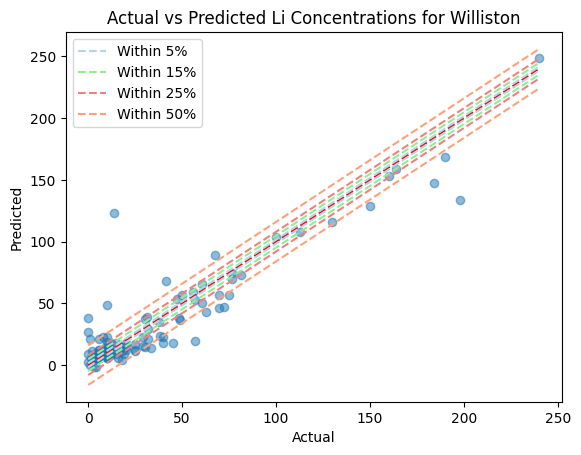

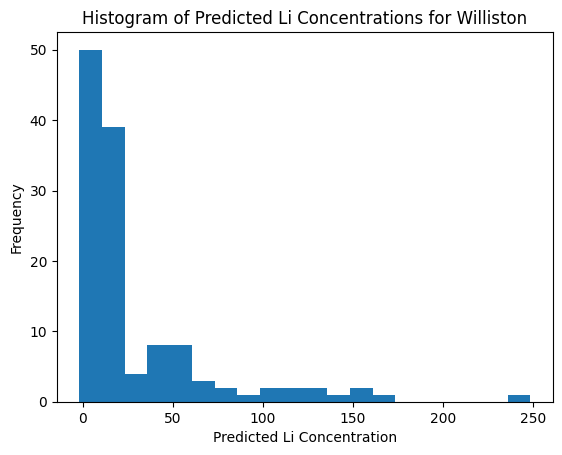

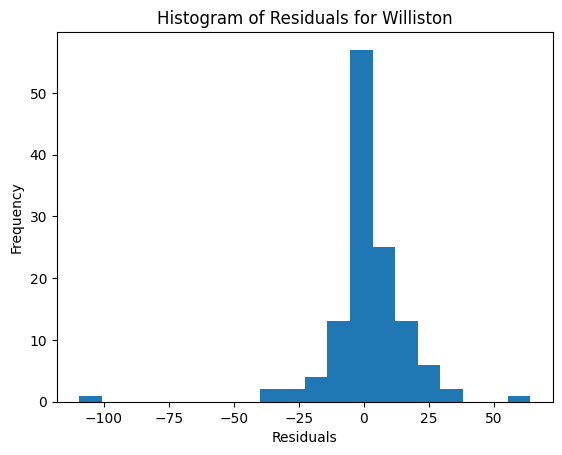

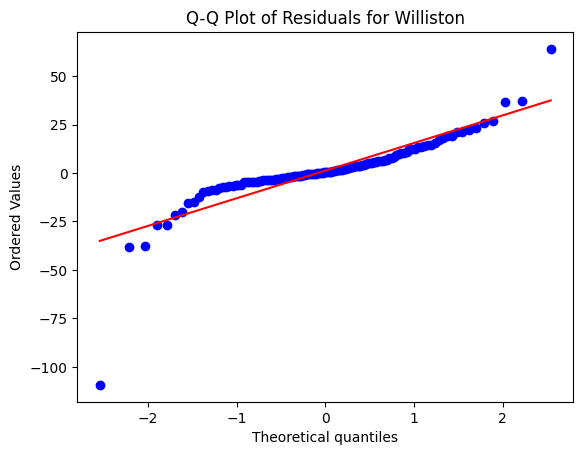

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 50, 'epsilon': 0.4, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 86.08760265011297
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.27834051164932
MAE of the best SVR model: 5.8552505148789615
R-squared (Coefficient of Determination): 0.7454347867310367
Percentage of predictions within 5% of the correct values: 28.947368421052634
Percentage of predictions within 15% of the correct values: 50.0
Percentage of predictions within 25% of the correct values: 76.31578947368422
Percentage of predictions within 50% of the correct values: 86.8421052631579
-------------------------------


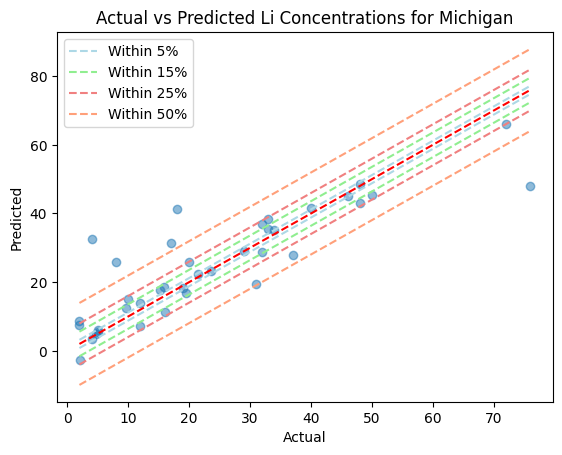

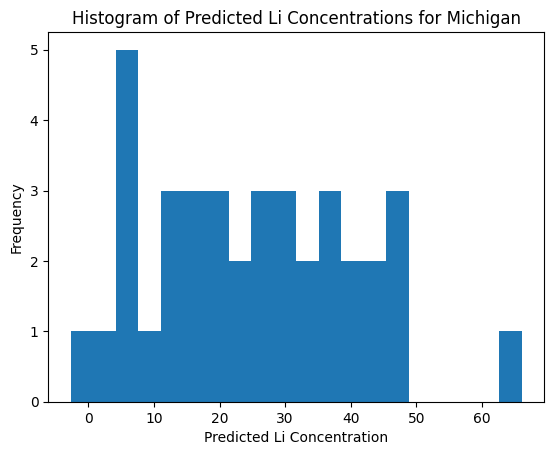

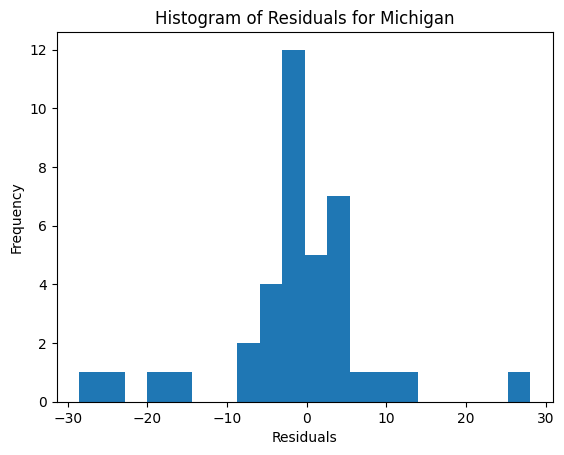

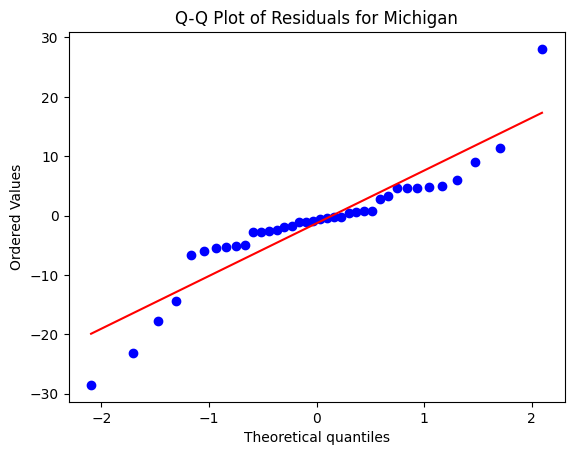

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 150, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 0.79930825910768
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 0.8940404124577814
MAE of the best SVR model: 0.6077537073329051
R-squared (Coefficient of Determination): 0.9046567978088808
Percentage of predictions within 5% of the correct values: 16.216216216216218
Percentage of predictions within 15% of the correct values: 43.24324324324324
Percentage of predictions within 25% of the correct values: 62.16216216216216
Percentage of predictions within 50% of the correct values: 86.48648648648648
-------------------------------


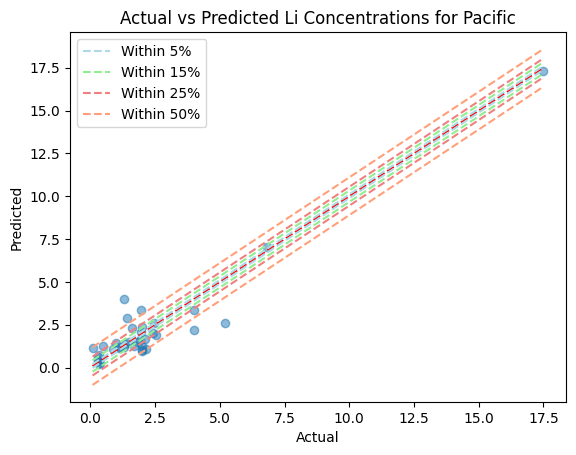

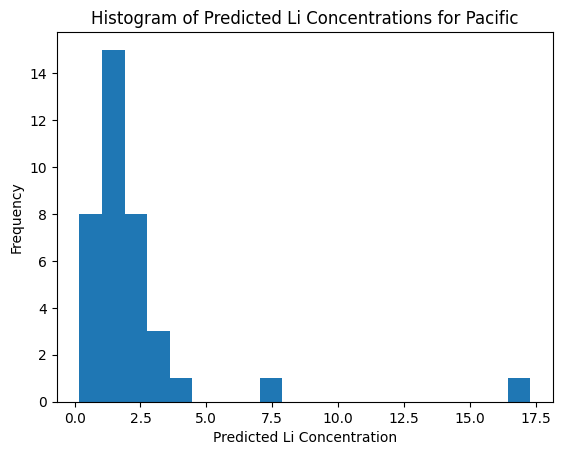

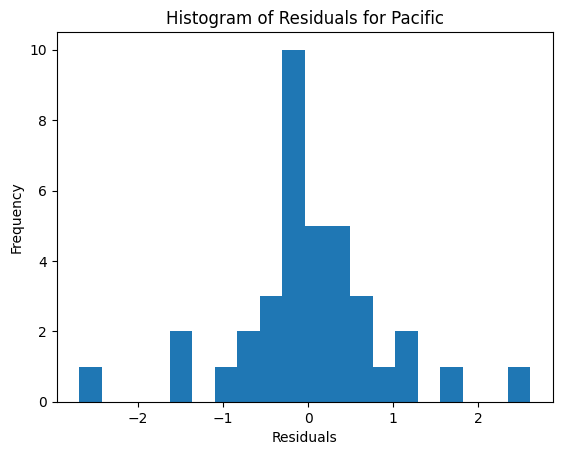

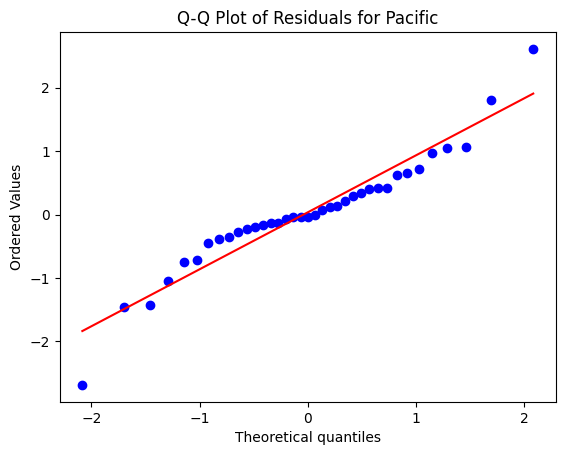

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 67.97607483650754
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.24476044749073
MAE of the best SVR model: 5.270459036437231
R-squared (Coefficient of Determination): 0.5639550458262488
Percentage of predictions within 5% of the correct values: 28.57142857142857
Percentage of predictions within 15% of the correct values: 57.14285714285714
Percentage of predictions within 25% of the correct values: 71.42857142857143
Percentage of predictions within 50% of the correct values: 71.42857142857143
-------------------------------


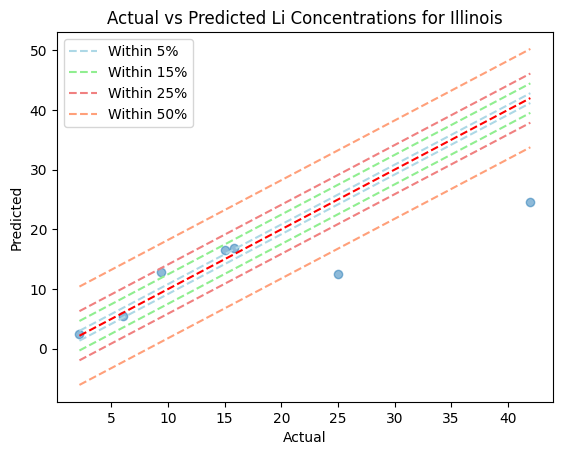

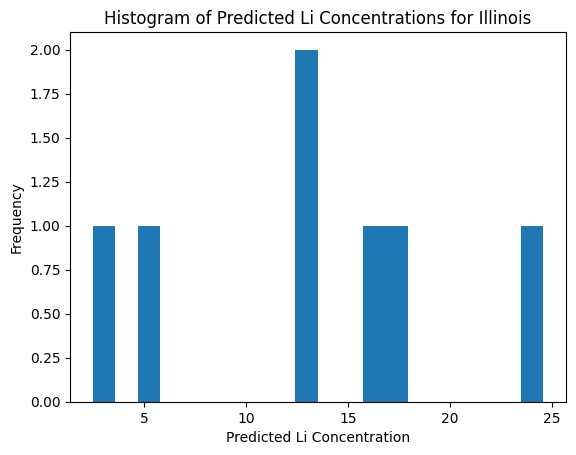

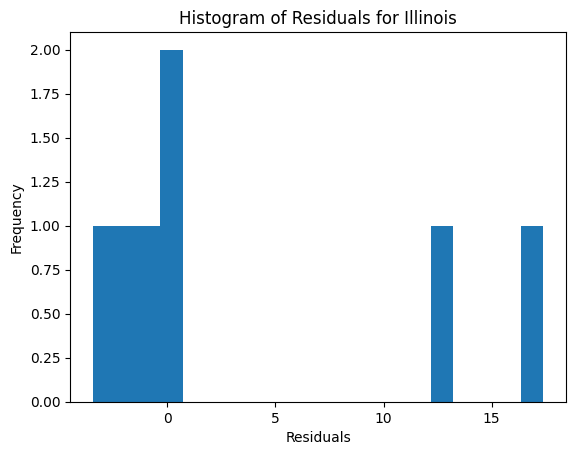

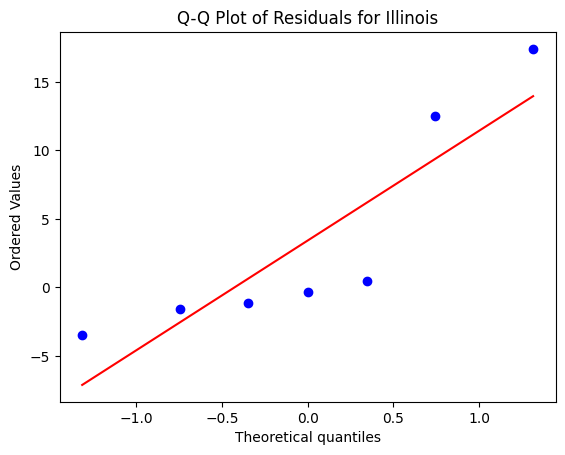

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32997.49029340695
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 181.652113374458
MAE of the best SVR model: 46.96613185060866
R-squared (Coefficient of Determination): -0.07256544349350302
Percentage of predictions within 5% of the correct values: 68.75
Percentage of predictions within 15% of the correct values: 87.5
Percentage of predictions within 25% of the correct values: 93.75
Percentage of predictions within 50% of the correct values: 93.75
-------------------------------


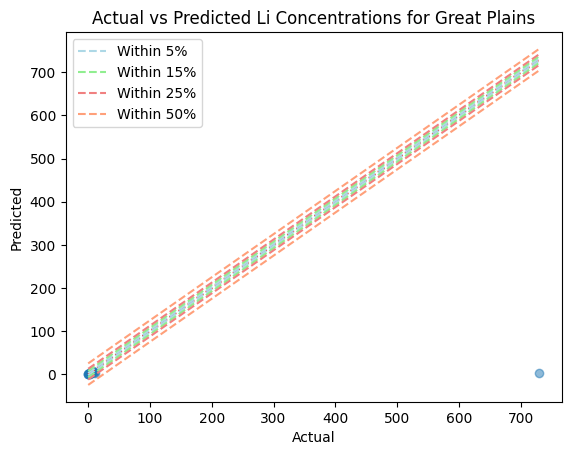

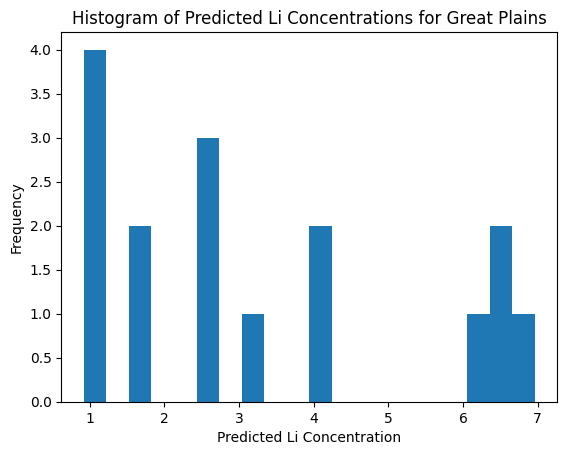

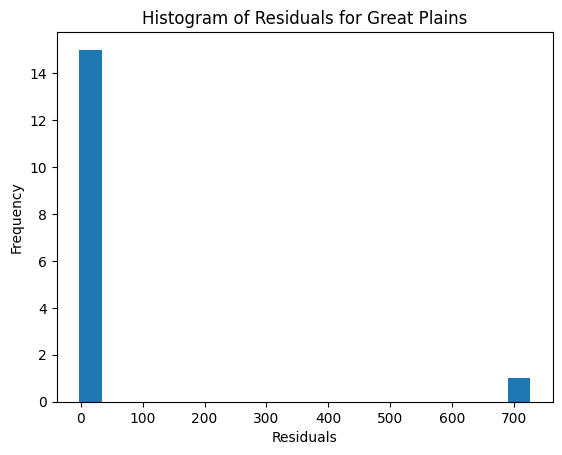

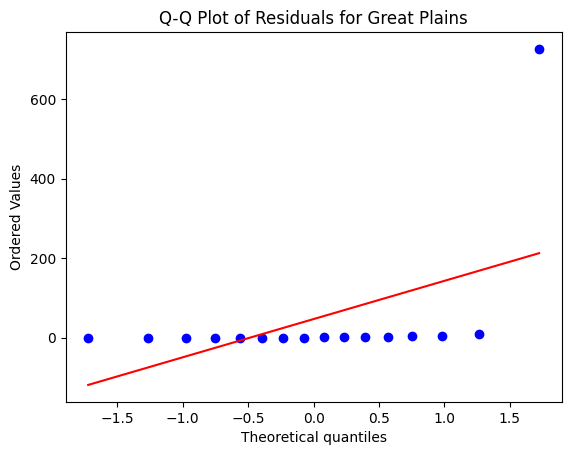

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310375
MSE of the model: 3576.132798126688
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 59.80077589903569
MAE of the best SVR model: 17.525491470031966
R-squared (Coefficient of Determination): 0.5579974704818789
Percentage of predictions within 5% of the correct values: 21.21212121212121
Percentage of predictions within 15% of the correct values: 59.09090909090909
Percentage of predictions within 25% of the correct values: 68.18181818181817
Percentage of predictions within 50% of the correct values: 78.78787878787878
-------------------------------


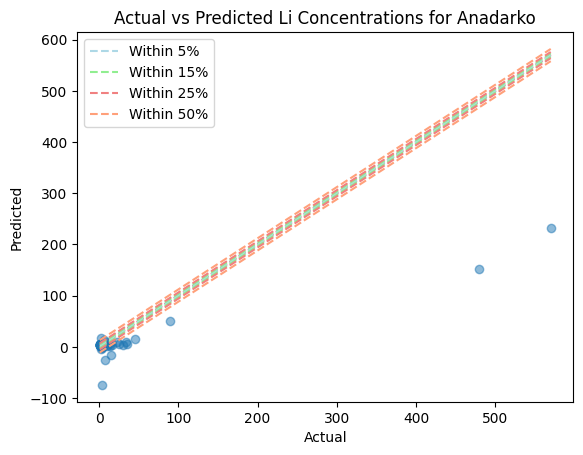

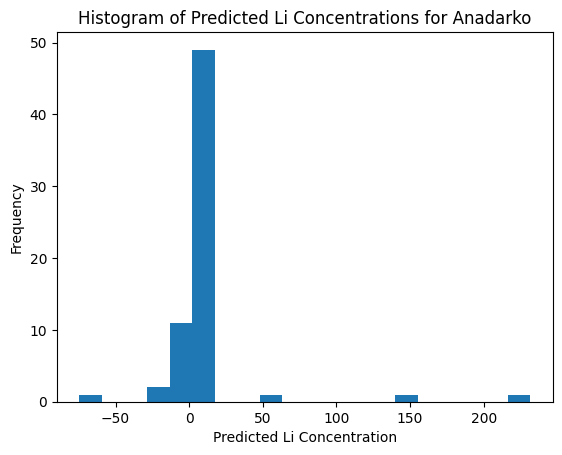

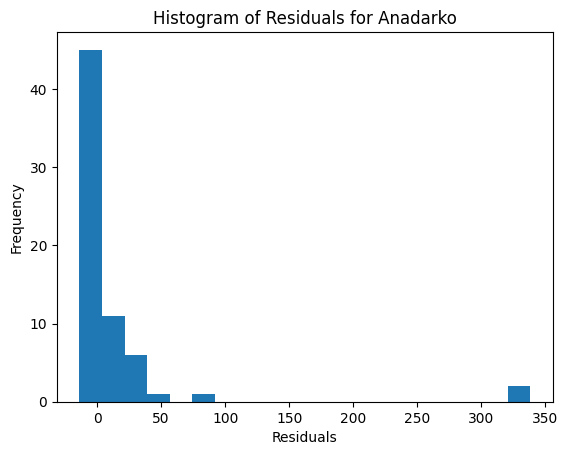

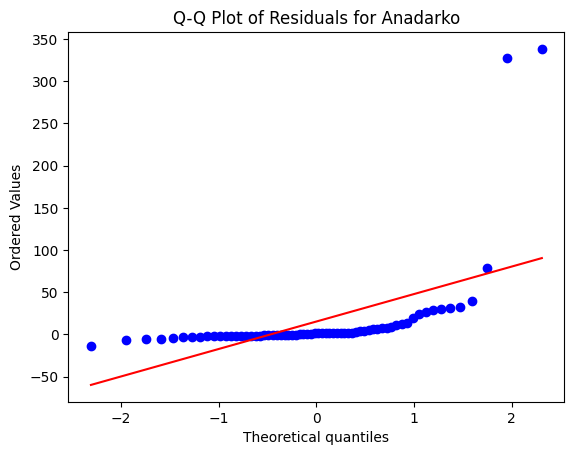

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 150, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134763
MSE of the model: 60.910501449805814
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.804518015214381
MAE of the best SVR model: 3.604979378757377
R-squared (Coefficient of Determination): 0.6530749899948569
Percentage of predictions within 5% of the correct values: 18.39080459770115
Percentage of predictions within 15% of the correct values: 40.229885057471265
Percentage of predictions within 25% of the correct values: 55.172413793103445
Percentage of predictions within 50% of the correct values: 75.86206896551724
-------------------------------


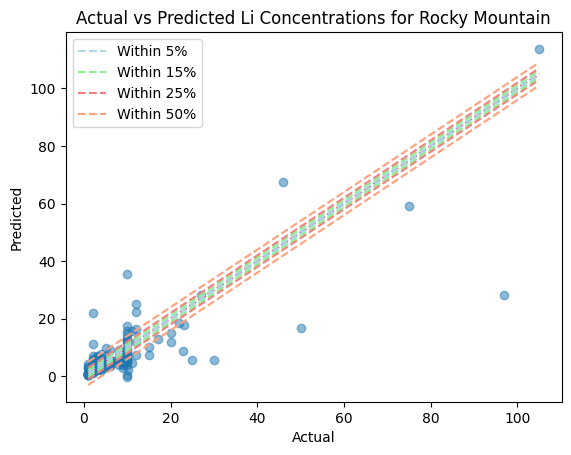

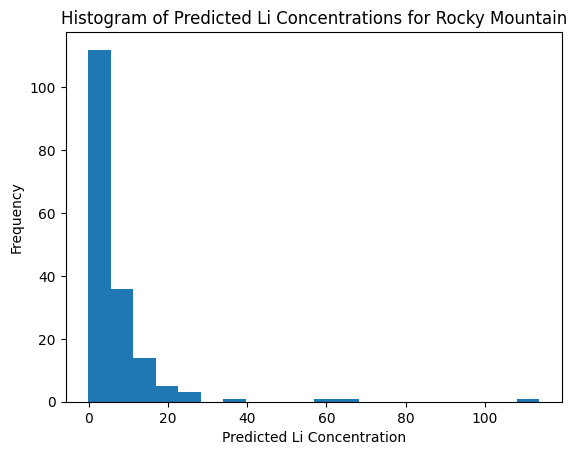

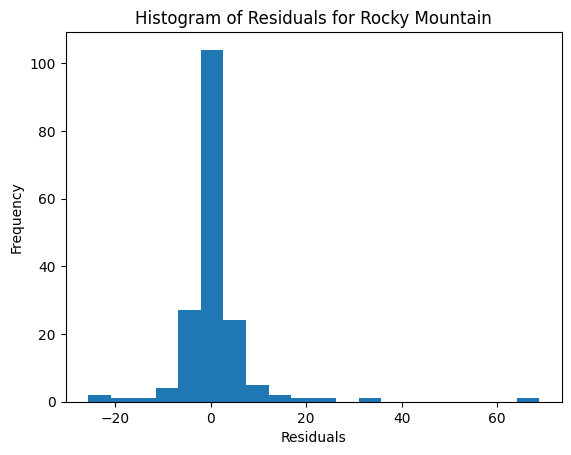

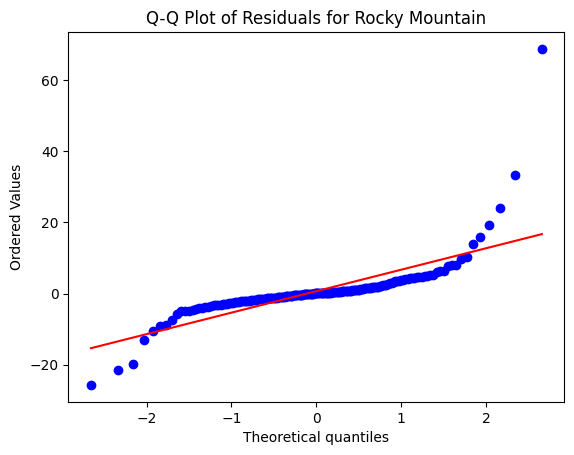

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 10, 'epsilon': 0.2, 'kernel': 'sigmoid'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 444.1185069188784
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 21.07411936283171
MAE of the best SVR model: 15.530730359981225
R-squared (Coefficient of Determination): 0.5724812690306461
Percentage of predictions within 5% of the correct values: 0.0
Percentage of predictions within 15% of the correct values: 40.0
Percentage of predictions within 25% of the correct values: 40.0
Percentage of predictions within 50% of the correct values: 40.0
-------------------------------


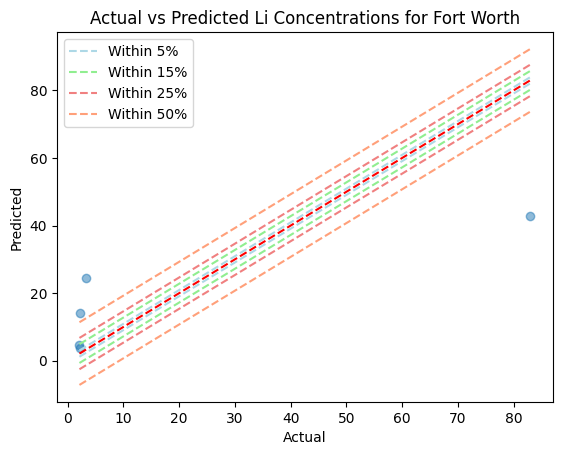

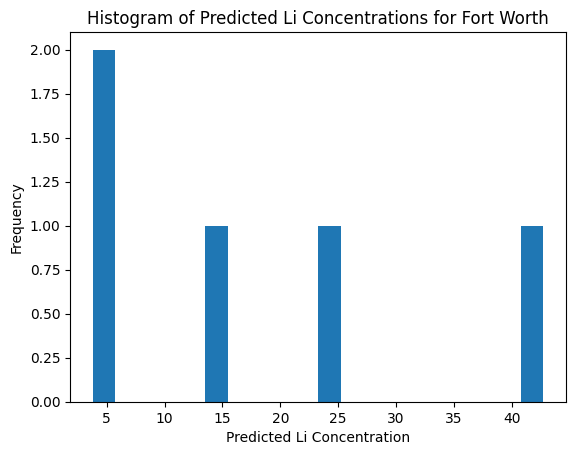

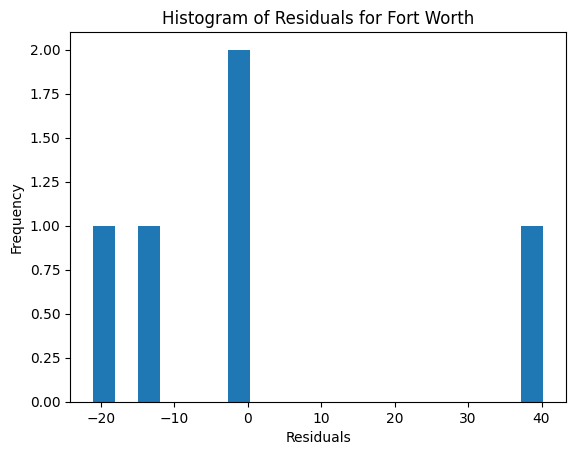

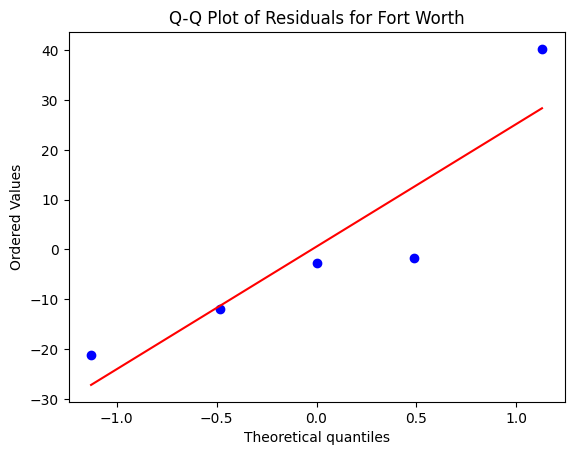

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
8,06_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,30765.01,32997.49,181.65,46.97,-0.07,68.75,87.50,93.75,93.75
3,06_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,19313.62,1480.51,38.48,17.58,0.92,36.49,65.77,71.17,82.43
9,06_PCA,Anadarko,262,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[10, 50, 100, 150, 200]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,8090.75,3576.13,59.80,17.53,0.56,21.21,59.09,68.18,78.79
7,06_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,155.89,67.98,8.24,5.27,0.56,28.57,57.14,71.43,71.43
4,06_PCA,Williston,502,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,2013.45,263.41,16.23,9.29,0.87,17.46,50.00,66.67,84.13
5,06_PCA,Michigan,150,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.4,338.18,86.09,9.28,5.86,0.75,28.95,50.00,76.32,86.84
6,06_PCA,Pacific,145,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,8.38,0.80,0.89,0.61,0.90,16.22,43.24,62.16,86.49
1,06_PCA,Permian,481,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.4,4106.05,3783.94,61.51,13.36,0.08,15.70,42.15,64.46,86.78
10,06_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",150,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,175.57,60.91,7.80,3.60,0.65,18.39,40.23,55.17,75.86
11,06_PCA,Fort Worth,17,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",sigmoid,"[10, 50, 100, 150, 200]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.2,1038.83,444.12,21.07,15.53,0.57,0.00,40.00,40.00,40.00


In [58]:
# Define all the variables...
df = df_pca_all_basins.copy()
round = '06_PCA'
basins = df_data['BASIN_CATEGORY'].unique()
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly', 'sigmoid']
c_values = [10, 50, 100, 150, 200]
epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# Run the function...
df_round06_pca = generate_svr_models_by_basin_from_pca(df=df, round=round, basins=basins, test_size=test_size, random_state=random_state, 
                                                       kernel_values=kernel_values, c_values=c_values, epsilon_values=epsilon_values)
df_round06_pca

#### ROUND 7 (PCA)

Appalachian
Number of data points:  652
Number of samples in the training dataset: 489
Best parameters: {'C': 10, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 3942.0189754375397
MSE of the model: 1807.094913062406
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 42.509938991515924
MAE of the best SVR model: 25.22528300136867
R-squared (Coefficient of Determination): 0.5415813763651836
Percentage of predictions within 5% of the correct values: 12.883435582822086
Percentage of predictions within 15% of the correct values: 33.74233128834356
Percentage of predictions within 25% of the correct values: 49.079754601226995
Percentage of predictions within 50% of the correct values: 78.52760736196319
-------------------------------


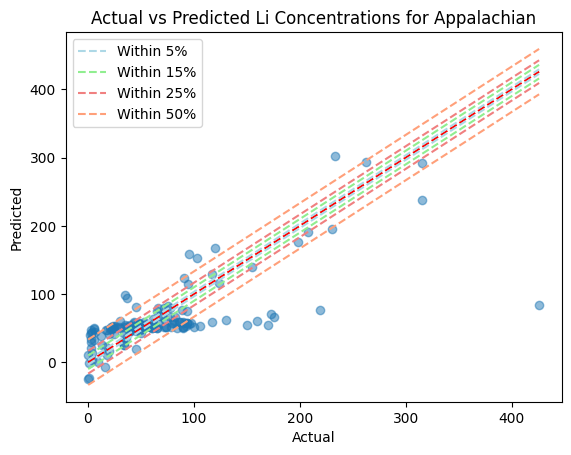

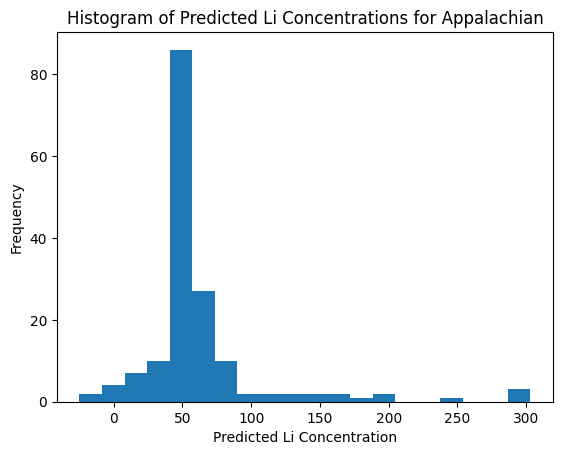

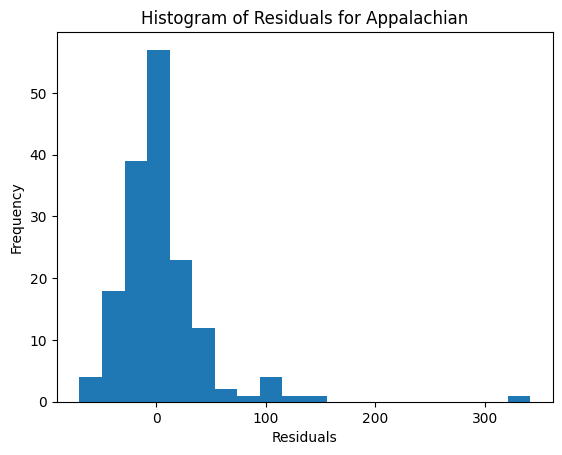

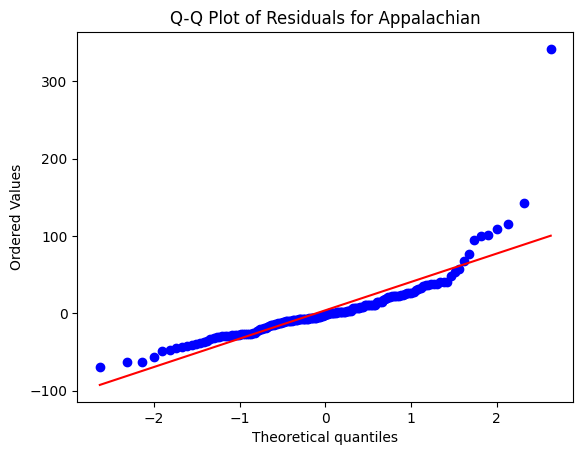

Permian
Number of data points:  481
Number of samples in the training dataset: 360
Best parameters: {'C': 50, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 4106.050815531727
MSE of the model: 4023.9898550946536
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 63.43492614557578
MAE of the best SVR model: 13.472919208652822
R-squared (Coefficient of Determination): 0.019985373811416518
Percentage of predictions within 5% of the correct values: 16.528925619834713
Percentage of predictions within 15% of the correct values: 41.32231404958678
Percentage of predictions within 25% of the correct values: 64.46280991735537
Percentage of predictions within 50% of the correct values: 89.25619834710744
-------------------------------


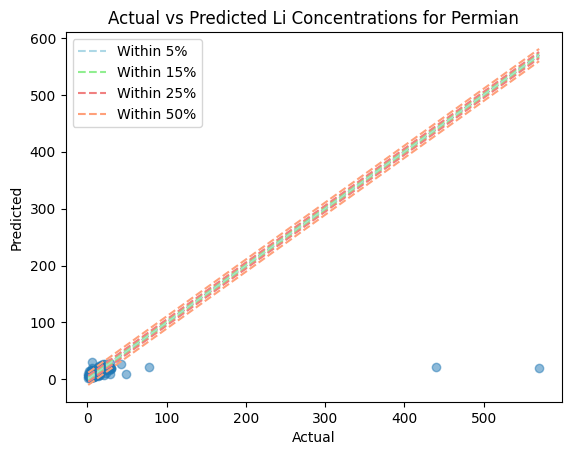

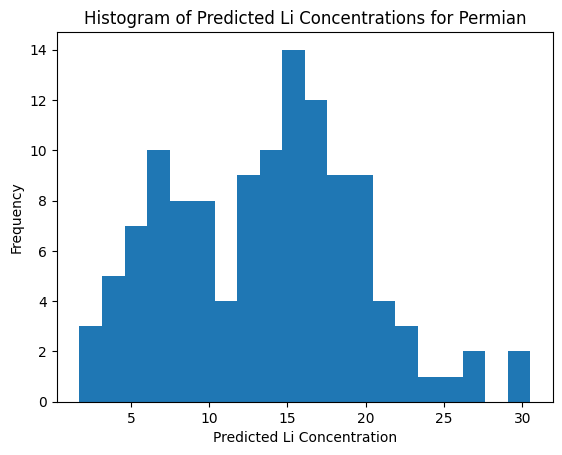

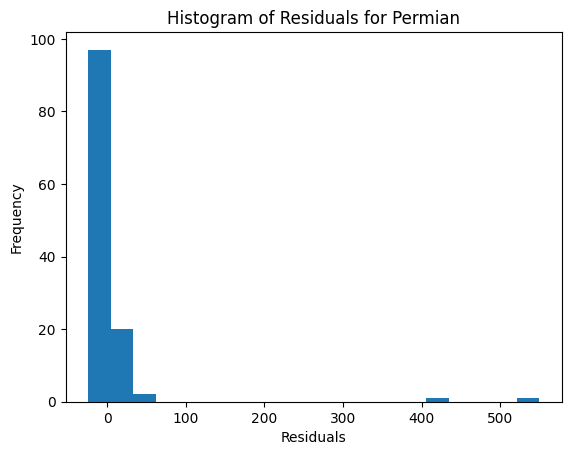

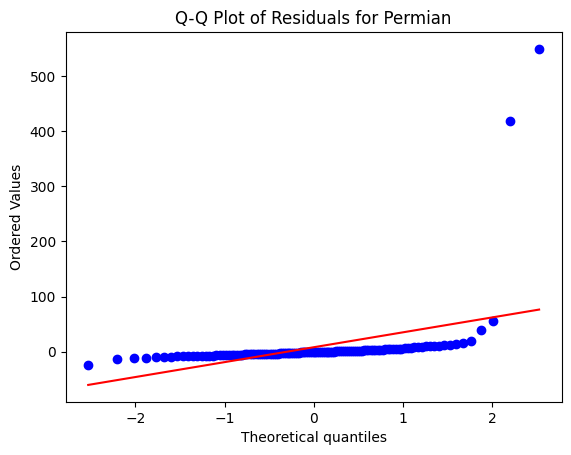

Oklahoma Platform
Number of data points:  254
Number of samples in the training dataset: 190
Best parameters: {'C': 40, 'epsilon': 0.5, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 308.398918359375
MSE of the model: 64.1026422415625
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.006412570031756
MAE of the best SVR model: 6.165507427546924
R-squared (Coefficient of Determination): 0.7921437514029664
Percentage of predictions within 5% of the correct values: 12.5
Percentage of predictions within 15% of the correct values: 31.25
Percentage of predictions within 25% of the correct values: 53.125
Percentage of predictions within 50% of the correct values: 84.375
-------------------------------


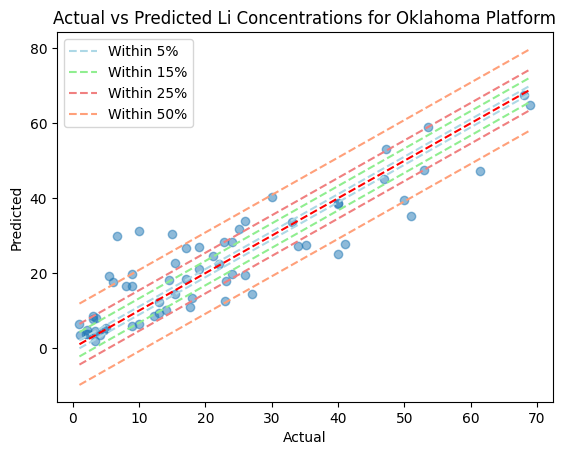

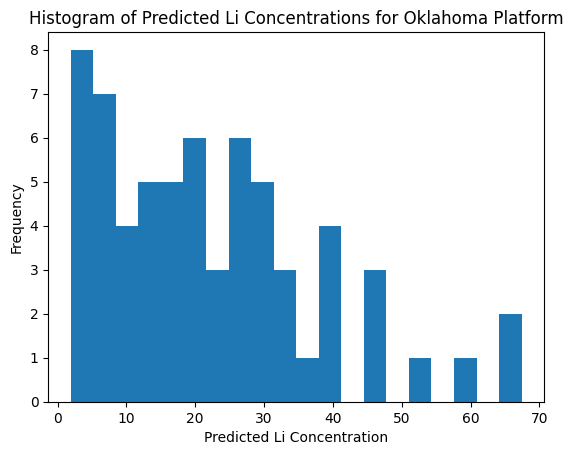

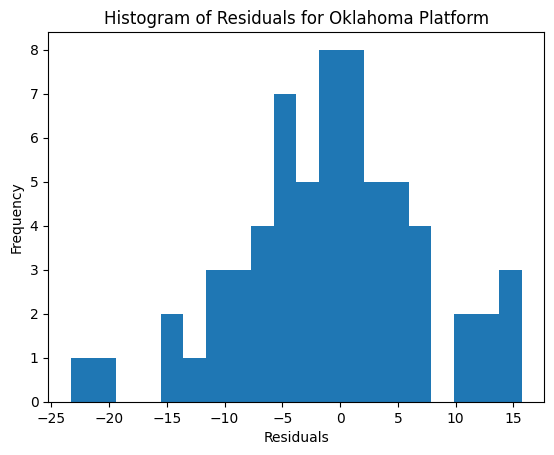

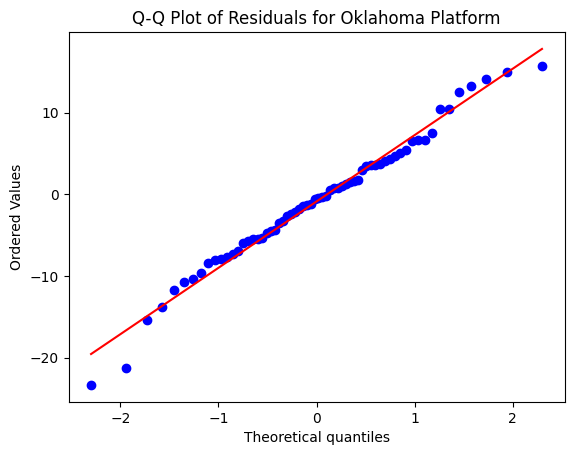

Gulf Coast
Number of data points:  888
Number of samples in the training dataset: 666
Best parameters: {'C': 40, 'epsilon': 0.5, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 19313.615187723528
MSE of the model: 1477.5699845090207
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 38.43917252633075
MAE of the best SVR model: 17.566794730358623
R-squared (Coefficient of Determination): 0.9234959395148237
Percentage of predictions within 5% of the correct values: 35.585585585585584
Percentage of predictions within 15% of the correct values: 65.76576576576578
Percentage of predictions within 25% of the correct values: 71.17117117117117
Percentage of predictions within 50% of the correct values: 82.43243243243244
-------------------------------


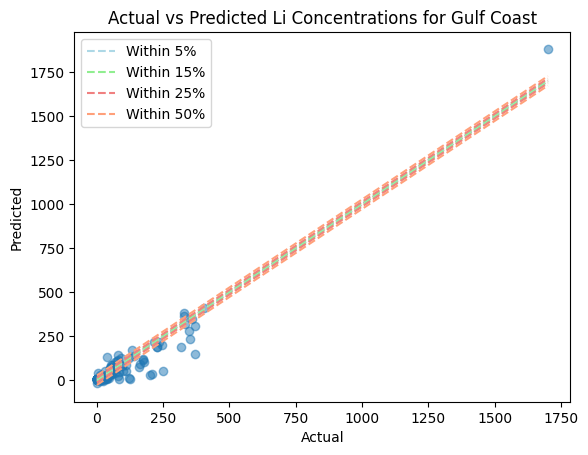

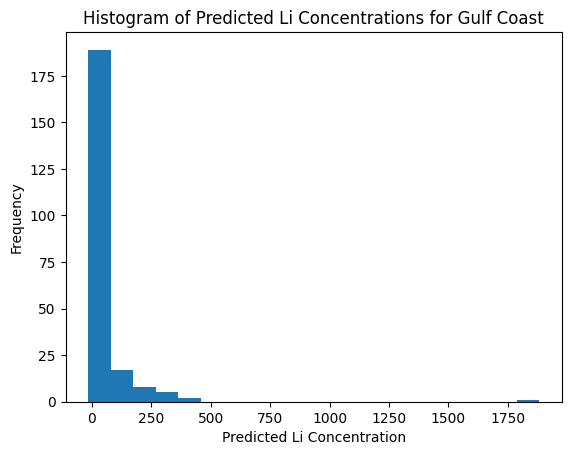

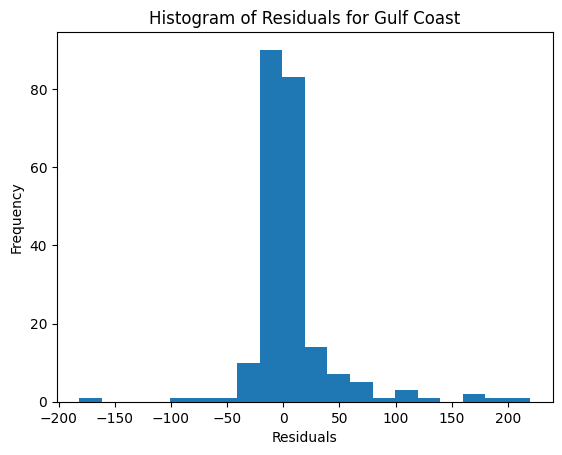

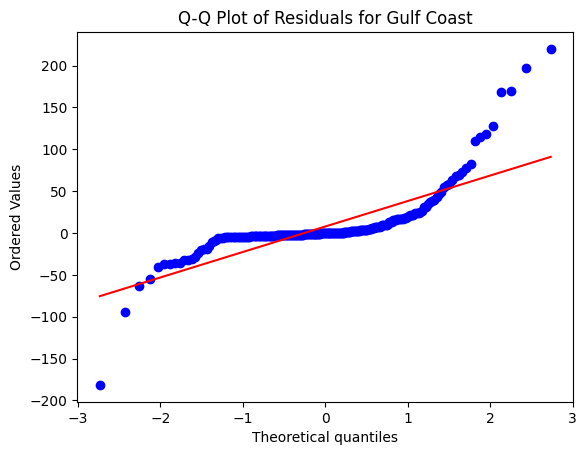

Williston
Number of data points:  502
Number of samples in the training dataset: 376
Best parameters: {'C': 50, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 2013.4464867274207
MSE of the model: 224.09875218498397
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 14.969928262519629
MAE of the best SVR model: 9.338999208054675
R-squared (Coefficient of Determination): 0.88869892810053
Percentage of predictions within 5% of the correct values: 17.46031746031746
Percentage of predictions within 15% of the correct values: 42.857142857142854
Percentage of predictions within 25% of the correct values: 61.904761904761905
Percentage of predictions within 50% of the correct values: 84.12698412698413
-------------------------------


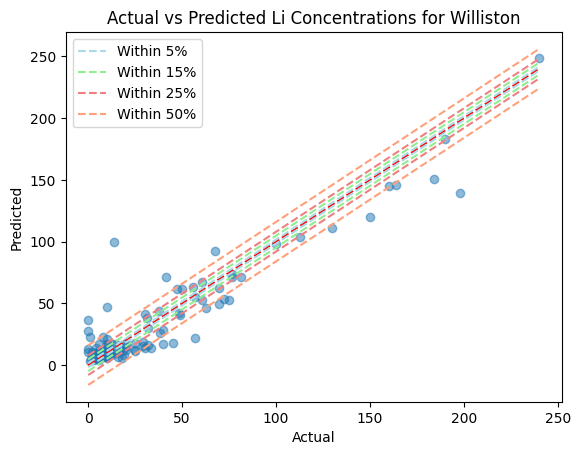

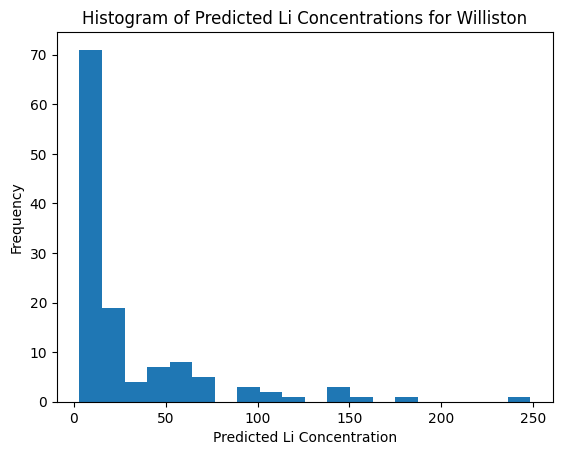

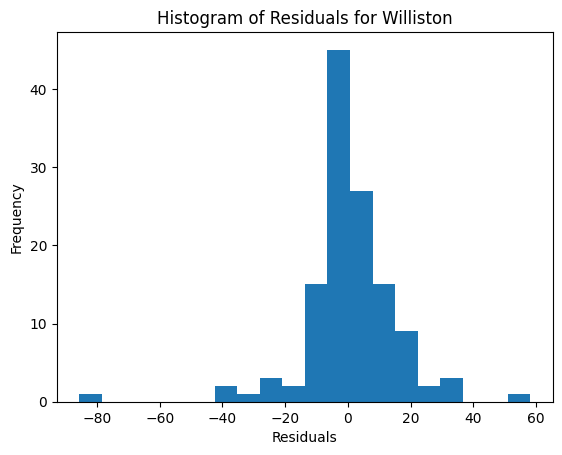

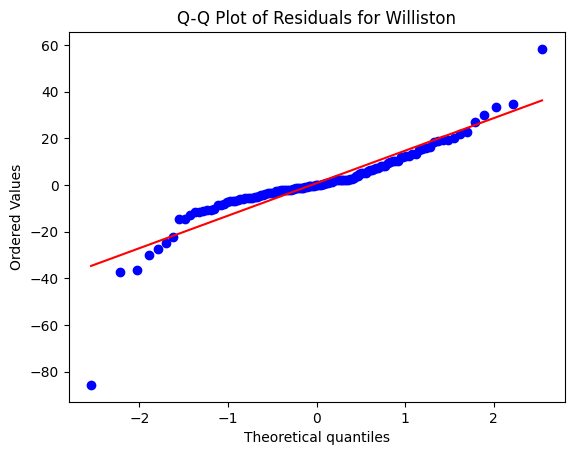

Michigan
Number of data points:  150
Number of samples in the training dataset: 112
Best parameters: {'C': 40, 'epsilon': 0.4, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 338.1750457756233
MSE of the model: 87.49544548122952
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 9.353900014498205
MAE of the best SVR model: 5.862978730039566
R-squared (Coefficient of Determination): 0.7412717272483726
Percentage of predictions within 5% of the correct values: 26.31578947368421
Percentage of predictions within 15% of the correct values: 50.0
Percentage of predictions within 25% of the correct values: 78.94736842105263
Percentage of predictions within 50% of the correct values: 86.8421052631579
-------------------------------


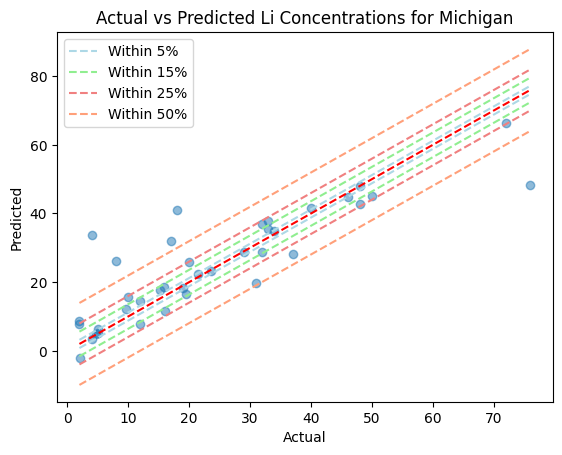

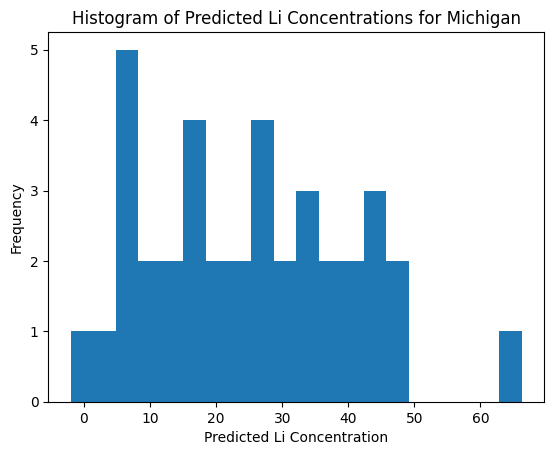

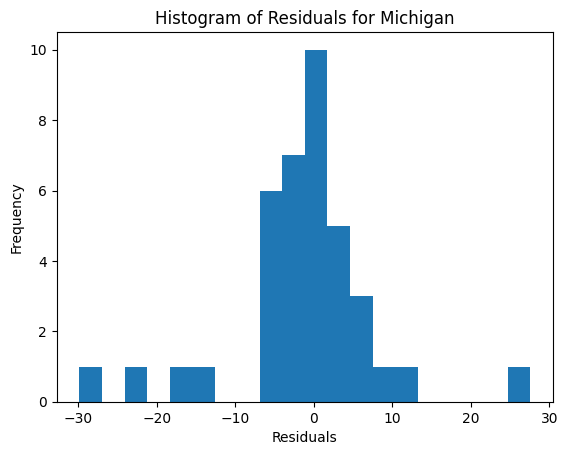

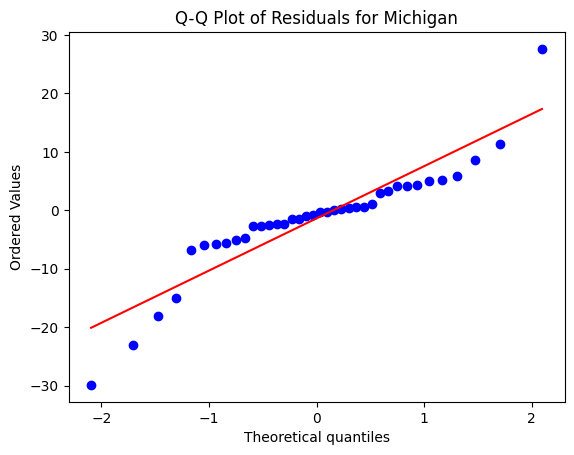

Pacific
Number of data points:  145
Number of samples in the training dataset: 108
Best parameters: {'C': 50, 'epsilon': 0.4, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8.383484514243975
MSE of the model: 0.8190939570583857
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 0.9050380970204435
MAE of the best SVR model: 0.6912403605988426
R-squared (Coefficient of Determination): 0.9022967173534223
Percentage of predictions within 5% of the correct values: 8.108108108108109
Percentage of predictions within 15% of the correct values: 27.027027027027028
Percentage of predictions within 25% of the correct values: 51.35135135135135
Percentage of predictions within 50% of the correct values: 75.67567567567568
-------------------------------


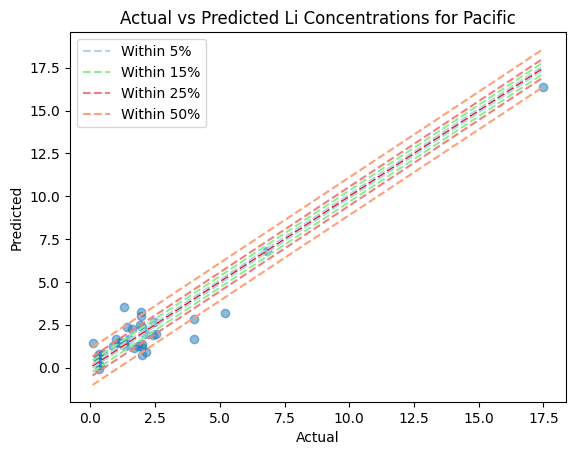

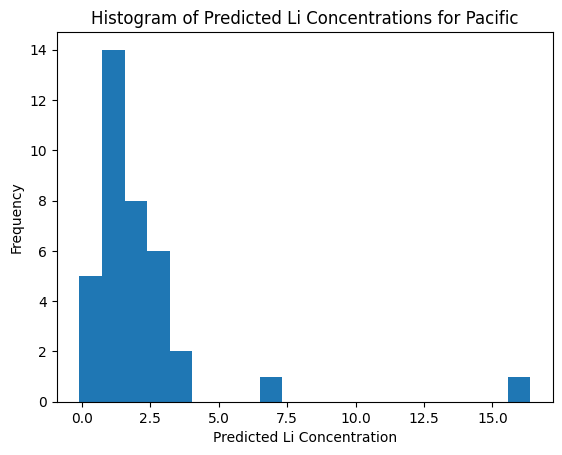

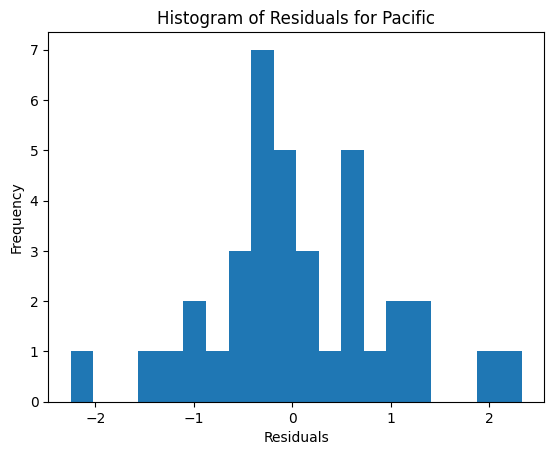

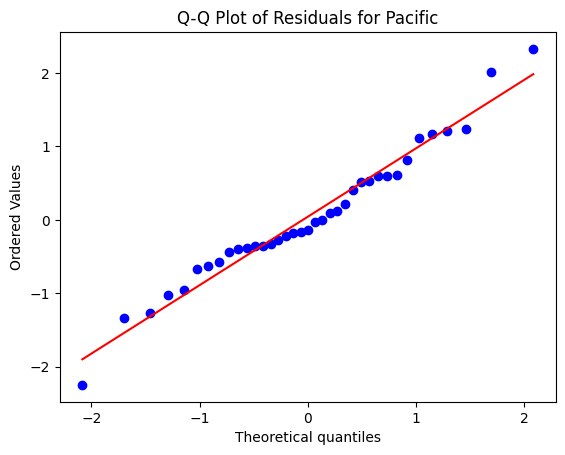

Illinois
Number of data points:  25
Number of samples in the training dataset: 18
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 155.8923551020408
MSE of the model: 67.97607483650754
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 8.24476044749073
MAE of the best SVR model: 5.270459036437231
R-squared (Coefficient of Determination): 0.5639550458262488
Percentage of predictions within 5% of the correct values: 28.57142857142857
Percentage of predictions within 15% of the correct values: 57.14285714285714
Percentage of predictions within 25% of the correct values: 71.42857142857143
Percentage of predictions within 50% of the correct values: 71.42857142857143
-------------------------------


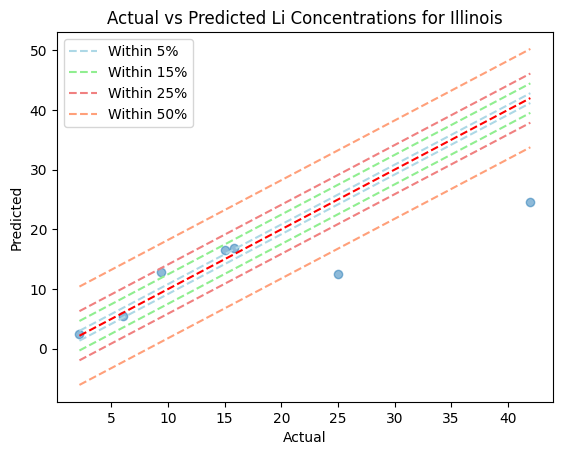

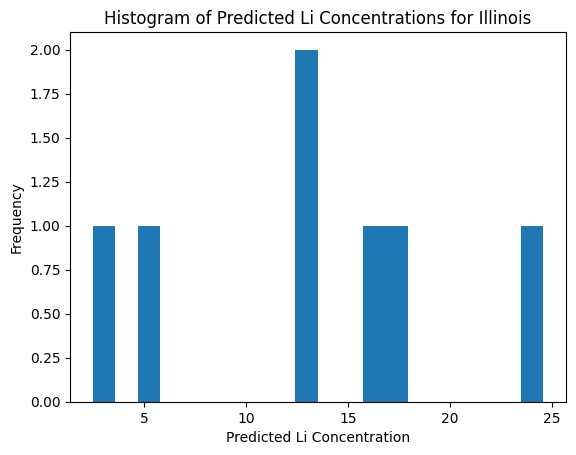

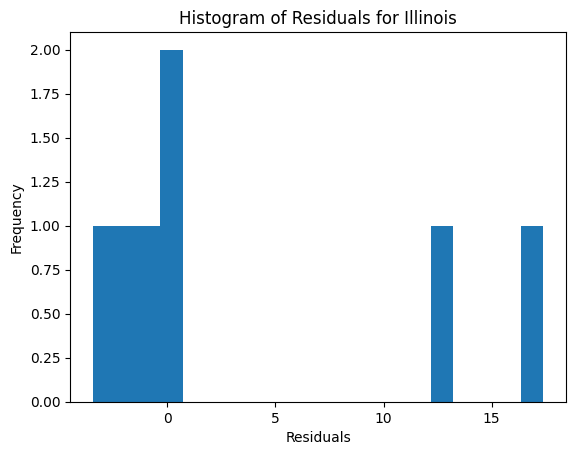

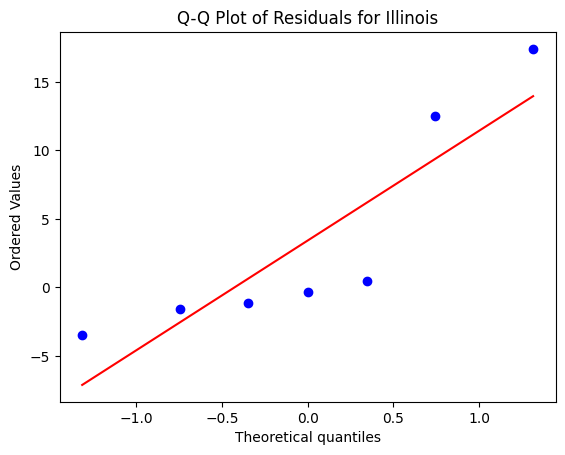

Great Plains
Number of data points:  62
Number of samples in the training dataset: 46
Best parameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 30765.013448437494
MSE of the model: 32997.49029340695
The model's MSE is close to or larger than the variance of the target variable.
The model's performance may be limited compared to the variability of the target variable.
RMSE of the model: 181.652113374458
MAE of the best SVR model: 46.96613185060866
R-squared (Coefficient of Determination): -0.07256544349350302
Percentage of predictions within 5% of the correct values: 68.75
Percentage of predictions within 15% of the correct values: 87.5
Percentage of predictions within 25% of the correct values: 93.75
Percentage of predictions within 50% of the correct values: 93.75
-------------------------------


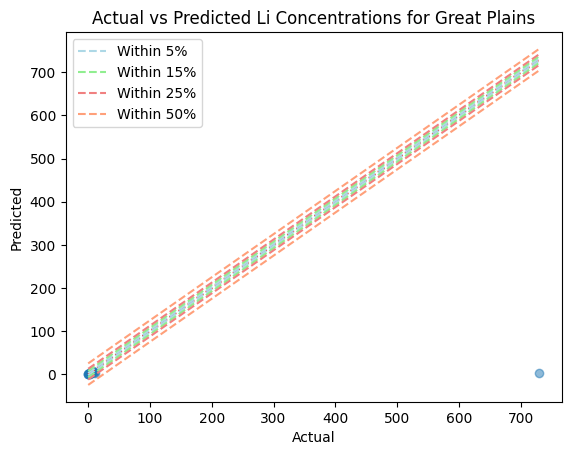

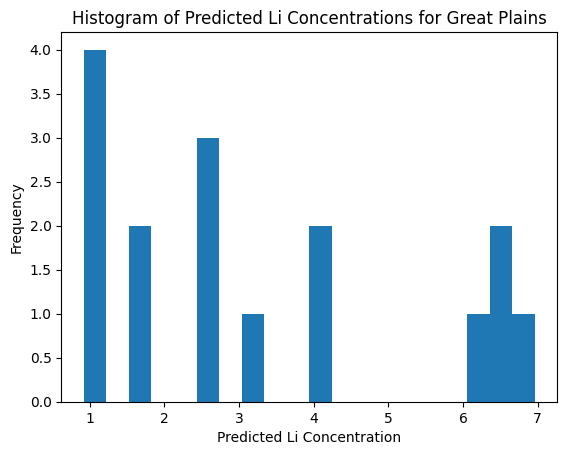

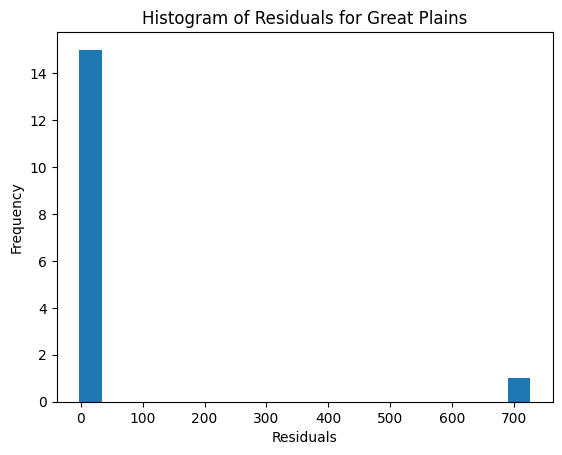

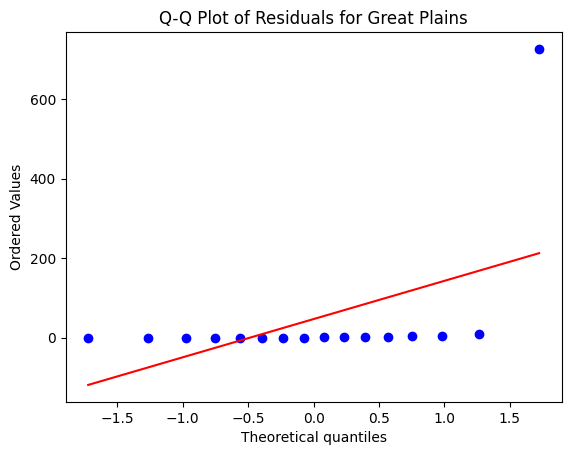

Anadarko
Number of data points:  262
Number of samples in the training dataset: 196
Best parameters: {'C': 20, 'epsilon': 0.3, 'kernel': 'poly'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 8090.751883310375
MSE of the model: 3476.6858453589916
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 58.96342803262876
MAE of the best SVR model: 17.728987073337677
R-squared (Coefficient of Determination): 0.5702889057158324
Percentage of predictions within 5% of the correct values: 24.242424242424242
Percentage of predictions within 15% of the correct values: 59.09090909090909
Percentage of predictions within 25% of the correct values: 68.18181818181817
Percentage of predictions within 50% of the correct values: 78.78787878787878
-------------------------------


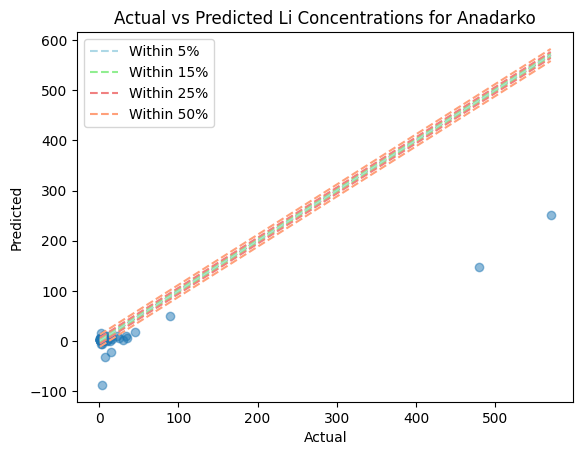

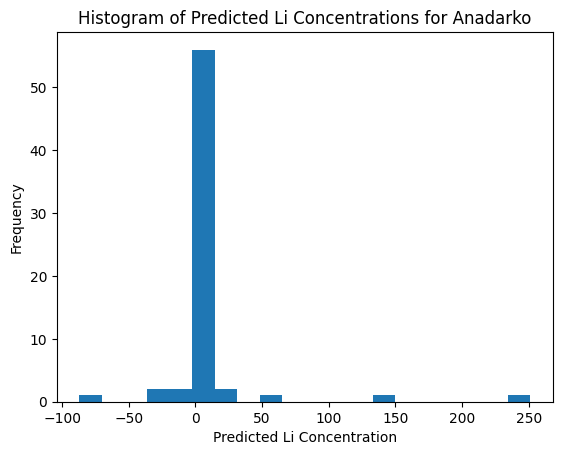

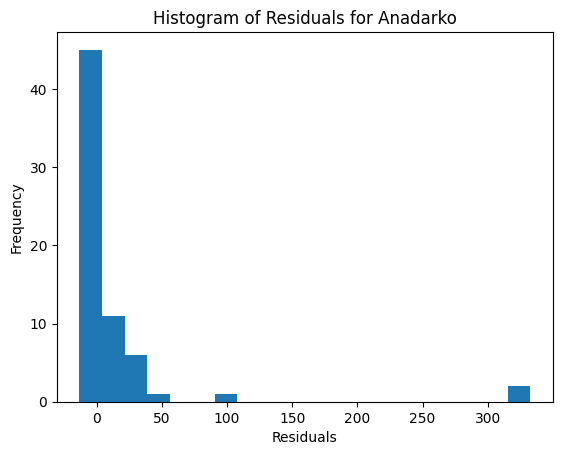

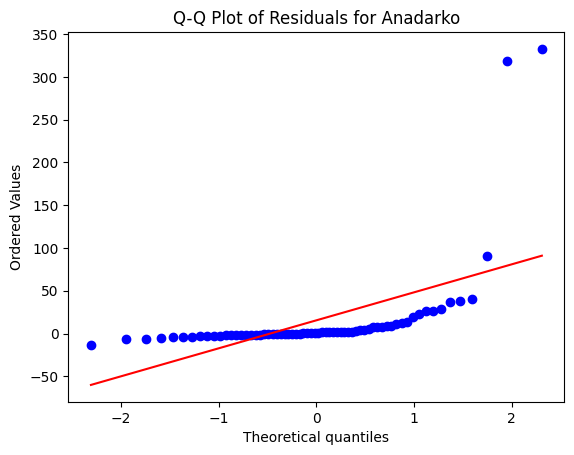

Rocky Mountain
Number of data points:  693
Number of samples in the training dataset: 519
Best parameters: {'C': 50, 'epsilon': 0.4, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 175.57252920134763
MSE of the model: 52.50495298039626
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 7.24603015315257
MAE of the best SVR model: 3.298348279754515
R-squared (Coefficient of Determination): 0.7009500676487763
Percentage of predictions within 5% of the correct values: 16.091954022988507
Percentage of predictions within 15% of the correct values: 40.804597701149426
Percentage of predictions within 25% of the correct values: 58.620689655172406
Percentage of predictions within 50% of the correct values: 78.73563218390804
-------------------------------


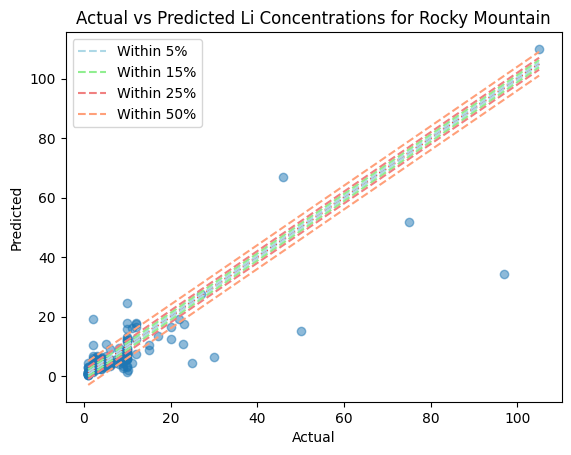

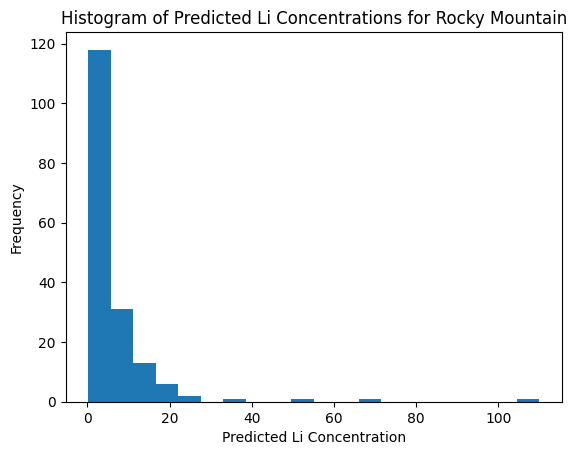

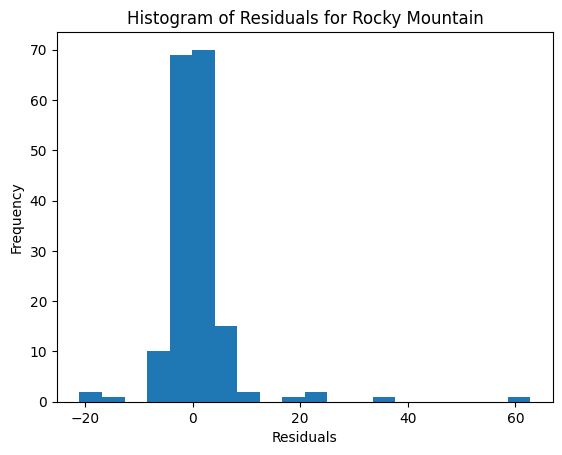

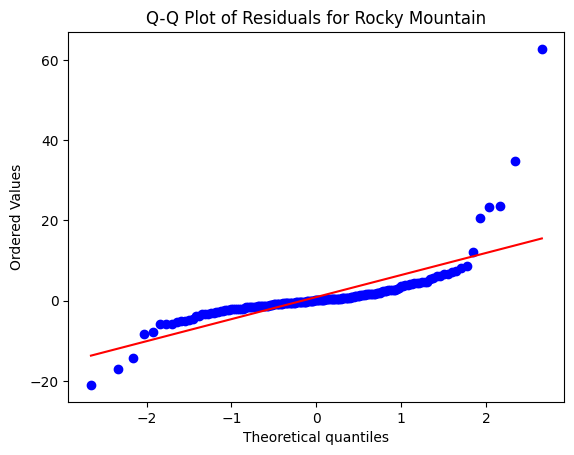

Fort Worth
Number of data points:  17
Number of samples in the training dataset: 12
Best parameters: {'C': 20, 'epsilon': 0.1, 'kernel': 'rbf'}
-------------------------------
MODEL PERFORMANCE METRICS
-------------------------------
Variance of the target variable: 1038.8281839999997
MSE of the model: 950.4072050284915
The model's MSE is smaller than the variance of the target variable.
The model is capturing a significant portion of the variability in the target variable.
RMSE of the model: 30.828675044972197
MAE of the best SVR model: 18.315354131951477
R-squared (Coefficient of Determination): 0.08511607629958984
Percentage of predictions within 5% of the correct values: 20.0
Percentage of predictions within 15% of the correct values: 20.0
Percentage of predictions within 25% of the correct values: 40.0
Percentage of predictions within 50% of the correct values: 60.0
-------------------------------


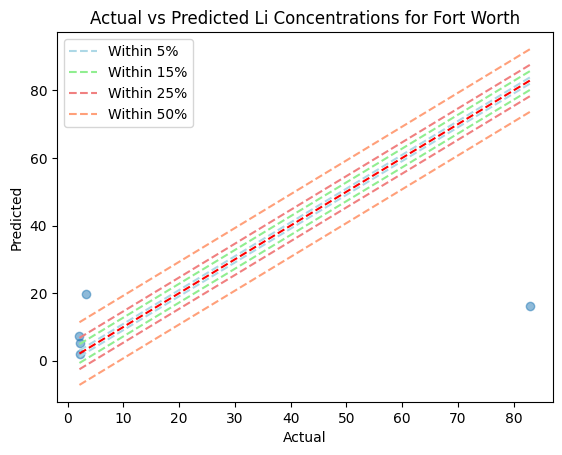

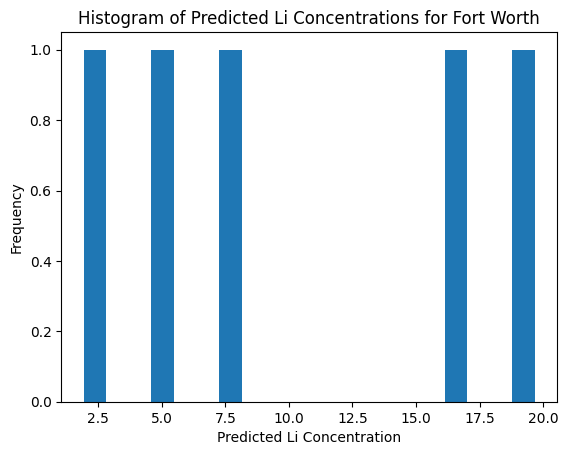

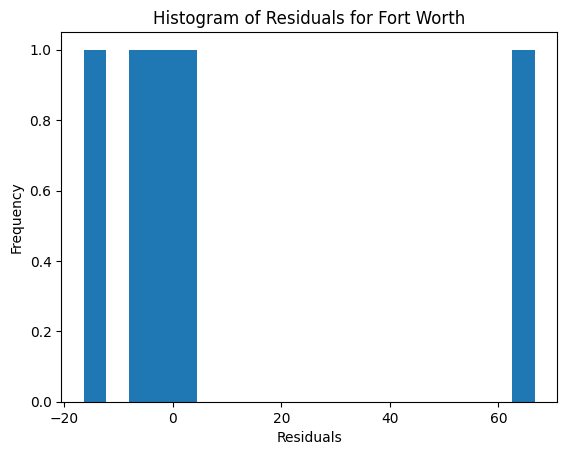

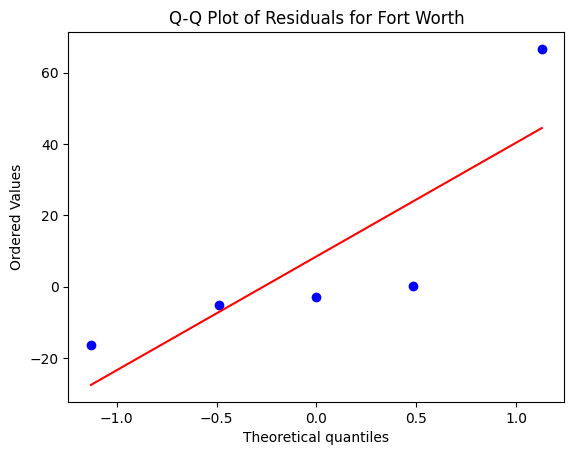

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
8,07_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,30765.01,32997.49,181.65,46.97,-0.07,68.75,87.50,93.75,93.75
3,07_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[rbf, poly]",poly,"[10, 20, 30, 40, 50]",40,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,19313.62,1477.57,38.44,17.57,0.92,35.59,65.77,71.17,82.43
9,07_PCA,Anadarko,262,3,"[PC1, PC2, PC3]","[rbf, poly]",poly,"[10, 20, 30, 40, 50]",20,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.3,8090.75,3476.69,58.96,17.73,0.57,24.24,59.09,68.18,78.79
7,07_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,155.89,67.98,8.24,5.27,0.56,28.57,57.14,71.43,71.43
5,07_PCA,Michigan,150,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",40,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.4,338.18,87.50,9.35,5.86,0.74,26.32,50.00,78.95,86.84
4,07_PCA,Williston,502,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.1,2013.45,224.10,14.97,9.34,0.89,17.46,42.86,61.90,84.13
1,07_PCA,Permian,481,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,4106.05,4023.99,63.43,13.47,0.02,16.53,41.32,64.46,89.26
10,07_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.4,175.57,52.50,7.25,3.30,0.70,16.09,40.80,58.62,78.74
0,07_PCA,Appalachian,652,3,"[PC1, PC2, PC3]","[rbf, poly]",poly,"[10, 20, 30, 40, 50]",10,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,3942.02,1807.09,42.51,25.23,0.54,12.88,33.74,49.08,78.53
2,07_PCA,Oklahoma Platform,254,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",40,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.5,308.40,64.10,8.01,6.17,0.79,12.50,31.25,53.12,84.38


In [59]:
# Define all the variables...
df = df_pca_all_basins.copy()
round = '07_PCA'
basins = df_data['BASIN_CATEGORY'].unique()
test_size = 0.25
random_state = 42
kernel_values = ['rbf', 'poly']
c_values = [10, 20, 30, 40, 50]
epsilon_values = [0.1, 0.2, 0.3, 0.4, 0.5]

# Run the function...
df_round07_pca = generate_svr_models_by_basin_from_pca(df=df, round=round, basins=basins, test_size=test_size, random_state=random_state, 
                                                       kernel_values=kernel_values, c_values=c_values, epsilon_values=epsilon_values)
df_round07_pca

## <ins>Evaluate results df

### Merge all results dfs into 1 large df for evaluation

In [60]:
rounds = [df_round01_pca, df_round02_pca, df_round03_pca, df_round04_pca, df_round05_pca, df_round06_pca, df_round07_pca]

# Concatenate the list of DataFrames into one large DataFrame
df_results_pca = pd.concat(rounds)

# Resetting index to avoid duplicate indices
df_results_pca.reset_index(drop=True, inplace=True)

df_results_pca

,round,basin,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_15_percent,within_25_percent,within_50_percent
0,01_PCA,Great Plains,62,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",1.0,"[0.01, 0.1, 0.5]",0.50,26213.60,27737.61,166.55,39.99,-0.06,68.42,89.47,94.74,94.74
1,01_PCA,Gulf Coast,888,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,16797.04,1341.84,36.63,17.49,0.92,31.46,62.92,69.29,81.65
2,01_PCA,Illinois,25,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,140.91,22.03,4.69,3.24,0.84,25.00,62.50,75.00,87.50
3,01_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,188.67,85.84,9.26,3.68,0.55,20.19,44.23,60.58,80.29
4,01_PCA,Permian,481,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",rbf,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.01,5745.30,5883.58,76.70,16.76,-0.02,17.93,44.14,66.90,89.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,07_PCA,Rocky Mountain,693,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.40,175.57,52.50,7.25,3.30,0.70,16.09,40.80,58.62,78.74
80,07_PCA,Appalachian,652,3,"[PC1, PC2, PC3]","[rbf, poly]",poly,"[10, 20, 30, 40, 50]",10.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,3942.02,1807.09,42.51,25.23,0.54,12.88,33.74,49.08,78.53
81,07_PCA,Oklahoma Platform,254,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",40.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,308.40,64.10,8.01,6.17,0.79,12.50,31.25,53.12,84.38
82,07_PCA,Pacific,145,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.40,8.38,0.82,0.91,0.69,0.90,8.11,27.03,51.35,75.68


### Create df with which model generated highest value within 15% for each basin

In [61]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_within_15_percent_pca = df_results_pca.groupby('basin')['within_15_percent'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_within_15_percent_pca = pd.merge(best_models_within_15_percent_pca, df_results_pca, on=['basin', 'within_15_percent'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_within_15_percent_pca.sort_values(by='within_15_percent',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_within_15_percent_pca.reset_index(drop=True, inplace=True)
df_best_models_within_15_percent_pca

,basin,within_15_percent,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,r2,within_5_percent,within_25_percent,within_50_percent
0,Great Plains,92.00,05_PCA,62,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",10.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,20206.93,21136.23,145.38,30.43,-0.05,68.00,92.00,96.00
1,Anadarko,72.15,02_PCA,262,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,18808.84,11128.34,105.49,22.18,0.41,54.43,78.48,89.87
2,Gulf Coast,65.77,07_PCA,888,3,"[PC1, PC2, PC3]","[rbf, poly]",poly,"[10, 20, 30, 40, 50]",40.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,19313.62,1477.57,38.44,17.57,0.92,35.59,71.17,82.43
3,Gulf Coast,65.77,06_PCA,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[10, 50, 100, 150, 200]",50.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,19313.62,1480.51,38.48,17.58,0.92,36.49,71.17,82.43
4,Illinois,62.50,02_PCA,25,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,140.91,21.66,4.65,3.22,0.85,25.00,75.00,87.50
5,Illinois,62.50,01_PCA,25,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",linear,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,140.91,22.03,4.69,3.24,0.84,25.00,75.00,87.50
6,Pacific,54.05,04_PCA,145,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10]",5.0,"[0.01, 0.05, 0.1]",0.05,8.38,1.25,1.12,0.61,0.85,21.62,64.86,81.08
7,Williston,53.23,05_PCA,502,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",200.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,3119.98,389.38,19.73,10.56,0.88,23.88,67.66,83.08
8,Permian,51.03,02_PCA,481,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.01,5745.30,5826.86,76.33,16.56,-0.01,17.24,68.28,89.66
9,Michigan,50.00,06_PCA,150,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[10, 50, 100, 150, 200]",50.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.40,338.18,86.09,9.28,5.86,0.75,28.95,76.32,86.84


### Create df with which model generated highest value of r2 for each basin

In [63]:
# Grouping by 'basin' and finding the maximum value in 'within_15_percent' column
best_models_r2_pca = df_results_pca.groupby('basin')['r2'].max()

# Merge the max_values with df_results to get the corresponding row for each maximum value
df_best_models_r2_pca = pd.merge(best_models_r2_pca, df_results_pca, on=['basin', 'r2'], how='inner')

# Sort the DataFrame by 'basin' for clarity
df_best_models_r2_pca.sort_values(by='r2',ascending=False, inplace=True)

# Resetting index for clarity
df_best_models_r2_pca.reset_index(drop=True, inplace=True)
df_best_models_r2_pca

,basin,r2,round,data_row_count,feature_quantity,feature_list,kernel_options,best_kernel,c_options,best_c,epsilon_options,best_epsilon,target_variable_variance,mse,rmse,mae,within_5_percent,within_15_percent,within_25_percent,within_50_percent
0,Gulf Coast,0.92,06_PCA,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[10, 50, 100, 150, 200]",50.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,19313.62,1480.51,38.48,17.58,36.49,65.77,71.17,82.43
1,Gulf Coast,0.92,07_PCA,888,3,"[PC1, PC2, PC3]","[rbf, poly]",poly,"[10, 20, 30, 40, 50]",40.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.50,19313.62,1477.57,38.44,17.57,35.59,65.77,71.17,82.43
2,Gulf Coast,0.92,01_PCA,888,3,"[PC1, PC2, PC3]","[linear, rbf, poly]",poly,"[0.1, 1, 10]",10.0,"[0.01, 0.1, 0.5]",0.50,16797.04,1341.84,36.63,17.49,31.46,62.92,69.29,81.65
3,Gulf Coast,0.92,02_PCA,888,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50, 100]",10.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,16797.04,1341.84,36.63,17.49,31.46,62.92,69.29,81.65
4,Gulf Coast,0.92,03_PCA,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10, 50]",50.0,"[0.01, 0.05, 0.1, 0.2]",0.01,19313.62,1476.72,38.43,17.57,35.59,65.32,70.72,82.43
5,Gulf Coast,0.92,04_PCA,888,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",poly,"[0.1, 0.5, 1, 5, 10]",10.0,"[0.01, 0.05, 0.1]",0.05,19313.62,1472.37,38.37,17.56,34.23,65.32,70.72,82.88
6,Pacific,0.91,03_PCA,145,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50.0,"[0.01, 0.05, 0.1, 0.2]",0.20,8.38,0.79,0.89,0.64,13.51,40.54,56.76,83.78
7,Williston,0.89,07_PCA,502,3,"[PC1, PC2, PC3]","[rbf, poly]",rbf,"[10, 20, 30, 40, 50]",50.0,"[0.1, 0.2, 0.3, 0.4, 0.5]",0.10,2013.45,224.10,14.97,9.34,17.46,42.86,61.90,84.13
8,Williston,0.89,03_PCA,502,3,"[PC1, PC2, PC3]","[rbf, poly, sigmoid]",rbf,"[0.1, 0.5, 1, 5, 10, 50]",50.0,"[0.01, 0.05, 0.1, 0.2]",0.01,2013.45,223.96,14.97,9.34,16.67,42.86,61.90,84.13
9,Illinois,0.85,02_PCA,25,3,"[PC1, PC2, PC3]","[linear, rbf, poly, sigmoid]",linear,"[0.1, 0.5, 1, 5, 10, 50, 100]",100.0,"[0.01, 0.05, 0.1, 0.2, 0.5]",0.50,140.91,21.66,4.65,3.22,25.00,62.50,75.00,87.50
